# Imports

In [1]:
import uproot
import awkward as ak
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from mpl_toolkits import mplot3d

# for creating a responsive plot 
%matplotlib widget 
  
# importing required libraries 
from mpl_toolkits.mplot3d import Axes3D 


import pandas as pd
from ipywidgets import interact, IntSlider

# file = uproot.open("histo_OFF.root")
# file_OFF = uproot.open("histo_OFF.root")
file_c3d_ON = uproot.open("histo_ON_c3d.root") #eta_nonUniform/
# file = uproot.open("histo_ON_tc.root")
cmap = plt.get_cmap('viridis')

In [2]:
# plt.figure()
# eta= np.array([-3, -2.5, -2, -1.5, -1, -0.5, 0, 0.5, 1,1.5,2,2.5,3])
# plt.plot(eta, eta_to_theta(eta))
# plt.show()

In [2]:
def eta(x_arr, y_arr, z_arr):
    theta = np.arctan(np.sqrt(x_arr**2 + y_arr**2)/z_arr)
    return -np.log(np.tan(theta/2))

def theta_to_eta(theta):
    return -np.log(np.tan(theta/2))

def eta_to_theta(eta, degree = False):
    if degree == False:
        return np.arctan(np.exp(-eta))*2
    else:
        return np.arctan(np.exp(-eta))*2*180/np.pi

def phi(x_arr, y_arr):
    phi_angle = np.arctan(y_arr/x_arr)

    phi_angle = np.where([a and b for a, b in zip(x_arr<0, y_arr>0)],  phi_angle + np.pi, phi_angle)
    phi_angle = np.where([a and b for a, b in zip(x_arr<0, y_arr<0)],  phi_angle - np.pi, phi_angle)
    
    return phi_angle

def phi_diff(phi1, phi2, find_absolute = False):
    if find_absolute:
        abs_diff = np.abs(phi1 - phi2)
    else:
        abs_diff = phi1 - phi2
    abs_diff = np.where([a for a in abs_diff > np.pi ],  2*np.pi - abs_diff, abs_diff)
    abs_diff = np.where([a for a in abs_diff < -np.pi ],  2*np.pi + abs_diff, abs_diff)
    return abs_diff

In [3]:
# file_OFF.keys()
file_c3d_ON.keys()

['ticlDumper;1',
 'ticlDumper/clusters;2',
 'ticlDumper/clusters;1',
 'ticlDumper/simtrackstersSC;2',
 'ticlDumper/simtrackstersSC;1',
 'ticlDumper/simtrackstersCP;2',
 'ticlDumper/simtrackstersCP;1',
 'ticlDumper/ticlTrackstersCLUE3DHigh;1',
 'ticlDumper/ticlTracksterLinks;1',
 'ticlDumper/ticlCandidate;1',
 'ticlDumper/ticlTracksterLinksSuperclusteringDNN;1',
 'ticlDumper/candidates;1',
 'ticlDumper/associations;1',
 'ticlDumper/tracks;1',
 'ticlDumper/simTICLCandidate;1']

In [7]:
 'ticlDumper/trackstersCLUE3DHigh;1',
 'ticlDumper/trackstersTiclCandidate;1',
 'ticlDumper/simtracksters2HitsSC;1',
 'ticlDumper/simtracksters2HitsCP;1',
 'ticlDumper/trackstersSuperclusteringDNN;1',

('ticlDumper/trackstersSuperclusteringDNN;1',)

In [ ]:
 'ticlDumper/ticlTrackstersCLUE3DHigh;1',
 'ticlDumper/ticlTracksterLinks;1',
 'ticlDumper/ticlCandidate;1',
 'ticlDumper/ticlTracksterLinksSuperclusteringDNN;1',

### PCA original

In [ ]:
import numpy as np
from typing import List, Dict, Tuple, Optional, Union
import logging

# Configure logging for debug output
logging.basicConfig(level=logging.DEBUG)
logger = logging.getLogger(__name__)

def flatten_nested_list(nested_list):
    """Flatten a potentially nested list structure"""
    result = []
    for item in nested_list:
        if isinstance(item, (list, tuple, np.ndarray)):
            result.extend(flatten_nested_list(item))
        else:
            result.append(item)
    return result

class LayerCluster:
    """Represents layer clusters with 3D positions and energies (can handle nested arrays for multiple events)"""
    def __init__(self, x: Union[float, List], y: Union[float, List], z: Union[float, List], 
                 energy: Union[float, List], cluster_type: Union[str, List] = "default" , cluster_n_hits: np.ndarray):
        # Flatten all inputs to handle nested structures
        self.x_values = flatten_nested_list([x]) if not isinstance(x, (list, tuple, np.ndarray)) else flatten_nested_list(x)
        self.y_values = flatten_nested_list([y]) if not isinstance(y, (list, tuple, np.ndarray)) else flatten_nested_list(y)
        self.z_values = flatten_nested_list([z]) if not isinstance(z, (list, tuple, np.ndarray)) else flatten_nested_list(z)
        self.energy_values = flatten_nested_list([energy]) if not isinstance(energy, (list, tuple, np.ndarray)) else flatten_nested_list(energy)
        
        # Handle cluster types
        if isinstance(cluster_type, str):
            self.cluster_types = [cluster_type] * len(self.x_values)
        else:
            self.cluster_types = flatten_nested_list(cluster_type)
            # Pad with default if not enough types provided
            while len(self.cluster_types) < len(self.x_values):
                self.cluster_types.append("default")
        
        # Validate that all arrays have the same length
        lengths = [len(self.x_values), len(self.y_values), len(self.z_values), len(self.energy_values)]
        if not all(l == lengths[0] for l in lengths):
            raise ValueError(f"All input arrays must have the same length. Got lengths: {lengths}")
        
        self.n_clusters = len(self.x_values)
    
    def get_cluster(self, index: int):
        """Get individual cluster data by index"""
        if index >= self.n_clusters:
            raise IndexError(f"Index {index} out of range for {self.n_clusters} clusters")
        return {
            'x': self.x_values[index],
            'y': self.y_values[index], 
            'z': self.z_values[index],
            'energy': self.energy_values[index],
            'cluster_type': self.cluster_types[index]
        }
    
    @property
    def x(self):
        """For backward compatibility - returns first x value"""
        return self.x_values[0] if self.x_values else 0.0
    
    @property
    def y(self):
        """For backward compatibility - returns first y value"""
        return self.y_values[0] if self.y_values else 0.0
    
    @property
    def z(self):
        """For backward compatibility - returns first z value"""
        return self.z_values[0] if self.z_values else 0.0
    
    @property
    def energy(self):
        """For backward compatibility - returns first energy value"""
        return self.energy_values[0] if self.energy_values else 0.0
    
    @property
    def cluster_type(self):
        """For backward compatibility - returns first cluster type"""
        return self.cluster_types[0] if self.cluster_types else "default"

class Vector3D:
    """Simple 3D vector class"""
    def __init__(self, x: float = 0.0, y: float = 0.0, z: float = 0.0):
        self.x = x
        self.y = y
        self.z = z

class Trackster:
    """Represents a trackster with vertices, energy, and PCA properties"""
    def __init__(self):
        self._vertices = []
        self._vertex_multiplicities = []
        self._raw_energy = 0.0
        self._raw_em_energy = 0.0
        self._raw_pt = 0.0
        self._raw_em_pt = 0.0
        self._barycenter = Vector3D()
        self._eigenvalues = np.zeros(3)
        self._eigenvectors = np.zeros((3, 3))
        self._sigmas = np.zeros(3)
        self._sigmas_eigen = np.zeros(3)
    
    def vertices(self, i: Optional[int] = None):
        if i is None:
            return self._vertices
        return self._vertices[i]
    
    def vertex_multiplicity(self, i: int) -> float:
        return self._vertex_multiplicities[i] if i < len(self._vertex_multiplicities) else 1.0
    
    def set_vertex_multiplicity(self, multiplicities: List[float]):
        """Set vertex multiplicities"""
        self._vertex_multiplicities = multiplicities
    
    def compute_vertex_multiplicity(self, n_vertices: int, default_value: float = 1.0) -> List[float]:
        """Compute vertex multiplicities - in your case always 1.0"""
        return [default_value] * n_vertices
    
    def set_raw_energy(self, energy: float):
        self._raw_energy = energy
    
    def add_to_raw_energy(self, energy: float):
        self._raw_energy += energy
    
    def set_raw_em_energy(self, energy: float):
        self._raw_em_energy = energy
    
    def add_to_raw_em_energy(self, energy: float):
        self._raw_em_energy += energy
    
    def set_raw_pt(self, pt: float):
        self._raw_pt = pt
    
    def set_raw_em_pt(self, pt: float):
        self._raw_em_pt = pt
    
    def raw_energy(self) -> float:
        return self._raw_energy
    
    def set_barycenter(self, barycenter: Vector3D):
        self._barycenter = barycenter
    
    def fill_pca_variables(self, eigenvalues: np.ndarray, eigenvectors: np.ndarray, 
                          sigmas: np.ndarray, sigmas_eigen: np.ndarray):
        # Sort eigenvalues and eigenvectors in ascending order
        idx = np.argsort(eigenvalues)
        self._eigenvalues = eigenvalues[idx]
        self._eigenvectors = eigenvectors[:, idx]
        self._sigmas = sigmas
        self._sigmas_eigen = sigmas_eigen

def get_layer_from_lc(cluster_data: dict, rh_tools) -> int:
    """Extract layer information from layer cluster (placeholder implementation)"""
    # This would contain actual layer extraction logic
    return int(abs(cluster_data['z']) / 10)  # Simplified layer calculation

def sort_by_layer(trackster: Trackster, layer_clusters: List[LayerCluster], rh_tools) -> Dict[int, List[int]]:
    """Sort trackster vertices by layer"""
    vertices_by_layer = {}
    for i, vertex_idx in enumerate(trackster.vertices()):
        # Handle the case where vertex_idx might be an array
        if isinstance(vertex_idx, (list, tuple, np.ndarray)):
            # For nested vertices, use the first cluster of the first vertex
            cluster_data = layer_clusters[vertex_idx[0]].get_cluster(0)
        else:
            cluster_data = layer_clusters[vertex_idx].get_cluster(0)
        
        layer = get_layer_from_lc(cluster_data, rh_tools)
        if layer not in vertices_by_layer:
            vertices_by_layer[layer] = []
        vertices_by_layer[layer].append(i)
    return vertices_by_layer

def assign_pca_to_tracksters(tracksters: List[Trackster],
                           layer_clusters: List[LayerCluster],
                           z_limit_em: float,
                           rh_tools=None,
                           energy_weight: bool = True,
                           clean: bool = False,
                           min_layer: int = 10,
                           max_layer: int = 10,
                           masked_cluster_types: List[str] = None) -> None:

    if masked_cluster_types is None:
        masked_cluster_types = []
    
    logger.debug("------- Eigen -------")
    
    for trackster in tracksters:
        logger.debug(f"start testing trackster with size: {len(trackster.vertices())}")
        
        # Initialize vectors
        barycenter = np.zeros(3)
        filtered_barycenter = np.zeros(3)
        
        # Initialize trackster with default values
        trackster.set_raw_energy(0.0)
        trackster.set_raw_em_energy(0.0)
        trackster.set_raw_pt(0.0)
        trackster.set_raw_em_pt(0.0)
        
        # Set vertex multiplicities (always 1.0 in your case)
        N = len(trackster.vertices())
        trackster.set_vertex_multiplicity(trackster.compute_vertex_multiplicity(N))
        
        if N == 0:
            continue
            
        weight = 1.0 / N
        weights2_sum = 0.0
        layer_cluster_energies = []
        
        # Helper function to check if a cluster should be masked
        def is_cluster_masked(cluster_idx: int, sub_cluster_idx: int = 0) -> bool:
            if isinstance(cluster_idx, (list, tuple, np.ndarray)):
                cluster_idx = cluster_idx[0]  # Use first cluster if nested
            cluster_data = layer_clusters[cluster_idx].get_cluster(sub_cluster_idx)
            return cluster_data['cluster_type'] in masked_cluster_types
        
        # Helper function to process cluster data (handles nested arrays)
        def process_cluster(vertex_idx, i):
            if isinstance(vertex_idx, (list, tuple, np.ndarray)):
                # Handle nested vertices - process all sub-clusters
                total_energy = 0.0
                weighted_pos = np.zeros(3)
                total_weight = 0.0
                
                for sub_vertex in vertex_idx:
                    layer_cluster = layer_clusters[sub_vertex]
                    for j in range(layer_cluster.n_clusters):
                        cluster_data = layer_cluster.get_cluster(j)
                        total_energy += cluster_data['energy']
                        
                        if energy_weight:
                            w = cluster_data['energy']
                        else:
                            w = 1.0
                        
                        weighted_pos += w * np.array([cluster_data['x'], cluster_data['y'], cluster_data['z']])
                        total_weight += w
                
                if total_weight > 0:
                    weighted_pos /= total_weight
                
                return total_energy, weighted_pos
            else:
                # Handle single vertex
                layer_cluster = layer_clusters[vertex_idx]
                
                if layer_cluster.n_clusters == 1:
                    cluster_data = layer_cluster.get_cluster(0)
                    energy = cluster_data['energy']
                    pos = np.array([cluster_data['x'], cluster_data['y'], cluster_data['z']])
                    return energy, pos
                else:
                    # Multiple clusters in single LayerCluster
                    total_energy = sum(layer_cluster.energy_values)
                    if energy_weight:
                        weighted_pos = np.zeros(3)
                        total_weight = 0.0
                        for j in range(layer_cluster.n_clusters):
                            cluster_data = layer_cluster.get_cluster(j)
                            w = cluster_data['energy']
                            weighted_pos += w * np.array([cluster_data['x'], cluster_data['y'], cluster_data['z']])
                            total_weight += w
                        if total_weight > 0:
                            weighted_pos /= total_weight
                    else:
                        # Simple average
                        weighted_pos = np.array([
                            np.mean(layer_cluster.x_values),
                            np.mean(layer_cluster.y_values), 
                            np.mean(layer_cluster.z_values)
                        ])
                    return total_energy, weighted_pos
        
        # Calculate raw energies and barycenter (INCLUDE all clusters for energy)
        for i in range(N):
            vertex_idx = trackster.vertices(i)
            fraction = 1.0 / trackster.vertex_multiplicity(i)
            
            cluster_energy, cluster_pos = process_cluster(vertex_idx, i)
            
            trackster.add_to_raw_energy(cluster_energy * fraction)
            if abs(cluster_pos[2]) <= z_limit_em:  # z-coordinate check
                trackster.add_to_raw_em_energy(cluster_energy * fraction)
            
            # Compute weighted barycenter (INCLUDE all clusters for barycenter)
            if energy_weight:
                weight = cluster_energy * fraction
            
            point = weight * cluster_pos
            barycenter += point
            
            layer_cluster_energies.append(cluster_energy)
        
        raw_energy = trackster.raw_energy()
        inv_raw_energy = 1.0 / raw_energy if raw_energy > 0 else 0.0
        
        if energy_weight and raw_energy > 0:
            barycenter *= inv_raw_energy
            
        trackster.set_barycenter(Vector3D(barycenter[0], barycenter[1], barycenter[2]))
        
        logger.debug(f"cleaning is: {clean}")
        
        # Filtering for cleaned PCA
        filtered_idx = []
        filtered_energy = 0.0
        inv_filtered_energy = 0.0
        
        logger.debug(f"min, max {min_layer}  {max_layer}")
        logger.debug(f"Use energy weighting: {energy_weight}")
        logger.debug(f"Trackster characteristics:")
        logger.debug(f"Size: {N}")
        logger.debug(f"Energy: {trackster.raw_energy()}")
        logger.debug(f"Means: {barycenter[0]}, {barycenter[1]}, {barycenter[2]}")
        
        # PCA computation (only for tracksters with more than 2 clusters)
        if N > 2:
            sigmas = np.zeros(3)
            sigmas_eigen = np.zeros(3)
            cov_matrix = np.zeros((3, 3))
            weights2_sum = 0.0
            

            indices_to_use = [i for i in range(N) if not is_cluster_masked(trackster.vertices(i))]
            
            reference_barycenter = barycenter
            reference_inv_energy = inv_raw_energy
            
            # Skip PCA if no valid clusters remain after masking
            if len(indices_to_use) <= 2:
                logger.warning(f"Not enough unmasked clusters for PCA: {len(indices_to_use)}")
                trackster.fill_pca_variables(np.zeros(3), np.eye(3), np.zeros(3), np.zeros(3))
                continue
            
            # Compute covariance matrix
            for i in indices_to_use:
                vertex_idx = trackster.vertices(i)
                cluster_energy, cluster_pos = process_cluster(vertex_idx, i)
                
                if energy_weight and raw_energy > 0:
                    weight = (cluster_energy / trackster.vertex_multiplicity(i)) * reference_inv_energy
                else:
                    weight = 1.0 / len(indices_to_use)
                
                weights2_sum += weight * weight
                
                # Update covariance matrix
                diff = cluster_pos - reference_barycenter
                cov_matrix += weight * np.outer(diff, diff)
            
            # Normalize covariance matrix
            if weights2_sum < 1.0:
                cov_matrix /= (1.0 - weights2_sum)
            
            # Perform eigendecomposition
            try:
                eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
                
                # Compute spreads in original and PCA spaces
                for i in indices_to_use:
                    vertex_idx = trackster.vertices(i)
                    cluster_energy, cluster_pos = process_cluster(vertex_idx, i)
                    
                    if energy_weight and raw_energy > 0:
                        weight = (cluster_energy / trackster.vertex_multiplicity(i)) * reference_inv_energy
                    else:
                        weight = 1.0 / len(indices_to_use)
                    
                    # Original space spread
                    diff = cluster_pos - reference_barycenter
                    sigmas += weight * (diff ** 2)
                    
                    # PCA space spread
                    point_transformed = eigenvectors.T @ diff
                    sigmas_eigen += weight * (point_transformed ** 2)
                
                # Normalize spreads
                if weights2_sum < 1.0:
                    sigmas /= (1.0 - weights2_sum)
                    sigmas_eigen /= (1.0 - weights2_sum)
                
                # Store PCA results in trackster
                trackster.fill_pca_variables(eigenvalues, eigenvectors, sigmas, sigmas_eigen)
                
                logger.debug(f"EigenValues from Eigen/Tr(cov): {eigenvalues[2]/np.trace(cov_matrix)}, "
                           f"{eigenvalues[1]/np.trace(cov_matrix)}, {eigenvalues[0]/np.trace(cov_matrix)}")
                logger.debug(f"EigenValues from Eigen: {eigenvalues[2]}, {eigenvalues[1]}, {eigenvalues[0]}")
                logger.debug(f"EigenVector 3 from Eigen: {eigenvectors[0, 2]}, {eigenvectors[1, 2]}, {eigenvectors[2, 2]}")
                logger.debug(f"Original sigmas: {sigmas[0]}, {sigmas[1]}, {sigmas[2]}")
                logger.debug(f"SigmasEigen in PCA space: {sigmas_eigen[2]}, {sigmas_eigen[1]}, {sigmas_eigen[0]}")
                logger.debug(f"covM:\n{cov_matrix}")
                
            except np.linalg.LinAlgError:
                logger.warning("Eigendecomposition failed for trackster")
                # Set default values
                trackster.fill_pca_variables(np.zeros(3), np.eye(3), np.zeros(3), np.zeros(3))

## Trial

In [41]:
# Example usage:
if __name__ == "__main__":
    # Create sample data
    clusters = [
        LayerCluster(1.0, 2.0, 10.0, 5.0),
        LayerCluster(1.1, 2.1, 11.0, 4.0),
        LayerCluster(1.2, 2.2, 12.0, 6.0)
    ]
    
    trackster = Trackster()
    trackster._vertices = [0, 1, 2]
    trackster._vertex_multiplicities = [1.0, 1.0, 1.0]
    
    
    assign_pca_to_tracksters([trackster], clusters, 
                           z_limit_em=50.0, energy_weight=True, clean=False)

DEBUG:__main__:------- Eigen -------
DEBUG:__main__:start testing trackster with size: 3
DEBUG:__main__:cleaning is: False
DEBUG:__main__:min, max 10  10
DEBUG:__main__:Use energy weighting: True
DEBUG:__main__:Trackster characteristics:
DEBUG:__main__:Size: 3
DEBUG:__main__:Energy: 15.0
DEBUG:__main__:Means: 1.1066666666666667, 2.106666666666667, 11.066666666666666
DEBUG:__main__:EigenValues from Eigen/Tr(cov): 1.0000000000000004, 7.008792257178738e-17, -2.159396902806222e-17
DEBUG:__main__:EigenValues from Eigen: 1.1302702702702707, 7.921829518789589e-17, -2.440702120955573e-17
DEBUG:__main__:EigenVector 3 from Eigen: 0.09901475429766735, 0.09901475429766796, 0.9901475429766744
DEBUG:__main__:Original sigmas: 0.011081081081081074, 0.011081081081081101, 1.1081081081081081
DEBUG:__main__:SigmasEigen in PCA space: 1.1302702702702705, 3.524944296511295e-32, 2.2712971829648636e-32
DEBUG:__main__:covM:
[[0.01108108 0.01108108 0.11081081]
 [0.01108108 0.01108108 0.11081081]
 [0.11081081 0.1

In [64]:
vertices_indexes_simSC_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["vertices_indexes" ], library= "ak")["vertices_indexes"]
# vertices_indexes_simSC_ON[0][0]

cluster_n_hits_simSC_ON = file_c3d_ON["ticlDumper/clusters"].arrays(["cluster_number_of_hits" ], library= "ak")['cluster_number_of_hits']
# cluster_n_hits_simSC_ON[0]

cluster_type_simSC_ON = file_c3d_ON["ticlDumper/clusters"].arrays(["cluster_type" ], library= "ak")['cluster_type']
# cluster_type_simSC_ON[0][9:20]

DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCAL/histo_ON_c3d.root
DEBUG:fsspec.local:open file: C:/Users/chand/Desktop/HEP_CMS/HGCA

In [21]:
# cluster_n_hits[0]
print(x_simSC_ON[0][0], len(x_simSC_ON[0][0]))
print(cluster_type[0], len(cluster_type[0]))

[-83.5, -84.5, -86.3, -89.2, -90, -87.8, ..., -80.3, -74.7, -75, -73, -82.4] 57
[1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 5, ..., 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5] 57


In [24]:
# print(x_simSC_ON[0][0], len(x_simSC_ON[0][0]))
# print(vertices_indexes_simSC_ON[0][0] , len(vertices_indexes_simSC_ON[0][0]))
# x_simSC_ON[0][0]
# baryenergy_raw_SC_ON[0]
# bary_z_SC_ON[0]
print(evector_x_SC_ON[0], evector_y_SC_ON[0], evector_z_SC_ON[0])

[-0.17] [0.0874] [0.982]


# LC1rm

In [4]:
# LC with just 1 hits are removed from everywhere except from scintillators

### PCA changed

In [7]:
import numpy as np
from typing import List, Dict, Tuple, Optional, Union
import logging

# Configure logging for debug output
logging.basicConfig(level=logging.DEBUG)
logger = logging.getLogger(__name__)

def flatten_nested_list(nested_list):
    """Flatten a potentially nested list structure"""
    # Handle scalar values directly
    if not isinstance(nested_list, (list, tuple, np.ndarray)):
        return [nested_list]
    
    result = []
    for item in nested_list:
        if isinstance(item, (list, tuple, np.ndarray)):
            result.extend(flatten_nested_list(item))
        else:
            result.append(item)
    return result

class LayerCluster:
    """Represents layer clusters with 3D positions and energies (can handle nested arrays for multiple events)"""
    def __init__(self, x: Union[float, List], y: Union[float, List], z: Union[float, List], 
                 energy: Union[float, List], cluster_type: Union[str, List] = "default", 
                 cluster_n_hits: Union[int, List, np.ndarray] = 1):
        # Flatten all inputs to handle nested structures
        self.x_values = flatten_nested_list([x]) 
        self.y_values = flatten_nested_list([y]) 
        self.z_values = flatten_nested_list([z]) 
        self.energy_values = flatten_nested_list([energy]) 
        
        # Handle cluster types
        if isinstance(cluster_type, (str, int, float, np.integer, np.floating)):
            self.cluster_types = [cluster_type] * len(self.x_values)
        else:
            self.cluster_types = flatten_nested_list(cluster_type)
            # Pad with default if not enough types provided
            while len(self.cluster_types) < len(self.x_values):
                self.cluster_types.append("default")
        
        # Handle cluster_n_hits
        if isinstance(cluster_n_hits, (int, float, np.integer, np.floating)):
            self.cluster_n_hits_values = [int(cluster_n_hits)] * len(self.x_values)
        else:
            self.cluster_n_hits_values = [int(x) for x in flatten_nested_list(cluster_n_hits)]
            # Pad with 1 if not enough values provided
            while len(self.cluster_n_hits_values) < len(self.x_values):
                self.cluster_n_hits_values.append(1)
        
        # Validate that all arrays have the same length
        lengths = [len(self.x_values), len(self.y_values), len(self.z_values), 
                  len(self.energy_values), len(self.cluster_n_hits_values)]
        if not all(l == lengths[0] for l in lengths):
            raise ValueError(f"All input arrays must have the same length. Got lengths: {lengths}")
        
        self.n_clusters = len(self.x_values)
    
    def get_cluster(self, index: int):
        """Get individual cluster data by index"""
        if index >= self.n_clusters:
            raise IndexError(f"Index {index} out of range for {self.n_clusters} clusters")
        return {
            'x': self.x_values[index],
            'y': self.y_values[index], 
            'z': self.z_values[index],
            'energy': self.energy_values[index],
            'cluster_type': self.cluster_types[index],
            'cluster_n_hits': self.cluster_n_hits_values[index]
        }
    
    @property
    def x(self):
        """For backward compatibility - returns first x value"""
        return self.x_values[0] if self.x_values else 0.0
    
    @property
    def y(self):
        """For backward compatibility - returns first y value"""
        return self.y_values[0] if self.y_values else 0.0
    
    @property
    def z(self):
        """For backward compatibility - returns first z value"""
        return self.z_values[0] if self.z_values else 0.0
    
    @property
    def energy(self):
        """For backward compatibility - returns first energy value"""
        return self.energy_values[0] if self.energy_values else 0.0
    
    @property
    def cluster_type(self):
        """For backward compatibility - returns first cluster type"""
        return self.cluster_types[0] if self.cluster_types else "default"
    
    @property
    def cluster_n_hits(self):
        """For backward compatibility - returns first cluster_n_hits value"""
        return self.cluster_n_hits_values[0] if self.cluster_n_hits_values else 1

class Vector3D:
    """Simple 3D vector class"""
    def __init__(self, x: float = 0.0, y: float = 0.0, z: float = 0.0):
        self.x = x
        self.y = y
        self.z = z

class Trackster:
    """Represents a trackster with vertices, energy, and PCA properties"""
    def __init__(self):
        self._vertices = []
        self._vertex_multiplicities = []
        self._NCLusters_for_PCA = 0
        self._raw_energy = 0.0
        self._raw_em_energy = 0.0
        self._raw_pt = 0.0
        self._raw_em_pt = 0.0
        self._barycenter = Vector3D()
        self._eigenvalues = np.zeros(3)
        self._eigenvectors = np.zeros((3, 3))
        self._sigmas = np.zeros(3)
        self._sigmas_eigen = np.zeros(3)
    
    def vertices(self, i: Optional[int] = None):
        if i is None:
            return self._vertices
        return self._vertices[i]
    
    def vertex_multiplicity(self, i: int) -> float:
        return self._vertex_multiplicities[i] if i < len(self._vertex_multiplicities) else 1.0
    
    def set_vertex_multiplicity(self, multiplicities: List[float]):
        """Set vertex multiplicities"""
        self._vertex_multiplicities = multiplicities
    
    def compute_vertex_multiplicity(self, n_vertices: int, default_value: float = 1.0) -> List[float]:
        """Compute vertex multiplicities - in your case always 1.0"""
        return [default_value] * n_vertices
    
    def set_raw_energy(self, energy: float):
        self._raw_energy = energy
    
    def add_to_raw_energy(self, energy: float):
        self._raw_energy += energy
    
    def set_raw_em_energy(self, energy: float):
        self._raw_em_energy = energy
    
    def add_to_raw_em_energy(self, energy: float):
        self._raw_em_energy += energy
    
    def set_raw_pt(self, pt: float):
        self._raw_pt = pt
    
    def set_raw_em_pt(self, pt: float):
        self._raw_em_pt = pt

    def set_NCLusters_for_PCA(self, NCluster: int):
        self._NCLusters_for_PCA = NCluster
    
    def raw_energy(self) -> float:
        return self._raw_energy
    
    def set_barycenter(self, barycenter: Vector3D):
        self._barycenter = barycenter
    
    def fill_pca_variables(self, eigenvalues: np.ndarray, eigenvectors: np.ndarray, 
                          sigmas: np.ndarray, sigmas_eigen: np.ndarray):
        # Sort eigenvalues and eigenvectors in ascending order
        idx = np.argsort(eigenvalues)
        self._eigenvalues = eigenvalues[idx]
        self._eigenvectors = eigenvectors[:, idx]
        self._sigmas = sigmas
        self._sigmas_eigen = sigmas_eigen

def get_layer_from_lc(cluster_data: dict, rh_tools) -> int:
    """Extract layer information from layer cluster (placeholder implementation)"""
    # This would contain actual layer extraction logic
    return int(abs(cluster_data['z']) / 10)  # Simplified layer calculation

def sort_by_layer(trackster: Trackster, layer_clusters: List[LayerCluster], rh_tools) -> Dict[int, List[int]]:
    """Sort trackster vertices by layer"""
    vertices_by_layer = {}
    for i, vertex_idx in enumerate(trackster.vertices()):
        cluster_data = layer_clusters[vertex_idx].get_cluster(0)
        
        layer = get_layer_from_lc(cluster_data, rh_tools)
        if layer not in vertices_by_layer:
            vertices_by_layer[layer] = []
        vertices_by_layer[layer].append(i)
    return vertices_by_layer

def should_mask_cluster(cluster_data: dict, masked_cluster_types: List[str] = None) -> bool:
    """
    Determine if a cluster should be masked based on cluster_n_hits and cluster_type.
    
    Masking rule: Mask LayerClusters with cluster_n_hits == 1 for all cluster_types 
    EXCEPT when cluster_type == 6.
    
    Args:
        cluster_data: Dictionary containing cluster information
        masked_cluster_types: Legacy parameter for backward compatibility
        
    Returns:
        bool: True if cluster should be masked, False otherwise
    """
    cluster_type = cluster_data.get('cluster_type', 'default')
    cluster_n_hits = cluster_data.get('cluster_n_hits', 1)

    # return False

    # Mask clusters with n_hits == 1, EXCEPT when cluster_type == 6
    if cluster_n_hits == 1:
        if cluster_type == 6: 
            return False  # Don't mask cluster_type 6 even if n_hits == 1
        else:
            return True   # Mask all other cluster types when n_hits == 1
    
    # Also apply legacy masking based on masked_cluster_types if provided
    if masked_cluster_types and cluster_data.get('cluster_type') in masked_cluster_types:
        return True
    
    return False

def assign_pca_to_tracksters(tracksters: List[Trackster],
                           layer_clusters: List[LayerCluster],
                           z_limit_em: float,
                           rh_tools=None,
                           energy_weight: bool = True,
                           clean: bool = False,
                           min_layer: int = 10,
                           max_layer: int = 10,
                           masked_cluster_types: List[str] = None) -> None:

    if masked_cluster_types is None:
        masked_cluster_types = []
    
    # logger.debug("------- Eigen -------")
    
    for trackster in tracksters:
        # logger.debug(f"start testing trackster with size: {len(trackster.vertices())}")
        
        # Initialize vectors
        barycenter = np.zeros(3)
        filtered_barycenter = np.zeros(3)
        
        # Initialize trackster with default values
        trackster.set_raw_energy(0.0)
        trackster.set_raw_em_energy(0.0)
        trackster.set_raw_pt(0.0)
        trackster.set_raw_em_pt(0.0)
        trackster.set_NCLusters_for_PCA(0)
        
        # Set vertex multiplicities (always 1.0 in your case)
        N = len(trackster.vertices())
        trackster.set_vertex_multiplicity(trackster.compute_vertex_multiplicity(N))
        
        if N == 0:
            continue
            
        weight = 1.0 / N
        weights2_sum = 0.0
        layer_cluster_energies = []
        
        # Helper function to check if a cluster should be masked
        def is_cluster_masked(cluster_idx: int, sub_cluster_idx: int = 0) -> bool:
            cluster_data = layer_clusters[cluster_idx].get_cluster(sub_cluster_idx)
            return should_mask_cluster(cluster_data, masked_cluster_types)
        
        def process_cluster( i):
            # print('vertex_idx ' , vertex_idx)
            layer_cluster = layer_clusters[i]
            
            if layer_cluster.n_clusters == 1:
                cluster_data = layer_cluster.get_cluster(0)
                energy = cluster_data['energy']
                pos = np.array([cluster_data['x'], cluster_data['y'], cluster_data['z']])
                return energy, pos
            else:
                # Multiple clusters in single LayerCluster
                total_energy = sum(layer_cluster.energy_values)
                if energy_weight:
                    weighted_pos = np.zeros(3)
                    total_weight = 0.0
                    for j in range(layer_cluster.n_clusters):
                        cluster_data = layer_cluster.get_cluster(j)
                        w = cluster_data['energy']
                        weighted_pos += w * np.array([cluster_data['x'], cluster_data['y'], cluster_data['z']])
                        total_weight += w
                    if total_weight > 0:
                        weighted_pos /= total_weight
                else:
                    # Simple average
                    weighted_pos = np.array([
                        np.mean(layer_cluster.x_values),
                        np.mean(layer_cluster.y_values), 
                        np.mean(layer_cluster.z_values)
                    ])
                return total_energy, weighted_pos
        
        # Calculate raw energies and barycenter (INCLUDE all clusters for energy)
        for i in range(N):
            # vertex_idx = trackster.vertices(i)
            fraction = 1.0 / trackster.vertex_multiplicity(i)
            
            cluster_energy, cluster_pos = process_cluster( i)
            
            trackster.add_to_raw_energy(cluster_energy * fraction)
            if abs(cluster_pos[2]) <= z_limit_em:  # z-coordinate check
                trackster.add_to_raw_em_energy(cluster_energy * fraction)
            
            # Compute weighted barycenter (INCLUDE all clusters for barycenter)
            if energy_weight:
                weight = cluster_energy * fraction
            
            point = weight * cluster_pos
            barycenter += point
            
            layer_cluster_energies.append(cluster_energy)
        
        raw_energy = trackster.raw_energy()
        inv_raw_energy = 1.0 / raw_energy if raw_energy > 0 else 0.0
        
        if energy_weight and raw_energy > 0:
            barycenter *= inv_raw_energy
            
        trackster.set_barycenter(Vector3D(barycenter[0], barycenter[1], barycenter[2]))
        
        # logger.debug(f"cleaning is: {clean}")
        
        # Filtering for cleaned PCA
        filtered_idx = []
        filtered_energy = 0.0
        inv_filtered_energy = 0.0
        
        logger.debug(f"min, max {min_layer}  {max_layer}")
        logger.debug(f"Use energy weighting: {energy_weight}")
        logger.debug(f"Trackster characteristics:")
        logger.debug(f"Size: {N}")
        logger.debug(f"Energy: {trackster.raw_energy()}")
        logger.debug(f"Means: {barycenter[0]}, {barycenter[1]}, {barycenter[2]}")
        
        # PCA computation (only for tracksters with more than 2 clusters)
        if N > 2:
            sigmas = np.zeros(3)
            sigmas_eigen = np.zeros(3)
            cov_matrix = np.zeros((3, 3))
            weights2_sum = 0.0
            
            # Filter indices based on masking criteria (including cluster_n_hits)
            indices_to_use = []
            masked_count = 0
            
            for i in range(N):
                # vertex_idx = trackster.vertices(i)
                # Single vertex
                layer_cluster = layer_clusters[i]
                should_mask = False
                for j in range(layer_cluster.n_clusters):
                    cluster_data = layer_cluster.get_cluster(j)
                    if should_mask_cluster(cluster_data, masked_cluster_types):
                        should_mask = True
                        break
                
                if not should_mask:
                    indices_to_use.append(i)
                else:
                    masked_count += 1

            # print('indices_to_use', indices_to_use)
            trackster._NCLusters_for_PCA = len(indices_to_use)
            # logger.debug(f"Masked {masked_count} clusters based on n_hits and cluster_type criteria")
            # logger.debug(f"Using {len(indices_to_use)} clusters for PCA calculation")
            
            reference_barycenter = barycenter
            reference_inv_energy = inv_raw_energy
            
            # Skip PCA if no valid clusters remain after masking
            if len(indices_to_use) <= 2:
                # logger.warning(f"Not enough unmasked clusters for PCA: {len(indices_to_use)}")
                trackster.fill_pca_variables(np.zeros(3), np.eye(3), np.zeros(3), np.zeros(3))
                continue
            
            # Compute covariance matrix
            for i in indices_to_use:
                # vertex_idx = trackster.vertices(i)
                cluster_energy, cluster_pos = process_cluster( i)
                
                if energy_weight and raw_energy > 0:
                    weight = (cluster_energy / trackster.vertex_multiplicity(i)) * reference_inv_energy
                else:
                    weight = 1.0 / len(indices_to_use)
                
                weights2_sum += weight * weight
                
                # Update covariance matrix
                diff = cluster_pos - reference_barycenter
                cov_matrix += weight * np.outer(diff, diff)
            
            # Normalize covariance matrix
            if weights2_sum < 1.0:
                cov_matrix /= (1.0 - weights2_sum)
            
            # Perform eigendecomposition
            try:
                eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
                
                # Compute spreads in original and PCA spaces
                for i in indices_to_use:
                    # vertex_idx = trackster.vertices(i)
                    cluster_energy, cluster_pos = process_cluster( i)
                    
                    if energy_weight and raw_energy > 0:
                        weight = (cluster_energy / trackster.vertex_multiplicity(i)) * reference_inv_energy
                    else:
                        weight = 1.0 / len(indices_to_use)
                    
                    # Original space spread
                    diff = cluster_pos - reference_barycenter
                    sigmas += weight * (diff ** 2)
                    
                    # PCA space spread
                    point_transformed = eigenvectors.T @ diff
                    sigmas_eigen += weight * (point_transformed ** 2)
                
                # Normalize spreads
                if weights2_sum < 1.0:
                    sigmas /= (1.0 - weights2_sum)
                    sigmas_eigen /= (1.0 - weights2_sum)
                
                # Store PCA results in trackster
                trackster.fill_pca_variables(eigenvalues, eigenvectors, sigmas, sigmas_eigen)
                
                logger.debug(f"EigenValues from Eigen/Tr(cov): {eigenvalues[2]/np.trace(cov_matrix)}, "
                           f"{eigenvalues[1]/np.trace(cov_matrix)}, {eigenvalues[0]/np.trace(cov_matrix)}")
                logger.debug(f"EigenValues from Eigen: {eigenvalues[2]}, {eigenvalues[1]}, {eigenvalues[0]}")
                logger.debug(f"EigenVector 3 from Eigen: {eigenvectors[0, 2]}, {eigenvectors[1, 2]}, {eigenvectors[2, 2]}")
                logger.debug(f"Original sigmas: {sigmas[0]}, {sigmas[1]}, {sigmas[2]}")
                logger.debug(f"SigmasEigen in PCA space: {sigmas_eigen[2]}, {sigmas_eigen[1]}, {sigmas_eigen[0]}")
                logger.debug(f"covM:\n{cov_matrix}")
                
            except np.linalg.LinAlgError:
                # logger.warning("Eigendecomposition failed for trackster")
                # Set default values
                trackster.fill_pca_variables(np.zeros(3), np.eye(3), np.zeros(3), np.zeros(3))

In [117]:
# 142 29

### Initialisation2

In [8]:
Evts =5
# trackster_arr = []
baryenergy_raw_LC1rm = []
NClusters_for_PCA_LC1rm = np.zeros(Evts)
evector_x_SC_ON_LC1rm = np.zeros(Evts) ; evector_y_SC_ON_LC1rm = np.zeros(Evts) ; evector_z_SC_ON_LC1rm = np.zeros(Evts)
bary_x_SC_ON_LC1rm = np.zeros(Evts) ; bary_y_SC_ON_LC1rm = np.zeros(Evts) ; bary_z_SC_ON_LC1rm = np.zeros(Evts)

for events in range(len(x_simSC_ON[:Evts])):
    layer_clusters = [
        LayerCluster(x_simSC_ON[events][0][j], y_simSC_ON[events][0][j], z_simSC_ON[events][0][j], energy_simSC_ON[events][0][j], 
                     cluster_type[events][j], cluster_n_hits[events][j])
        for j in range(len(x_simSC_ON[events][0]))
    ]
    
    trackster = Trackster()
    if events%50==0:
        print(events)
    trackster._vertices = vertices_indexes_simSC_ON[events][0]
    assign_pca_to_tracksters([trackster], layer_clusters, z_limit_em=362.1, energy_weight=True, clean=False)
    
    baryenergy_raw_LC1rm.append(trackster._raw_energy)
    NClusters_for_PCA_LC1rm[events] = trackster._NCLusters_for_PCA
    [evector_x_SC_ON_LC1rm[events] , evector_y_SC_ON_LC1rm[events] , evector_z_SC_ON_LC1rm[events]] = trackster._eigenvectors[:,2]
    bary_x_SC_ON_LC1rm[events] , bary_y_SC_ON_LC1rm[events] , bary_z_SC_ON_LC1rm[events] = trackster._barycenter.x , trackster._barycenter.y , trackster._barycenter.z
    # trackster_arr.append(trackster)

DEBUG:__main__:min, max 10  10
DEBUG:__main__:Use energy weighting: True
DEBUG:__main__:Trackster characteristics:
DEBUG:__main__:Size: 57
DEBUG:__main__:Energy: 24.615025201812387
DEBUG:__main__:Means: -85.20546593353322, 54.12236569831047, 376.6782110461693
DEBUG:__main__:EigenValues from Eigen/Tr(cov): 0.7578571333694255, 0.20072835873517186, 0.04141450789540286
DEBUG:__main__:EigenValues from Eigen: 12.29292857307006, 3.2559426676508214, 0.6717698693202965
DEBUG:__main__:EigenVector 3 from Eigen: -0.3388946058368068, -0.18557806079555952, 0.9223400834215519
DEBUG:__main__:Original sigmas: 2.165632704870031, 3.297406903313334, 10.75760150185781
DEBUG:__main__:SigmasEigen in PCA space: 12.292928573070062, 3.255942667650821, 0.6717698693202955
DEBUG:__main__:covM:
[[ 2.1656327   1.32604888 -3.45425773]
 [ 1.32604888  3.2974069  -1.32270155]
 [-3.45425773 -1.32270155 10.7576015 ]]


0


DEBUG:__main__:min, max 10  10
DEBUG:__main__:Use energy weighting: True
DEBUG:__main__:Trackster characteristics:
DEBUG:__main__:Size: 418
DEBUG:__main__:Energy: 50.34421959705651
DEBUG:__main__:Means: -101.35829192495981, 79.77972047922889, 368.2321932810517
DEBUG:__main__:EigenValues from Eigen/Tr(cov): 0.8668229797819123, 0.09956293043597453, 0.033614089782113506
DEBUG:__main__:EigenValues from Eigen: 565.5772634962377, 64.96197153865506, 21.93223455920349
DEBUG:__main__:EigenVector 3 from Eigen: -0.3477296149499519, 0.24944602251734352, 0.903803516665561
DEBUG:__main__:Original sigmas: 119.12510518063269, 65.67022274180164, 467.67614167166175
DEBUG:__main__:SigmasEigen in PCA space: 565.5772634962372, 64.9619715386551, 21.93223455920356
DEBUG:__main__:covM:
[[ 119.12510518  -29.49883536 -163.62657063]
 [ -29.49883536   65.67022274  126.62288006]
 [-163.62657063  126.62288006  467.67614167]]
DEBUG:__main__:min, max 10  10
DEBUG:__main__:Use energy weighting: True
DEBUG:__main__:Tra

In [ ]:
DEBUG:__main__:min, max 10  10
DEBUG:__main__:Use energy weighting: True
DEBUG:__main__:Trackster characteristics:
DEBUG:__main__:Size: 57
DEBUG:__main__:Energy: 24.615025201812387
DEBUG:__main__:Means: -85.20546593353322, 54.12236569831047, 376.6782110461693
DEBUG:__main__:EigenValues from Eigen/Tr(cov): 0.7578571333694255, 0.20072835873517186, 0.04141450789540286
DEBUG:__main__:EigenValues from Eigen: 12.29292857307006, 3.2559426676508214, 0.6717698693202965
DEBUG:__main__:EigenVector 3 from Eigen: -0.3388946058368068, -0.18557806079555952, 0.9223400834215519
DEBUG:__main__:Original sigmas: 2.165632704870031, 3.297406903313334, 10.75760150185781
DEBUG:__main__:SigmasEigen in PCA space: 12.292928573070062, 3.255942667650821, 0.6717698693202955
DEBUG:__main__:covM:
[[ 2.1656327   1.32604888 -3.45425773]
 [ 1.32604888  3.2974069  -1.32270155]
 [-3.45425773 -1.32270155 10.7576015 ]]

In [10]:
EV_sim_ON[:3]
# trackster.__dict__
# NClusters_for_PCA_LC1rm
# ak.max(vertices_indexes_simSC_ON[:10,0], axis =1) +1
# vertices_indexes_simSC_ON[:1,0]

<Array [{EV1: [144], EV2: [23], ...}, ...] type='3 * {EV1: var * float32, E...'>

## Comparison

In [139]:
# baryenergy_raw_SC_ON
# baryenergy_raw_LC1rm

### Visualisation

In [140]:
u_new = [evector_x_SC_ON_LC1rm , evector_y_SC_ON_LC1rm , evector_z_SC_ON_LC1rm]
u_new = np.transpose(np.reshape(u_new, (3, Evts)))
u_new = np.where(np.dot(u_new, [0,0,1])[:, np.newaxis] < 0, -u_new, u_new)

v_new = [bary_x_SC_ON_LC1rm , bary_y_SC_ON_LC1rm , bary_z_SC_ON_LC1rm]
v_new = np.transpose(np.reshape(v_new, (3, Evts)))
v_new_norm = v_new/np.linalg.norm(v_new, axis = 1, keepdims=True)

In [141]:
np.sum(u_new**2 - u[:9900, :]**2, axis = 0)

array([ 49.32320184,  45.20607537, -94.52979134])

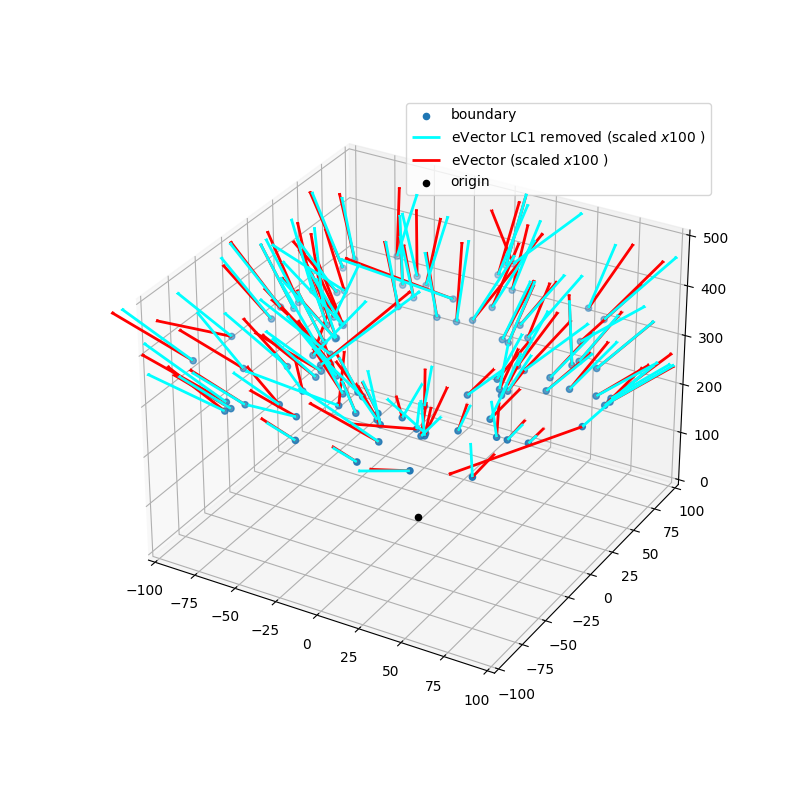

In [58]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')
N = 100 #int(Evts)
# ax.scatter3D(evector_x_SC_ON, evector_y_SC_ON, evector_z_SC_ON)
# ax.scatter3D(bary_x_SC_ON_LC1rm[:N], bary_y_SC_ON_LC1rm[:N], bary_z_SC_ON_LC1rm[:N], label = 'barycenter')
ax.scatter3D(boundary[:N, 0], boundary[:N, 1], boundary[:N, 2], label = 'boundary')


origins = np.zeros((N, 3)) #   boundary # 

ax.quiver(                                        # eVector
    boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
    u_new[:N, 0], u_new[:N, 1], u_new[:N, 2],
    arrow_length_ratio=0.02, color = 'cyan' , linewidth = 2 ,  length=100 , label = r'eVector LC1 removed (scaled $x100$ )'
)

ax.quiver(                                        # eVector
    boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
    u[:N, 0], u[:N, 1], u[:N, 2],
    arrow_length_ratio=0.02, color = 'red' , linewidth = 2 ,  length=100 , label = r'eVector (scaled $x100$ )'
)

# ax.quiver(                                        # barycenter - boundary
#     boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
#     # v_new[:N, 0] - boundary[:N, 0], v_new[:N, 1] - boundary[:N, 1], v_new[:N, 2] - boundary[:N, 2],
#     v_new[:N, 0] , v_new[:N, 1], v_new[:N, 2] ,
#     normalize=False, arrow_length_ratio=0.05, color= 'blue' , linewidth = 0.5 , label = r'$ \vec{V}_{bary}-\vec{V}_{bound} $' # , length=0.1 
# )

ax.scatter3D(0, 0, 0, color = 'black', label= 'origin')

ax.set_xlim([-100, 100])
ax.set_ylim([-100, 100])
ax.set_zlim([0, 500])
plt.legend()
plt.show()

In [32]:
plt.close()

## Plotting

### angle bw EVector and BoundaryP

In [142]:
cos_theta = np.sum(w_norm[:Evts, :]*u[:Evts, :], axis = 1)
theta = np.arccos(cos_theta)*180/np.pi

cos_theta_new = np.sum(w_norm[:Evts, :]*u_new, axis = 1)
theta_new = np.arccos(cos_theta_new)*180/np.pi

mask = ~np.isnan(theta)

index = ak.argsort(theta, ascending = True)



#### Angle Values

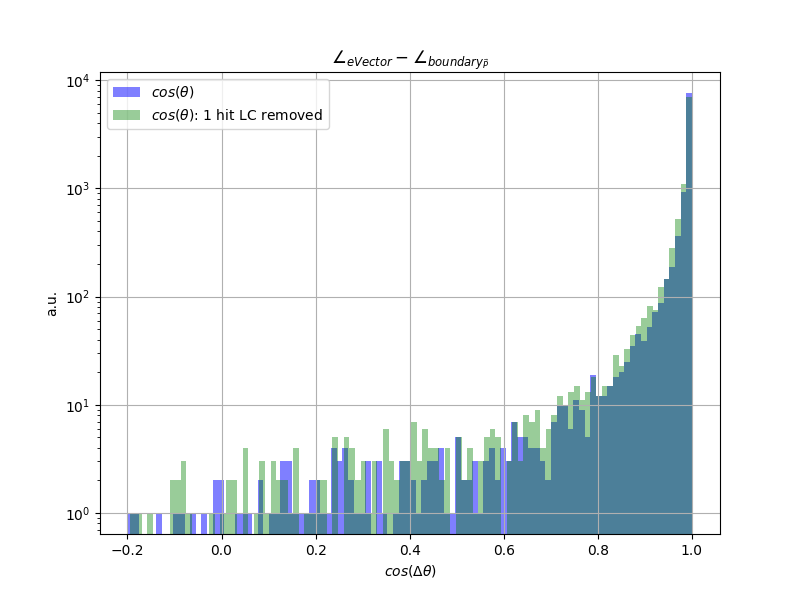

In [83]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(cos_theta, bins=100, color= 'blue', alpha = 0.5, label = r'$cos(\theta)$')#, range = (-0.2, 0.2) )
n_new, bins_new, __new = plt.hist(cos_theta_new, bins=100, color= 'green', alpha = 0.4, label = r'$cos(\theta)$: 1 hit LC removed')

plt.xlabel(r'$ cos(\Delta\theta)$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ \angle_{eVector} - \angle_{boundary_{\vec{P}}}$') #, x = 0.3, y = 0.92
plt.legend()
plt.grid()
plt.show()

In [84]:
plt.close()

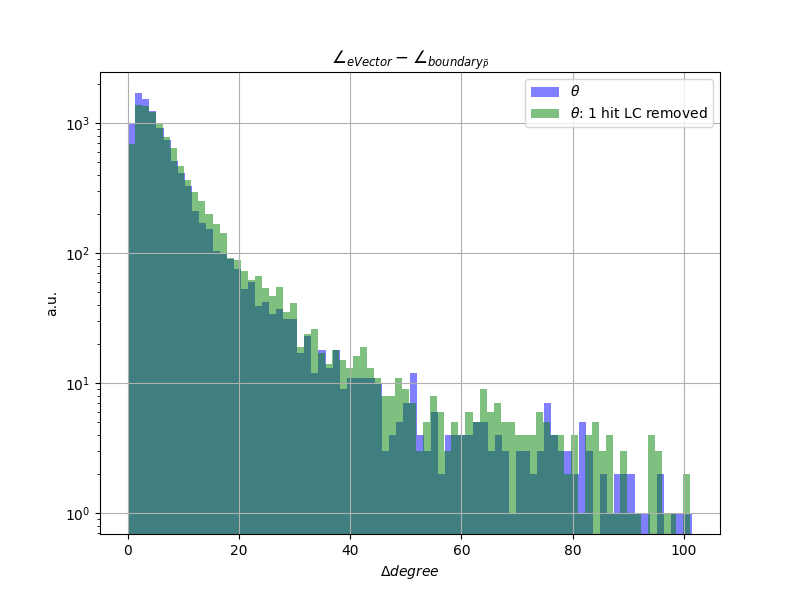

In [82]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(theta, bins=80, color= 'blue', alpha = 0.5, label = r'$\theta$')#, range = (-0.2, 0.2) )
n_new, bins_new, __new = plt.hist(theta_new, bins=80, color= 'green', alpha = 0.5, label = r'$\theta$: 1 hit LC removed')

plt.xlabel(r'$\Delta degree$') 
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ \angle_{eVector} - \angle_{boundary_{\vec{P}}}$') #, x = 0.3, y = 0.92
plt.legend()
plt.grid()
plt.show()

#### Theta vs Energy

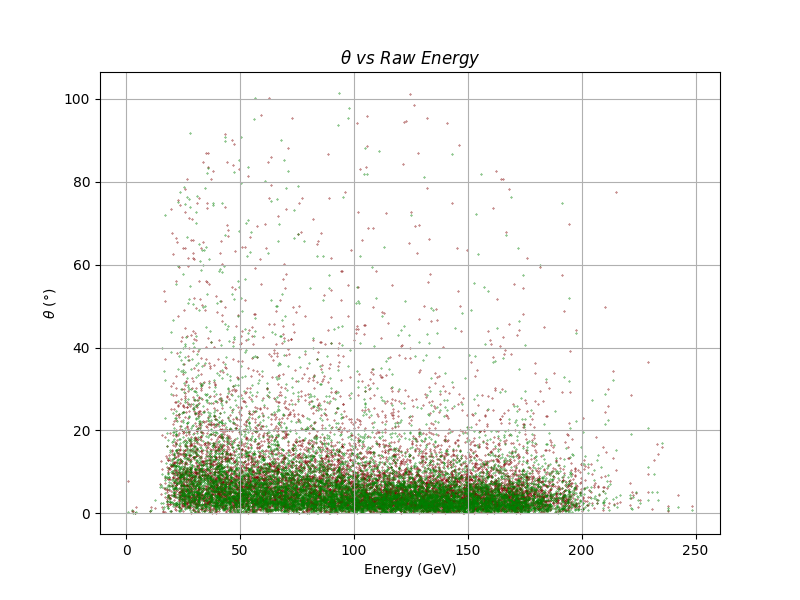

In [99]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_LC1rm, theta_new , s = 0.1 , color = 'maroon')
plt.scatter(baryenergy_raw_LC1rm, theta , s = 0.1 , color = 'green')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Raw\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

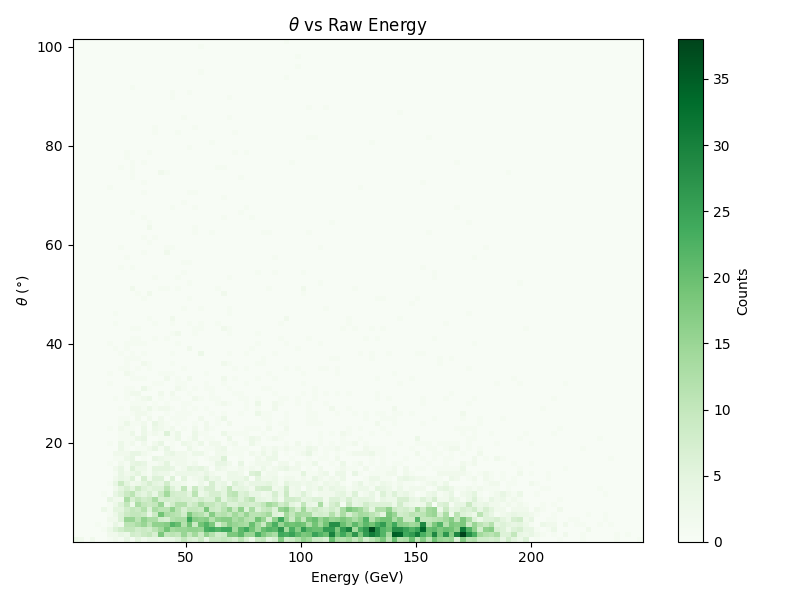

In [95]:
plt.figure(figsize=(8, 6))

plt.hist2d(baryenergy_raw_LC1rm, theta_new, bins=100, cmap='Reds')  #'inferno'
# plt.hist2d(baryenergy_raw_LC1rm, theta, bins=100, cmap='Greens')  #'inferno'

plt.colorbar(label='Counts')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
plt.title(r'$\theta$ (1 rec hit LC removed) vs Raw Energy')  #label = r'$\theta: 1 rec hit LC removed$'

# plt.legend()
plt.tight_layout()
plt.show()

#### Theta vs Eta

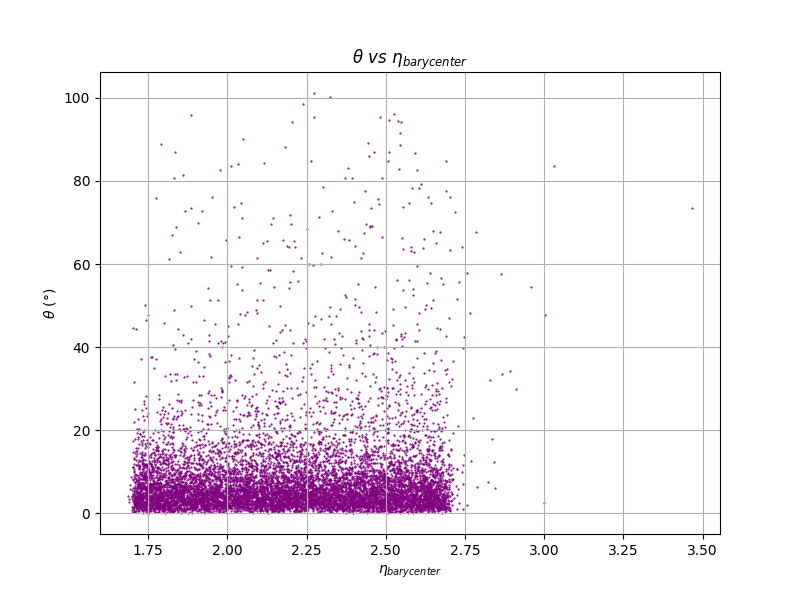

In [46]:
plt.figure(figsize=(8, 6))

plt.scatter(barycenters_eta_sim_ON[:Evts,0], theta , s = 0.3 , color = 'purple')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [101]:
plt.close()

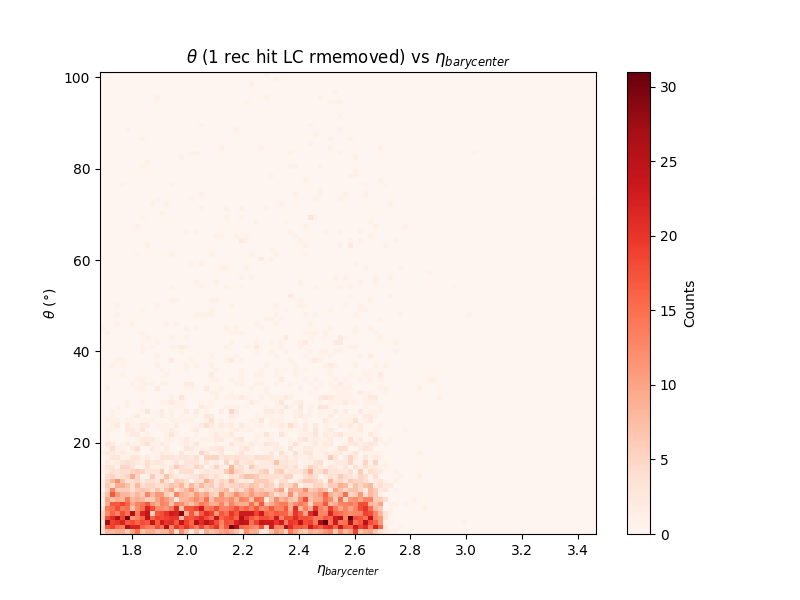

In [107]:
plt.figure(figsize=(8, 6))

# plt.hist2d(ak.to_numpy(barycenters_eta_sim_ON[:Evts, 0]), theta, bins=100, cmap='Greens')  
plt.hist2d(ak.to_numpy(barycenters_eta_sim_ON[:Evts, 0]), theta_new, bins=100, cmap='Reds')  
plt.colorbar(label='Counts')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta$ (1 rec hit LC rmemoved) vs $\eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.show()

#### Theta vs NCluster

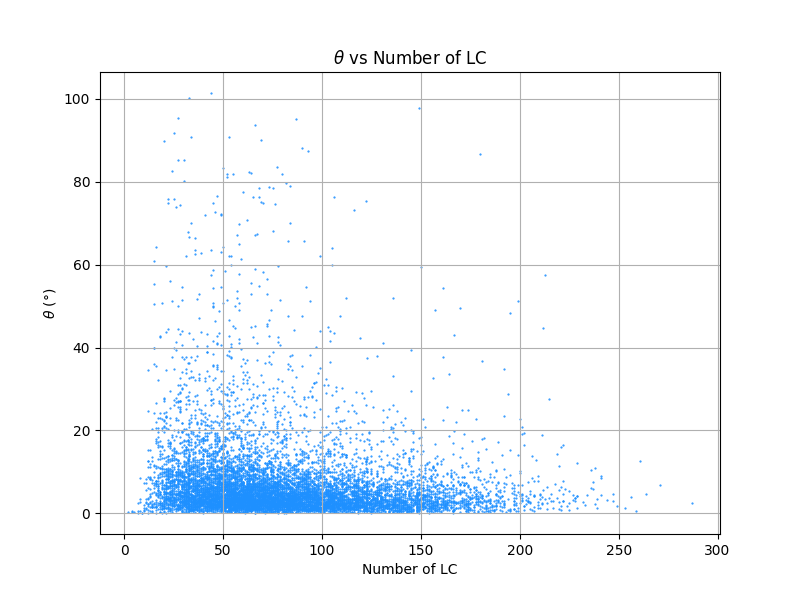

In [147]:
plt.figure(figsize=(8, 6))

plt.scatter(NClusters_for_PCA_LC1rm, theta , s = 0.3 , color = 'dodgerblue')  #NClusters_sim_ON[:Evts]

# plt.xlim(2.4, 2.525)
plt.xlabel(r'Number of LC')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta$ vs Number of LC') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [182]:
# NClusters_for_PCA_LC1rm
# ak.to_numpy(NClusters_sim_ON[:Evts])
len(theta)

10000

In [177]:
plt.close()

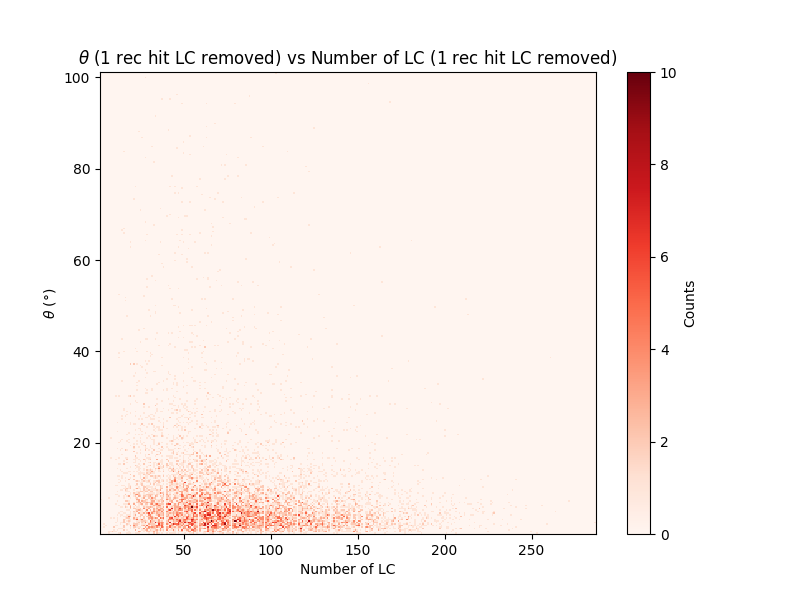

In [185]:
plt.figure(figsize=(8, 6))

# plt.hist2d(ak.to_numpy(NClusters_sim_ON[:Evts]), theta, bins=300, cmap='Greens')   
# plt.hist2d(ak.to_numpy(NClusters_sim_ON[:Evts]), theta, bins=300, cmap='Blues')   
# plt.hist2d(NClusters_for_PCA_LC1rm, theta, bins=300, cmap='Greens')  
plt.hist2d(NClusters_for_PCA_LC1rm, theta_new, bins=300, cmap='Reds')    
plt.colorbar(label='Counts')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'Number of LC')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta$ (1 rec hit LC removed) vs Number of LC (1 rec hit LC removed)') #, x = 0.3, y = 0.92 (1 rec hit LC removed)
# # plt.legend()
plt.show()

#### Binned Angles

In [188]:
bin_edges_new = np.linspace(theta_new[mask].min(), theta_new[mask].max(), num=30)
bin_centers_new = 0.5*(bin_edges_new[1:]+bin_edges_new[:-1])
bin_indices_new = np.digitize(theta_new, bin_edges_new)
avgNCluster_new = []
avgEnergy_LC_new = []
n_datapts_new = []
for i in range(1, len(bin_edges_new)):
    in_bin_new = (bin_indices_new == i)
    if np.any(in_bin_new):
        avg1_new = np.mean(NClusters_sim_ON[in_bin_new])
        avg2_new = np.mean(baryenergy_raw_SC_ON[in_bin_new]/NClusters_sim_ON[in_bin_new])
    else:
        avg1_new = np.nan  
        avg2_new = np.nan
    avgNCluster_new.append(avg1_new)
    avgEnergy_LC_new.append(avg2_new)
    n_datapts_new.append(np.sum(in_bin_new))

bin_edges = np.linspace(theta[mask].min(), theta[mask].max(), num=30)
bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
bin_indices = np.digitize(theta, bin_edges)
avgNCluster = []
avgEnergy_LC = []
n_datapts = []
for i in range(1, len(bin_edges)):
    in_bin = (bin_indices == i)
    if np.any(in_bin):
        avg1 = np.mean(NClusters_sim_ON[in_bin])
        avg2 = np.mean(baryenergy_raw_SC_ON[in_bin]/NClusters_sim_ON[in_bin])
    else:
        avg1 = np.nan  
        avg2 = np.nan
    avgNCluster.append(avg1)
    avgEnergy_LC.append(avg2)
    n_datapts.append(np.sum(in_bin))

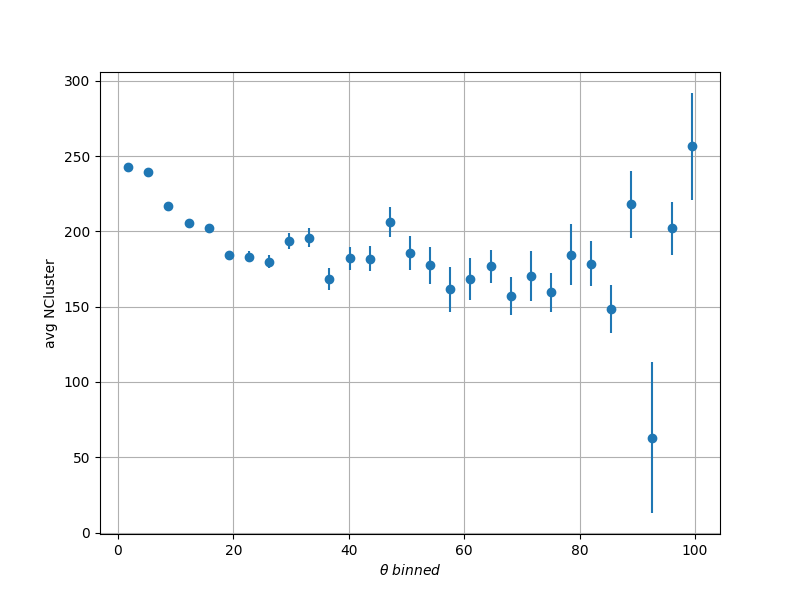

In [189]:
# plt.close()
# bin_edges
# bin_indices
# avgEnergy_LC
plt.figure(figsize=(8, 6))
# plt.scatter(bin_centers , avgEnergy_LC)
plt.errorbar(bin_centers_new , avgNCluster_new, yerr=50/(np.sqrt(n_datapts_new)), fmt="o")
# plt.errorbar(bin_centers , avgNCluster, yerr=50/(np.sqrt(n_datapts)), fmt="o")

plt.xlabel(r"$\theta \ binned$")
plt.ylabel("avg NCluster")
plt.grid()
plt.show()

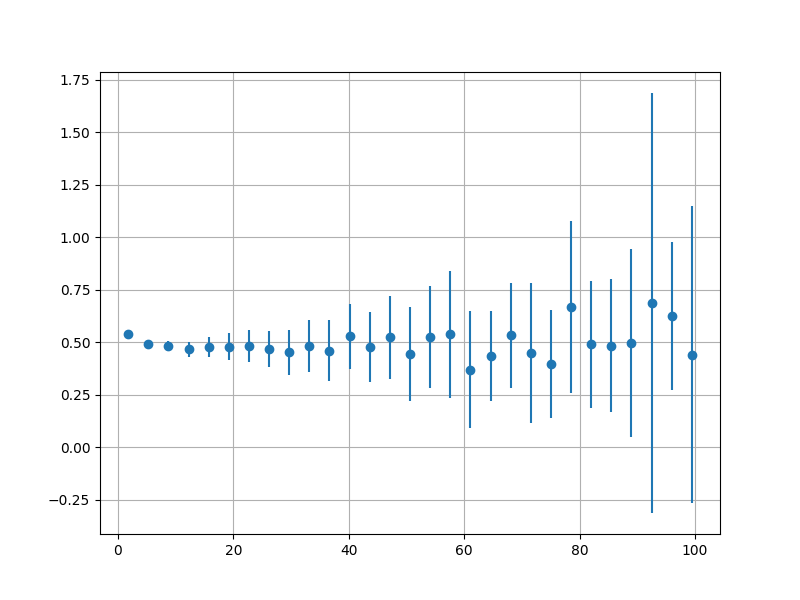

In [190]:
# plt.close()
# bin_edges
# bin_indices
# avgEnergy_LC
plt.figure(figsize=(8, 6))
# plt.scatter(bin_centers , avgEnergy_LC)
plt.errorbar(bin_centers_new , avgEnergy_LC_new, yerr=1/(np.sqrt(n_datapts_new)), fmt="o")
plt.grid()
plt.show()

#### Theta vs EV

C:\Users\chand\AppData\Local\Temp\ipykernel_27116\182022812.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


ValueError: x and y must be the same size

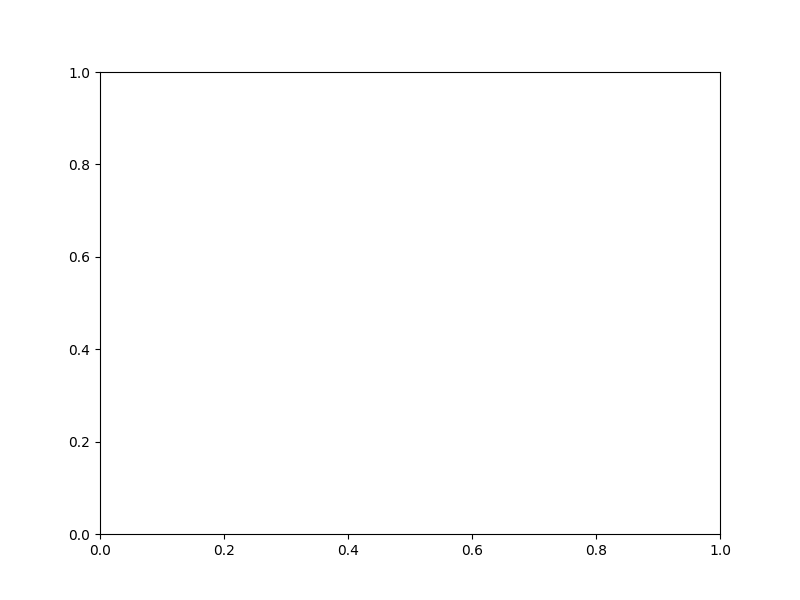

In [54]:
plt.figure(figsize=(8, 6))
EV_sum = (EV_sim_ON["EV1"]+EV_sim_ON["EV2"]+EV_sim_ON["EV3"])
plt.scatter(theta, EV_sim_ON["EV1"]/EV_sum , s = 1 , color = 'crimson', label = 'EV1 ratio')
plt.scatter(theta, EV_sim_ON["EV3"]/EV_sum , s = 1 , color = 'gold', label = 'EV3 ratio')
plt.scatter(theta, EV_sim_ON["EV2"]/EV_sum , s = 1, color = 'blue', label = 'EV2 ratio')

# plt.xlim(2.4, 2.525)
plt.ylabel(r'Explained Variance')
plt.xlabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'EV vs $ \theta$') #, x = 0.3, y = 0.92
plt.legend()
plt.grid()
plt.show()

# eVector 

## Initialise

In [3]:
# 
cluster_n_hits= file_c3d_ON["ticlDumper/clusters"].arrays(["cluster_number_of_hits" ], library= "ak")['cluster_number_of_hits']
cluster_type = file_c3d_ON["ticlDumper/clusters"].arrays(["cluster_type" ], library= "ak")['cluster_type']

In [4]:
#SimTracksterSC

vertices_indexes_simSC_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["vertices_indexes" ], library= "ak")["vertices_indexes"]

coord_arr_simSC_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_simSC_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["vertices_energy" ], library= "ak")
barycenters_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")
eVector0_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["eVector0_x", "eVector0_y" , "eVector0_z", "sigmaPCA1", "sigmaPCA2", "sigmaPCA3"], library= "ak")
boundary_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["boundaryX", "boundaryY" , "boundaryZ", "boundaryEta", "boundaryPhi"], library= "ak")
boundaryP_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["boundaryPx", "boundaryPy" , "boundaryPz"], library= "ak")

barycenters_eta_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["barycenter_eta"], library= "ak")["barycenter_eta"]
barycenters_phi_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["barycenter_phi"], library= "ak")["barycenter_phi"]

NClusters_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["NClusters"], library= "ak")["NClusters"]
EV_sim_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["EV1", "EV2", "EV3"], library= "ak")

# Hits
x_simSC_ON = coord_arr_simSC_ON["vertices_x"][:] 
y_simSC_ON = coord_arr_simSC_ON["vertices_y"][:] 
z_simSC_ON = coord_arr_simSC_ON["vertices_z"][:] 

# Energy
energy_simSC_ON = energy_arr_simSC_ON["vertices_energy"][:]
baryenergy_SC_ON = file_c3d_ON["ticlDumper/simtrackstersSC"].arrays(["raw_energy", "regressed_energy"],library = "ak")
baryenergy_raw_SC_ON = baryenergy_SC_ON["raw_energy"]
baryenergy_reg_SC_ON = baryenergy_SC_ON["regressed_energy"]

# Barycenter
bary_z_SC_ON = barycenters_sim_ON["barycenter_z"]
bary_x_SC_ON = barycenters_sim_ON["barycenter_x"]
bary_y_SC_ON = barycenters_sim_ON["barycenter_y"]

# eVector
evector_x_SC_ON = eVector0_sim_ON["eVector0_x"]
evector_y_SC_ON = eVector0_sim_ON["eVector0_y"]
evector_z_SC_ON = eVector0_sim_ON["eVector0_z"]
evector_PCA1_SC_ON = eVector0_sim_ON["sigmaPCA1"]
evector_PCA3_SC_ON = eVector0_sim_ON["sigmaPCA3"]
evector_PCA2_SC_ON = eVector0_sim_ON["sigmaPCA2"]

# First Hit
boundaryX_SC_ON = boundary_sim_ON["boundaryX"]
boundaryY_SC_ON = boundary_sim_ON["boundaryY"]
boundaryZ_SC_ON = boundary_sim_ON["boundaryZ"]
boundaryEta_SC_ON = boundary_sim_ON["boundaryEta"]
boundaryPhi_SC_ON = boundary_sim_ON["boundaryPhi"]

boundaryPx_sim_ON , boundaryPy_sim_ON , boundaryPz_sim_ON = boundaryP_sim_ON["boundaryPx"] , boundaryP_sim_ON["boundaryPy"] , boundaryP_sim_ON["boundaryPz"]

In [25]:
# ticlTrackstersCLUE3DHigh               TiclCandidate Not yet (trackstersTiclCandidate)

NClusters_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["NClusters"], library= "ak")["NClusters"]
EV_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["EV1", "EV2", "EV3"], library= "ak")

# Hits
coord_arr_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
x_tc3d_ON = coord_arr_tc3d_ON["vertices_x"][:]
y_tc3d_ON = coord_arr_tc3d_ON["vertices_y"][:]
z_tc3d_ON = coord_arr_tc3d_ON["vertices_z"][:]

# Energy
energy_arr_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["vertices_energy" ], library= "ak")
energy_tc3d_ON = energy_arr_tc3d_ON["vertices_energy"][:] 
baryenergy_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["raw_energy", "regressed_energy"],library = "ak")
baryenergy_raw_tc3d_ON = baryenergy_tc3d_ON["raw_energy"]
baryenergy_reg_tc3d_ON = baryenergy_tc3d_ON["regressed_energy"]

# Barycenter
barycenters_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")
barycenters_eta_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["barycenter_eta"], library= "ak")["barycenter_eta"]
barycenters_phi_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["barycenter_phi"], library= "ak")["barycenter_phi"]
bary_z_tc3d_ON = barycenters_tc3d_ON["barycenter_z"]
bary_x_tc3d_ON = barycenters_tc3d_ON["barycenter_x"]
bary_y_tc3d_ON = barycenters_tc3d_ON["barycenter_y"]

# eVector
eVector0_tc3d_ON = file_c3d_ON["ticlDumper/ticlTrackstersCLUE3DHigh"].arrays(["eVector0_x", "eVector0_y" , "eVector0_z", "sigmaPCA1", "sigmaPCA2", "sigmaPCA3"], library= "ak")
evector_x_tc3d_ON = eVector0_tc3d_ON["eVector0_x"]
evector_y_tc3d_ON = eVector0_tc3d_ON["eVector0_y"]
evector_z_tc3d_ON = eVector0_tc3d_ON["eVector0_z"]
evector_PCA1_SC_ON = eVector0_tc3d_ON["sigmaPCA1"]
evector_PCA3_SC_ON = eVector0_tc3d_ON["sigmaPCA3"]
evector_PCA2_SC_ON = eVector0_tc3d_ON["sigmaPCA2"]


In [38]:
x_tc3d_ON[9]

<Array [[8.61, 10.3, 5.12, ..., 14.4, 11.1], ...] type='7 * var * float32'>

In [17]:
N= 10001 #(<100)
eta_SC_ON = []          ;    phi_SC_ON = []
# eta_tc_ON = []        ;    phi_tc_ON = []

eta_SC_ON = eta(bary_x_SC_ON[:N], bary_y_SC_ON[:N], bary_z_SC_ON[:N])
phi_SC_ON = phi(bary_x_SC_ON[:N], bary_y_SC_ON[:N])

# eta_tc_ON = eta(bary_x_tc_OFF[:N], bary_y_tc_OFF[:N], bary_z_tc_OFF[:N])
# phi_tc_ON = phi(bary_x_tc_OFF[:N], bary_y_tc_OFF[:N])


## Visualision

In [5]:
u = [evector_x_SC_ON , evector_y_SC_ON , evector_z_SC_ON]
u= np.transpose(np.reshape(u, (3, 10000)))

v = [bary_x_SC_ON , bary_y_SC_ON , bary_z_SC_ON]
v = np.transpose(np.reshape(v, (3, 10000)))
v_norm = v/np.linalg.norm(v, axis = 1, keepdims=True)

w = [boundaryPx_sim_ON, boundaryPy_sim_ON , boundaryPz_sim_ON]
w = np.transpose(np.reshape(w, (3, 10000)))
w_norm = w/np.linalg.norm(w, axis = 1, keepdims=True)

boundary = [boundaryX_SC_ON, boundaryY_SC_ON, boundaryZ_SC_ON]
boundary = np.transpose(np.reshape(boundary, (3, 10000)))
boundary_norm = boundary/np.linalg.norm(boundary, axis = 1, keepdims=True)

# boundary_to_bary = 

In [6]:
# w
np.where(np.linalg.norm(w, axis = 1, keepdims=True) < 10)

(array([], dtype=int64), array([], dtype=int64))

In [378]:
w_norm[3277]

array([nan, nan, nan], dtype=float32)

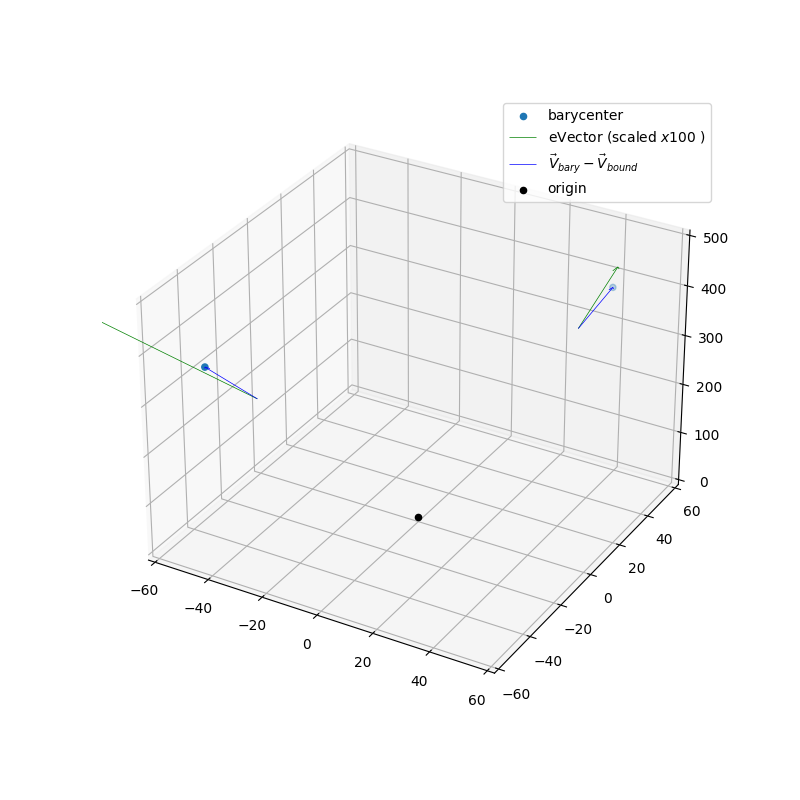

In [375]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')
N = 8414#3277
# ax.scatter3D(evector_x_SC_ON, evector_y_SC_ON, evector_z_SC_ON)
ax.scatter3D(bary_x_SC_ON[N-1:N+1], bary_y_SC_ON[N-1:N+1], bary_z_SC_ON[N-1:N+1], label = 'barycenter')

origins = np.zeros((N+1-(N-1), 3)) #   boundary # 

ax.quiver(                                        # eVector
    boundary[N-1:N+1, 0], boundary[N-1:N+1, 1], boundary[N-1:N+1, 2],
    u[N-1:N+1, 0], u[N-1:N+1, 1], u[N-1:N+1, 2],
    arrow_length_ratio=0.05, color = 'green' , linewidth = 0.5 ,  length=100 , label = r'eVector (scaled $x100$ )'
)

# ax.quiver(                                        # barycenter 
#     origins[:N, 0], origins[:N, 1], origins[:N, 2],
#     v[:N, 0] , v[:N, 1] , v[:N, 2] ,
#     normalize=False, arrow_length_ratio=0.02, color= 'red' , linewidth = 0.5 # , length=0.1 
# )

ax.quiver(                                        # barycenter - boundary
    boundary[N-1:N+1, 0], boundary[N-1:N+1, 1], boundary[N-1:N+1, 2],
    v[N-1:N+1, 0] - boundary[N-1:N+1, 0], v[N-1:N+1, 1] - boundary[N-1:N+1, 1], v[N-1:N+1, 2] - boundary[N-1:N+1, 2],
    normalize=False, arrow_length_ratio=0.05, color= 'blue' , linewidth = 0.5 , label = r'$ \vec{V}_{bary}-\vec{V}_{bound} $' # , length=0.1 
)

# ax.quiver(                                        # boundary
#     origins[:, 0], origins[:, 1], origins[:, 2],
#     boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
#     normalize=False, arrow_length_ratio=0.05, color= 'black' , linewidth = 0.3 # , length=0.1 
# )

ax.scatter3D(0, 0, 0, color = 'black', label= 'origin')

ax.set_xlim([-60, 60])
ax.set_ylim([-60, 60])
ax.set_zlim([0, 500])
plt.legend()
plt.show()

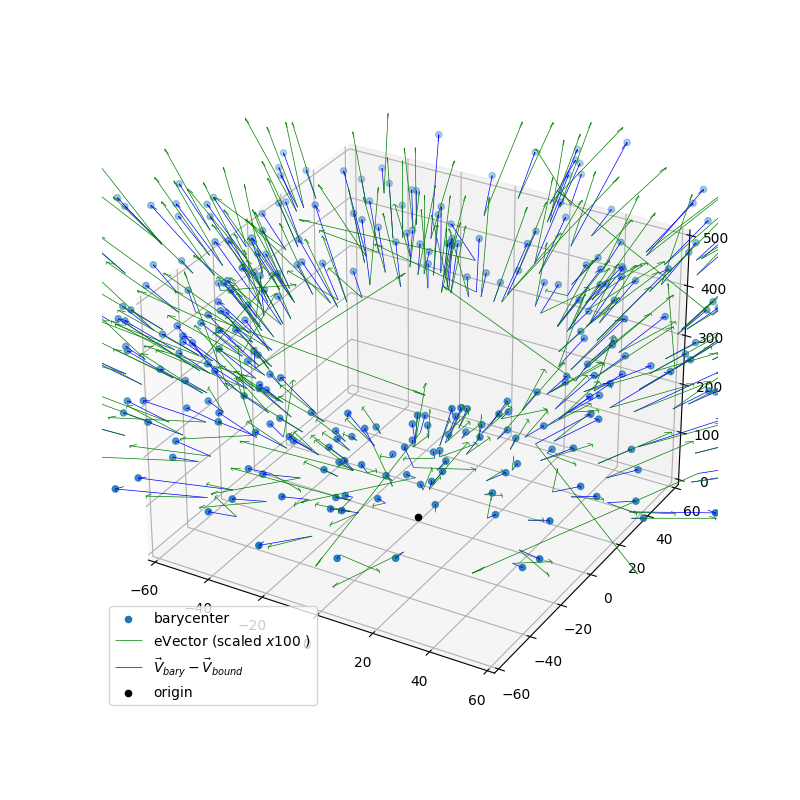

In [66]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')
N = 300
# ax.scatter3D(evector_x_SC_ON, evector_y_SC_ON, evector_z_SC_ON)
ax.scatter3D(bary_x_SC_ON[:N], bary_y_SC_ON[:N], bary_z_SC_ON[:N], label = 'barycenter')

origins = np.zeros((N, 3)) #   boundary # 

ax.quiver(                                        # eVector
    boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
    u[:N, 0], u[:N, 1], u[:N, 2],
    arrow_length_ratio=0.05, color = 'green' , linewidth = 0.5 ,  length=100 , label = r'eVector (scaled $x100$ )'
)

# ax.quiver(                                        # barycenter 
#     origins[:N, 0], origins[:N, 1], origins[:N, 2],
#     v[:N, 0] , v[:N, 1] , v[:N, 2] ,
#     normalize=False, arrow_length_ratio=0.02, color= 'red' , linewidth = 0.5 # , length=0.1 
# )

ax.quiver(                                        # barycenter - boundary
    boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
    v[:N, 0] - boundary[:N, 0], v[:N, 1] - boundary[:N, 1], v[:N, 2] - boundary[:N, 2],
    normalize=False, arrow_length_ratio=0.05, color= 'blue' , linewidth = 0.5 , label = r'$ \vec{V}_{bary}-\vec{V}_{bound} $' # , length=0.1 
)

# ax.quiver(                                        # boundary
#     origins[:, 0], origins[:, 1], origins[:, 2],
#     boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
#     normalize=False, arrow_length_ratio=0.05, color= 'black' , linewidth = 0.3 # , length=0.1 
# )

# ax.quiver(                                        # P boundary
#     boundary[:N, 0], boundary[:N, 1], boundary[:N, 2],
#     w[:N, 0], w[:N, 1], w[:N, 2],
#     normalize=False, arrow_length_ratio=0.05, color= 'red' , linewidth = 0.3 , label = r'$ P_{bound} $'  #  , length=0.1 
# )

ax.scatter3D(0, 0, 0, color = 'black', label= 'origin')

ax.set_xlim([-60, 60])
ax.set_ylim([-60, 60])
ax.set_zlim([0, 500])
plt.legend()
plt.show()

## Plots

### Angle bw Boundary & Barycenter

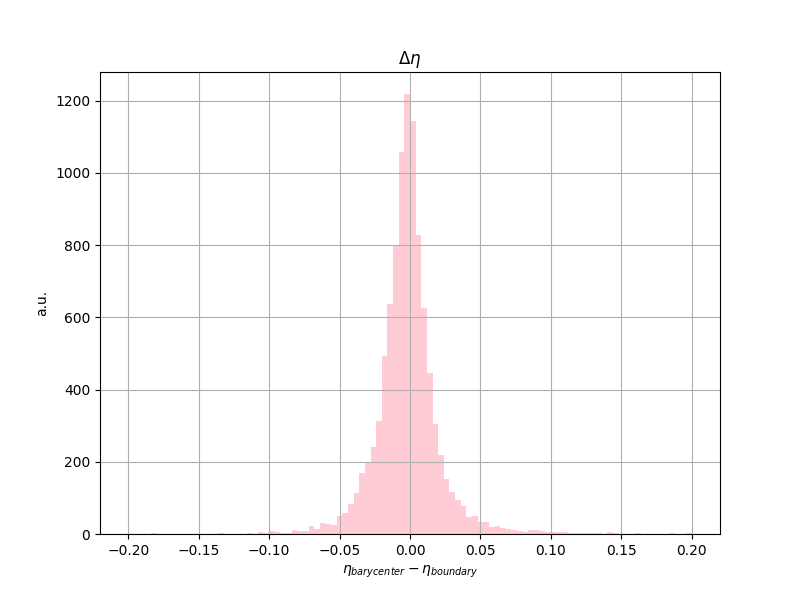

In [218]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(barycenters_eta_sim_ON - boundaryEta_SC_ON, bins=100, color= 'pink', alpha = 0.8, range = (-0.2, 0.2) )

# bin_centers = 0.5 * (bins[:-1] + bins[1:])
# plt.errorbar(bin_centers, n, yerr=np.sqrt(n), fmt='o', color='green', alpha=1, ms = 0.9)
# plt.xlim(0.95, 1.01)

plt.xlabel(r'$\eta_{barycenter} - \eta_{boundary}$')
plt.ylabel('a.u.')
# plt.yscale('log')
plt.title(r'$\Delta \eta$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

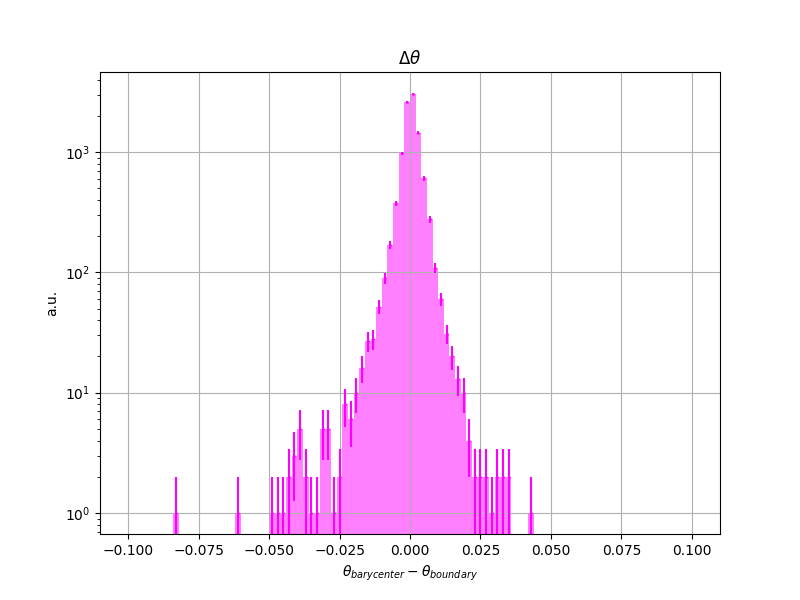

In [308]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(eta_to_theta(barycenters_eta_sim_ON, False) - eta_to_theta(boundaryEta_SC_ON, False), bins=100, color= 'magenta', alpha = 0.5, range = (-0.1, 0.1) )

bin_centers = 0.5 * (bins[:-1] + bins[1:])
plt.errorbar(bin_centers, n, yerr=np.sqrt(n), fmt='o', color='magenta', alpha=1, ms = 0.9)

plt.xlabel(r'$\theta_{barycenter} - \theta_{boundary}$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$\Delta \theta$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [310]:
0.4*180/np.pi

22.91831180523293

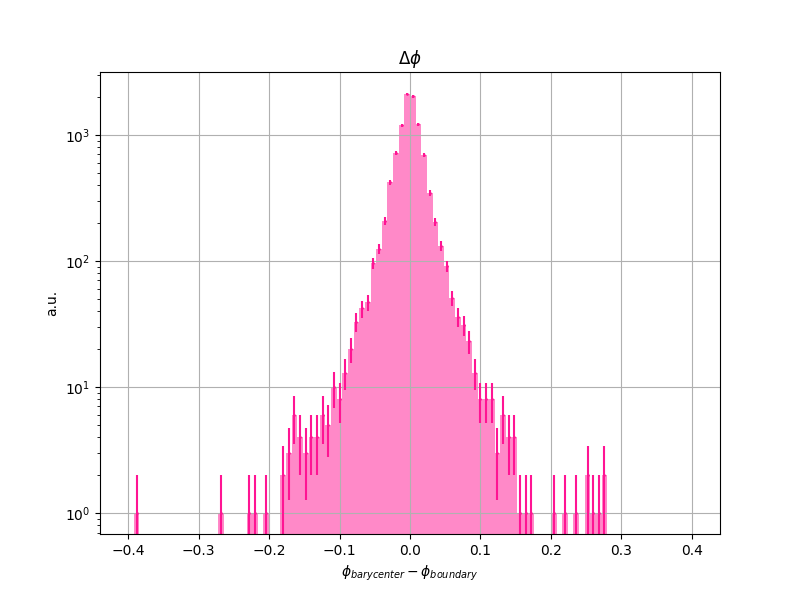

In [302]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(phi_diff(barycenters_phi_sim_ON , boundaryPhi_SC_ON), bins=100, color= 'deeppink', alpha = 0.5 , range = (-0.4, 0.4))

bin_centers = 0.5 * (bins[:-1] + bins[1:])
plt.errorbar(bin_centers, n, yerr=np.sqrt(n), fmt='o', color='deeppink', alpha=1, ms = 0.9)
# plt.xlim(0.95, 1.01)

plt.xlabel(r'$\phi_{barycenter} - \phi_{boundary}$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$\Delta \phi$') #, x = 0.3, y = 0.92
# plt.legend()
plt.grid()
plt.show()

### angle bw EVector and BoundaryP

In [15]:
cos_theta = np.sum(w_norm*u, axis = 1)
theta = np.arccos(cos_theta)*180/np.pi

mask = ~np.isnan(theta)

index = ak.argsort(theta, ascending = True)

#### Angle values

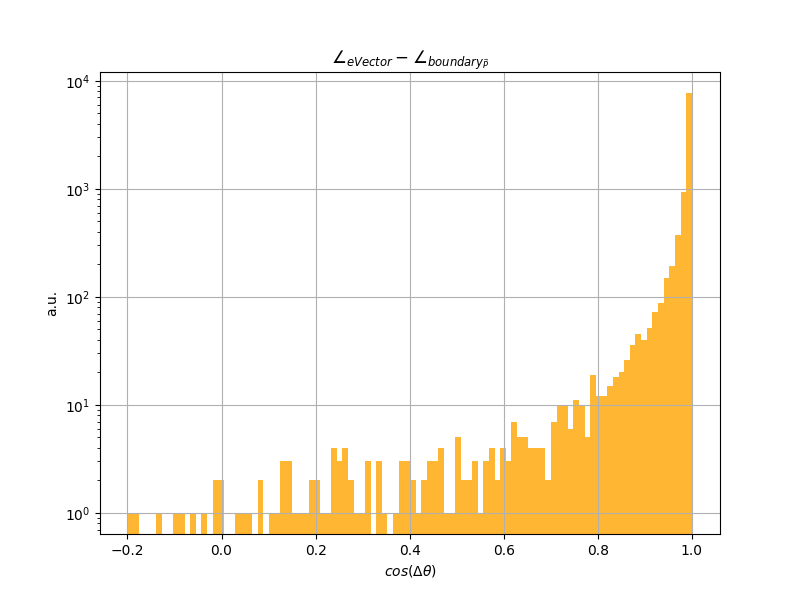

In [13]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(cos_theta, bins=100, color= 'orange', alpha = 0.8)#, range = (-0.2, 0.2) )

plt.xlabel(r'$ cos(\Delta\theta)$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ \angle_{eVector} - \angle_{boundary_{\vec{P}}}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

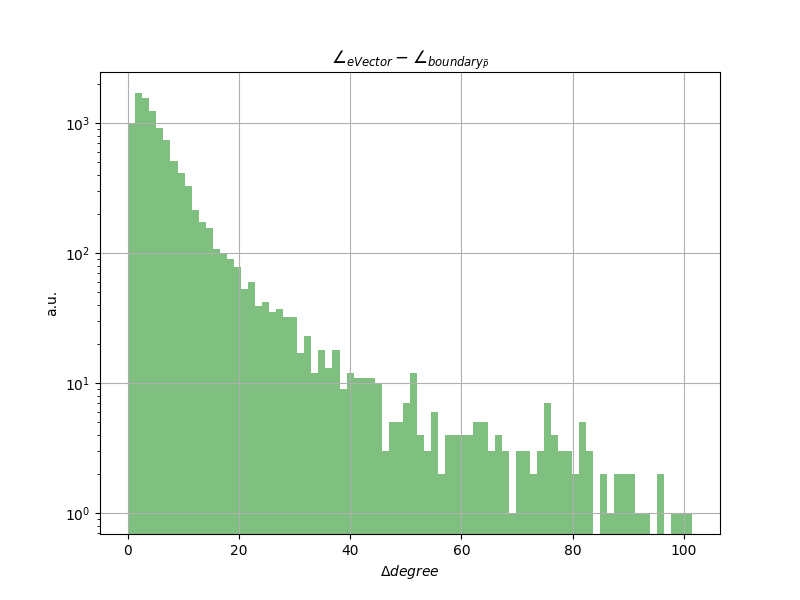

In [18]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(theta, bins=80, color= 'green', alpha = 0.5)#, range = (-0.2, 0.2) )

plt.xlabel(r'$\Delta degree$') 
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ \angle_{eVector} - \angle_{boundary_{\vec{P}}}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

#### theta vs Energy

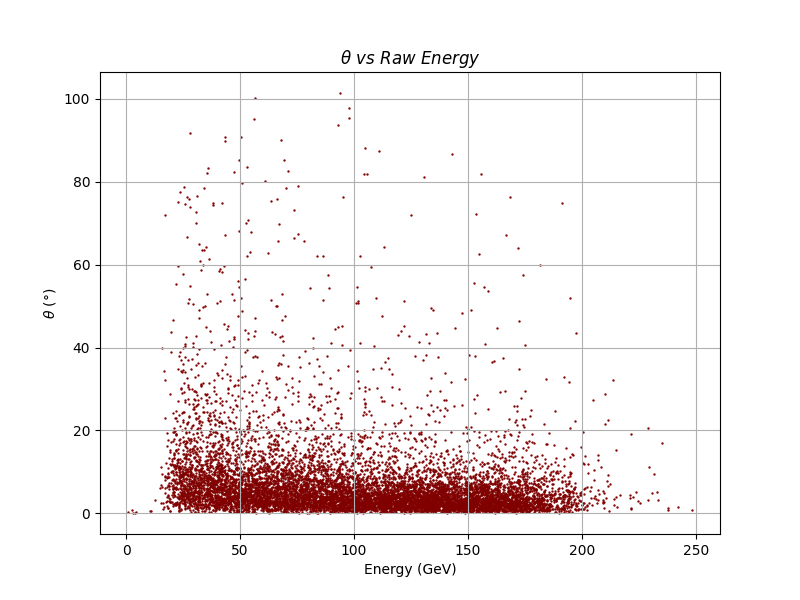

In [16]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_SC_ON, theta , s = 0.5 , color = 'maroon')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Raw\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

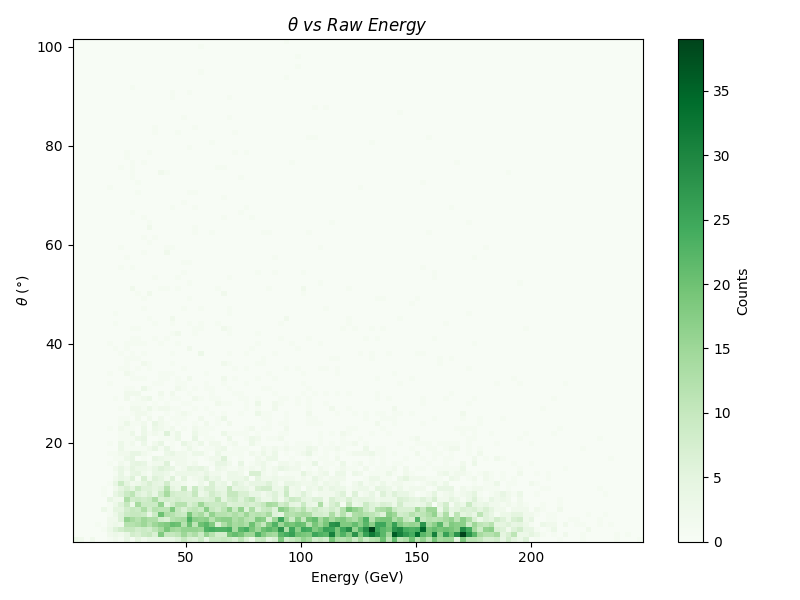

In [20]:
plt.figure(figsize=(8, 6))

plt.hist2d(ak.to_numpy(ak.flatten(baryenergy_raw_SC_ON)), theta, bins=100, cmap='Greens')  #'inferno'

plt.colorbar(label='Counts')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
plt.title(r'$\theta\ vs\ Raw\ Energy$')

plt.tight_layout()
plt.show()

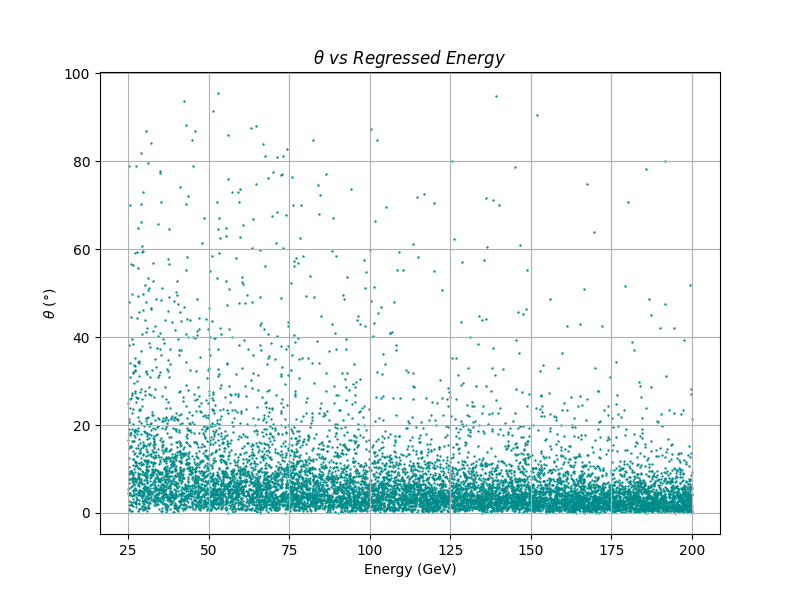

In [420]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_reg_SC_ON, theta , s = 0.5 , color = 'darkcyan')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Regressed\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

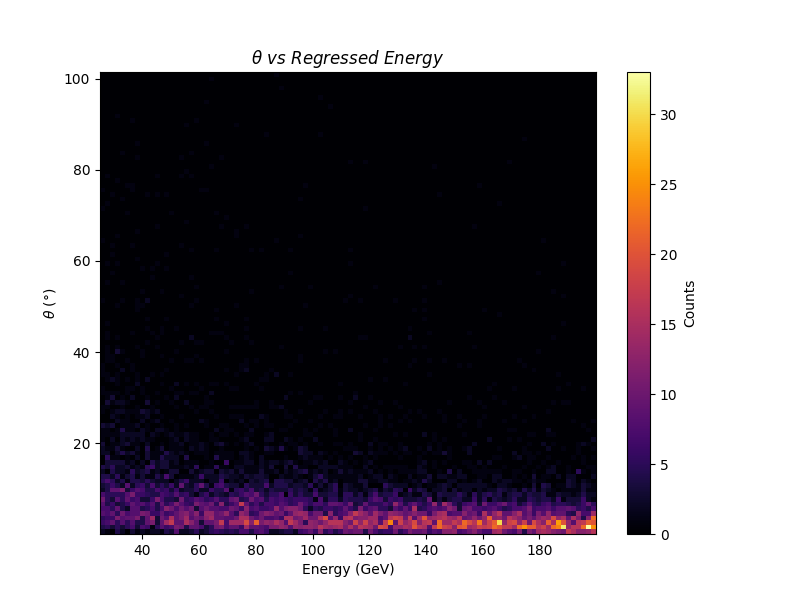

In [27]:
plt.figure(figsize=(8, 6))

plt.hist2d(ak.to_numpy(ak.flatten(baryenergy_reg_SC_ON)), theta, bins=100, cmap='inferno')  
plt.colorbar(label='Counts')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Regressed\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.show()

In [26]:
plt.close()

#### Theta vs Eta

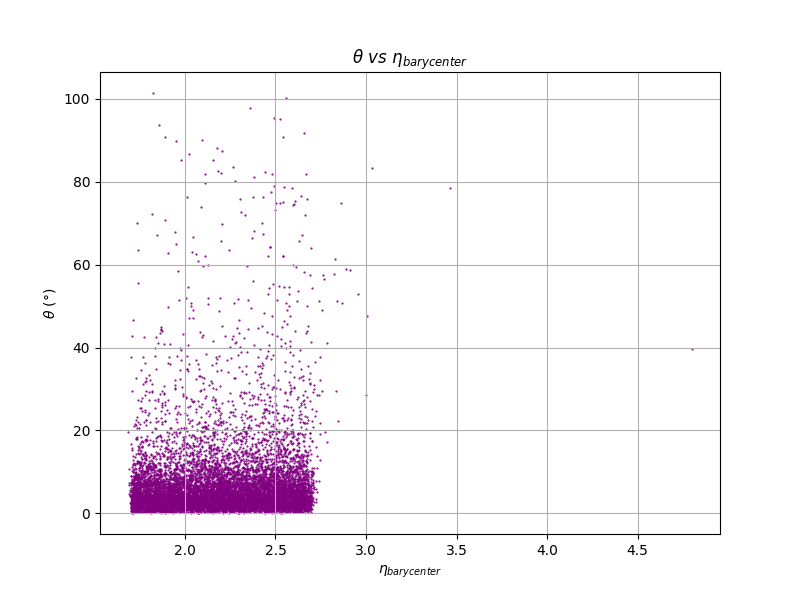

In [7]:
plt.figure(figsize=(8, 6))

plt.scatter(barycenters_eta_sim_ON, theta , s = 0.3 , color = 'purple')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

NameError: name 'theta' is not defined

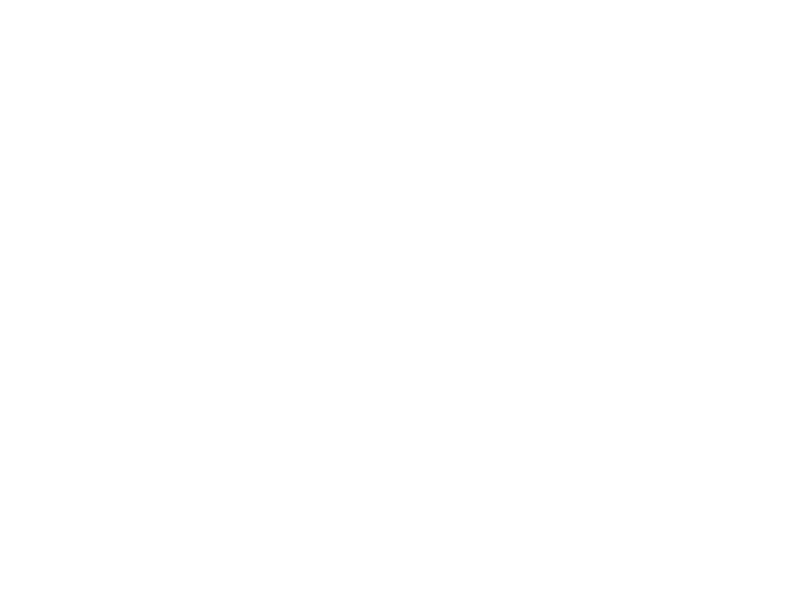

In [6]:
plt.figure(figsize=(8, 6))

plt.hist2d(ak.to_numpy(ak.flatten(barycenters_eta_sim_ON)), theta, bins=100, cmap='inferno')  
plt.colorbar(label='Counts')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.show()

#### theta vs NCluster

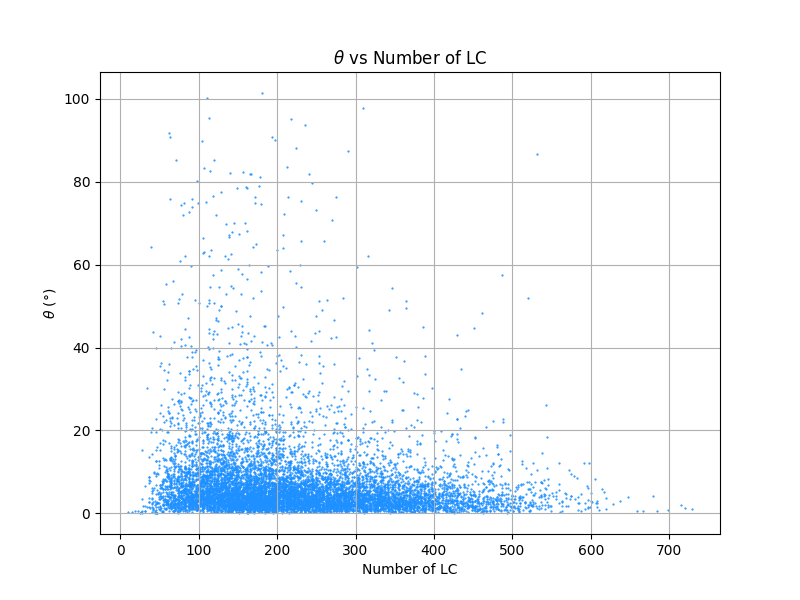

In [30]:
plt.figure(figsize=(8, 6))

plt.scatter(NClusters_sim_ON, theta , s = 0.3 , color = 'dodgerblue')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'Number of LC')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta$ vs Number of LC') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

#### Binned angles

In [31]:
bin_edges = np.linspace(theta[mask].min(), theta[mask].max(), num=30)
bin_centers = 0.5*(bin_edges[1:]+bin_edges[:-1])
bin_indices = np.digitize(theta, bin_edges)
avgNCluster = []
avgEnergy_LC = []
n_datapts = []
for i in range(1, len(bin_edges)):
    in_bin = (bin_indices == i)
    if np.any(in_bin):
        avg1 = np.mean(NClusters_sim_ON[in_bin])
        avg2 = np.mean(baryenergy_raw_SC_ON[in_bin]/NClusters_sim_ON[in_bin])
    else:
        avg1 = np.nan  
        avg2 = np.nan
    avgNCluster.append(avg1)
    avgEnergy_LC.append(avg2)
    n_datapts.append(np.sum(in_bin))

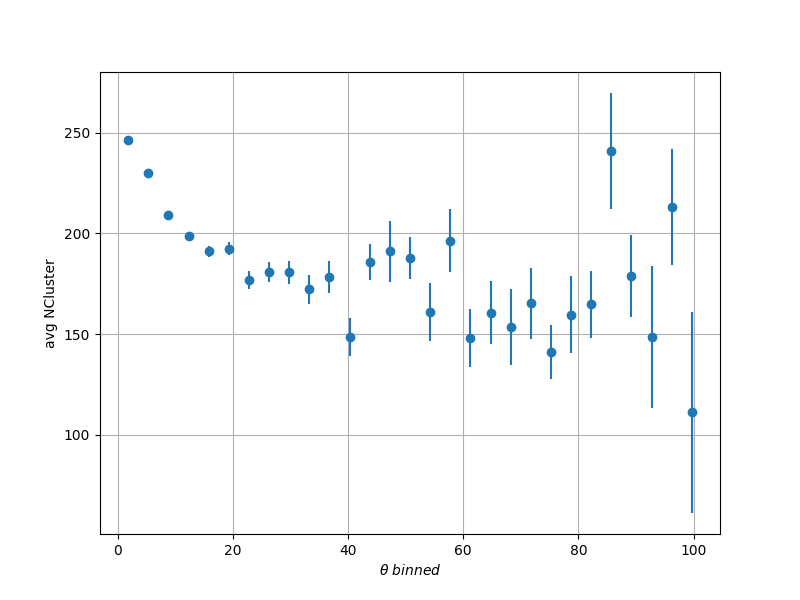

In [32]:
# plt.close()
# bin_edges
# bin_indices
# avgEnergy_LC
plt.figure(figsize=(8, 6))
# plt.scatter(bin_centers , avgEnergy_LC)
plt.errorbar(bin_centers , avgNCluster, yerr=50/(np.sqrt(n_datapts)), fmt="o")
plt.xlabel(r"$\theta \ binned$")
plt.ylabel("avg NCluster")
plt.grid()
plt.show()

C:\Users\chand\AppData\Local\Temp\ipykernel_53928\4122950959.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))


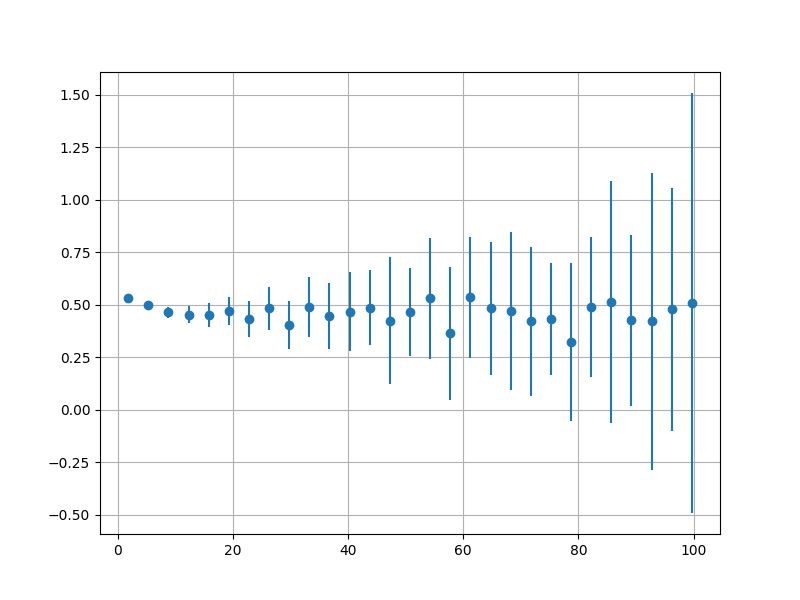

In [33]:
# plt.close()
# bin_edges
# bin_indices
# avgEnergy_LC
plt.figure(figsize=(8, 6))
# plt.scatter(bin_centers , avgEnergy_LC)
plt.errorbar(bin_centers , avgEnergy_LC, yerr=1/(np.sqrt(n_datapts)), fmt="o")
plt.grid()
plt.show()

#### theta vs Explained Variance

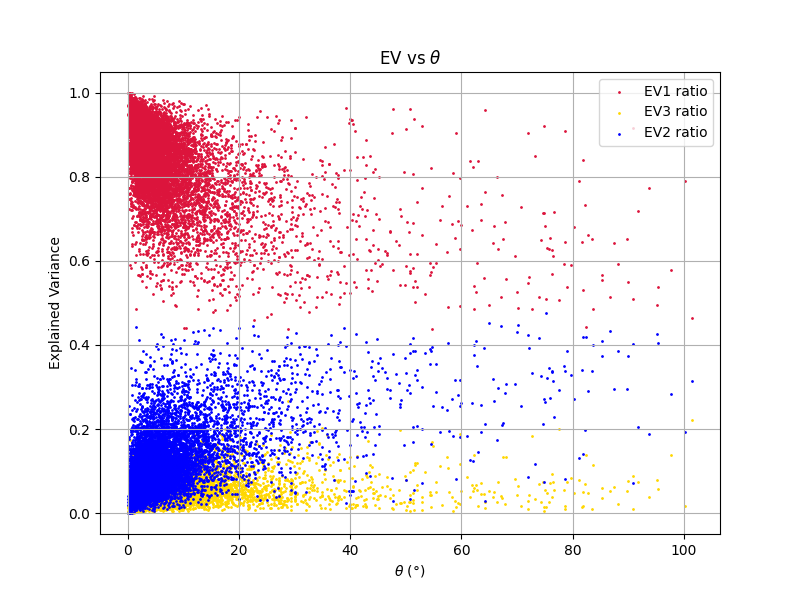

In [14]:
plt.figure(figsize=(8, 6))
EV_sum = (EV_sim_ON["EV1"]+EV_sim_ON["EV2"]+EV_sim_ON["EV3"])
plt.scatter(theta, EV_sim_ON["EV1"]/EV_sum , s = 1 , color = 'crimson', label = 'EV1 ratio')
plt.scatter(theta, EV_sim_ON["EV3"]/EV_sum , s = 1 , color = 'gold', label = 'EV3 ratio')
plt.scatter(theta, EV_sim_ON["EV2"]/EV_sum , s = 1, color = 'blue', label = 'EV2 ratio')

# plt.xlim(2.4, 2.525)
plt.ylabel(r'Explained Variance')
plt.xlabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'EV vs $ \theta$') #, x = 0.3, y = 0.92
plt.legend()
plt.grid()
plt.show()

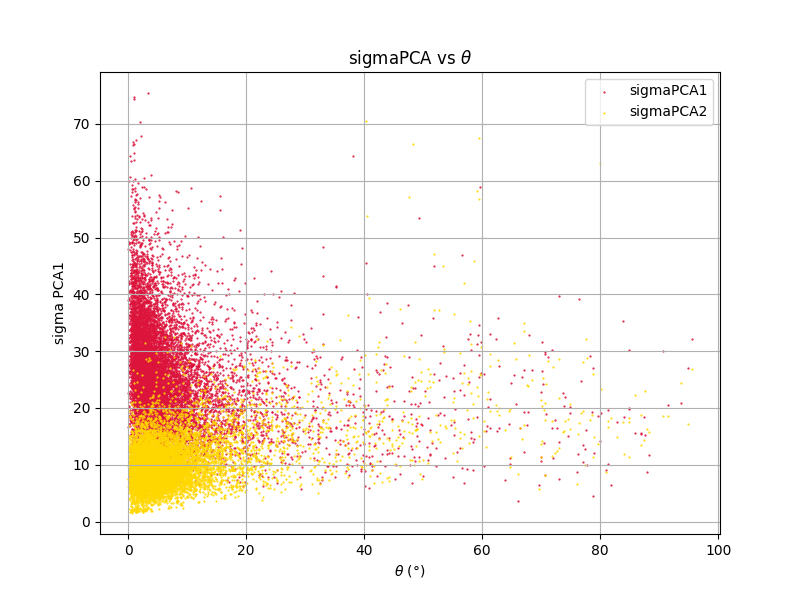

In [484]:
plt.figure(figsize=(8, 6))

plt.scatter(theta, evector_PCA1_SC_ON , s = 0.3 , color = 'crimson', label = 'sigmaPCA1')
plt.scatter(theta, evector_PCA2_SC_ON , s = 0.3 , color = 'gold', label = 'sigmaPCA2')
# plt.scatter(theta, evector_PCA3_SC_ON , s = 0.3 , color = 'khaki')

# plt.xlim(2.4, 2.525)
plt.ylabel(r'sigma PCA1')
plt.xlabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'sigmaPCA vs $ \theta$') #, x = 0.3, y = 0.92
plt.legend()
plt.grid()
plt.show()

In [41]:
plt.close()

### Angle bw Barycenter and Boundary P

In [436]:
cos_theta = np.sum(w_norm*v_norm, axis = 1)
theta = np.arccos(cos_theta)*180/np.pi

C:\Users\chand\AppData\Local\Temp\ipykernel_24636\4173346088.py:2: RuntimeWarning: invalid value encountered in arccos
  theta = np.arccos(cos_theta)*180/np.pi


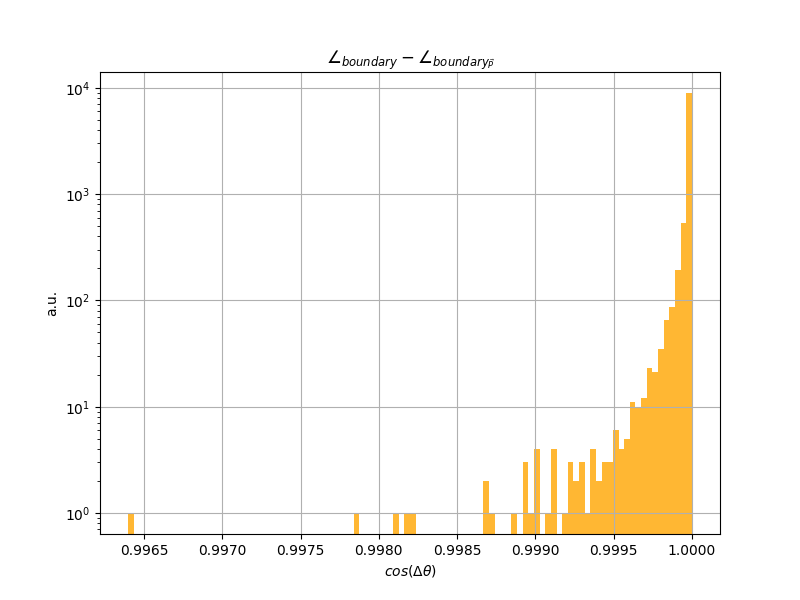

In [437]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(cos_theta, bins=100, color= 'orange', alpha = 0.8)#, range = (-0.2, 0.2) )

plt.xlabel(r'$ cos(\Delta\theta)$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ \angle_{boundary} - \angle_{boundary_{\vec{P}}}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

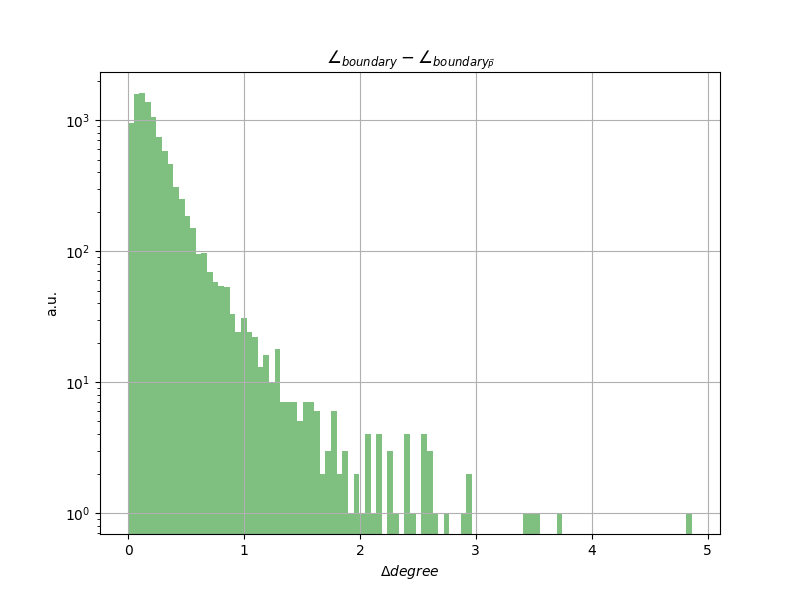

In [438]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(theta, bins=100, color= 'green', alpha = 0.5)#, range = (-0.2, 0.2) )

plt.xlabel(r'$\Delta degree$') 
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ \angle_{boundary} - \angle_{boundary_{\vec{P}}}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

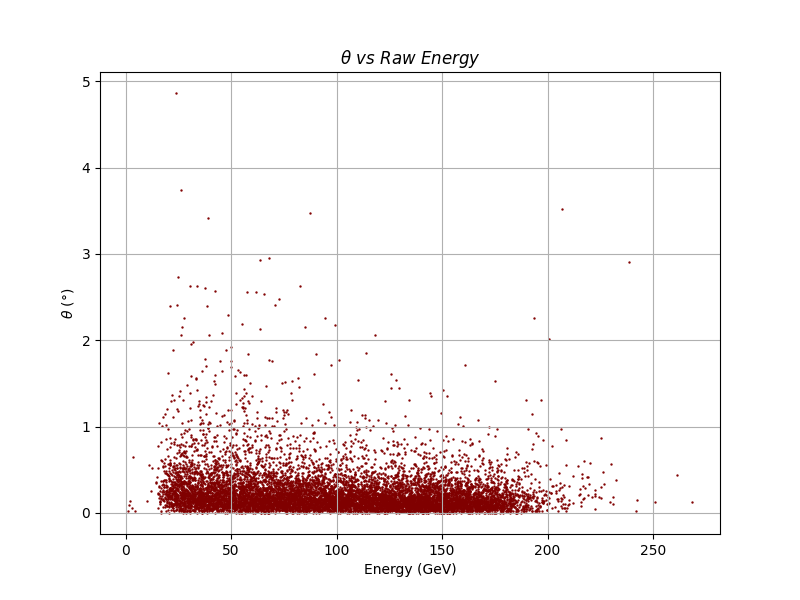

In [439]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_SC_ON, theta , s = 0.5 , color = 'maroon')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Raw\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

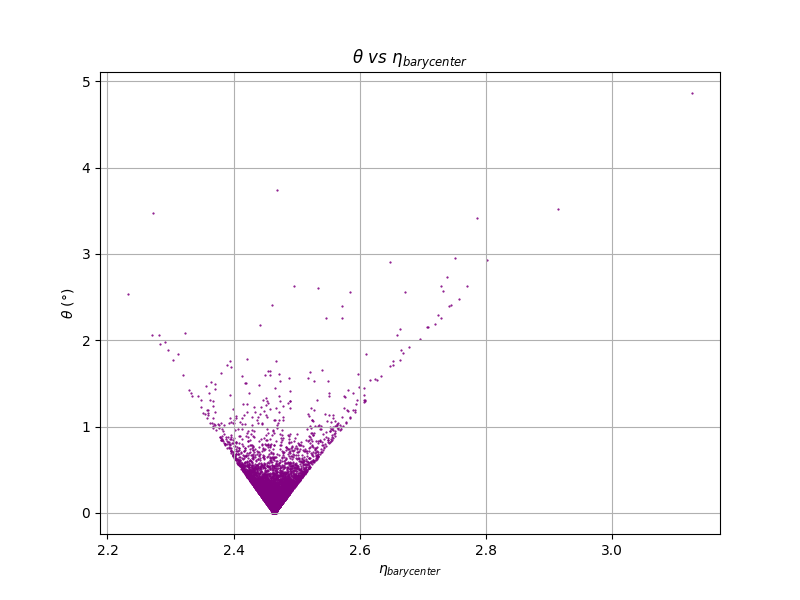

In [440]:
plt.figure(figsize=(8, 6))

plt.scatter(barycenters_eta_sim_ON, theta , s = 0.3 , color = 'purple')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

### angle bw EVector and barycenter

In [240]:
cos_theta = np.sum(u*v_norm, axis = 1)
theta = np.arccos(cos_theta)*180/np.pi

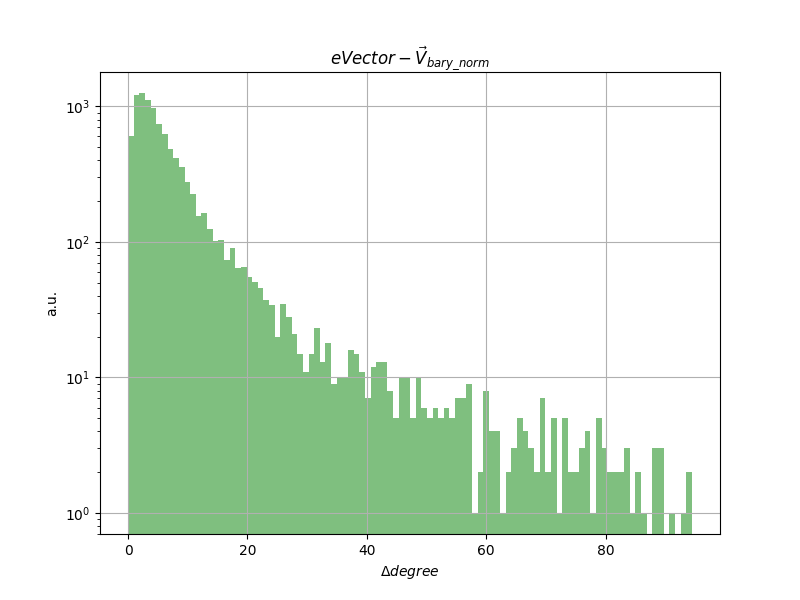

In [265]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(theta, bins=100, color= 'green', alpha = 0.5)#, range = (-0.2, 0.2) )

# bin_centers = 0.5 * (bins[:-1] + bins[1:])
# plt.errorbar(bin_centers, n, yerr=np.sqrt(n), fmt='o', color='green', alpha=1, ms = 0.9)
# plt.xlim(0.95, 1.01)

plt.xlabel(r'$\Delta degree$') 
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ eVector - \vec{V}_{{bary\_norm}} $') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

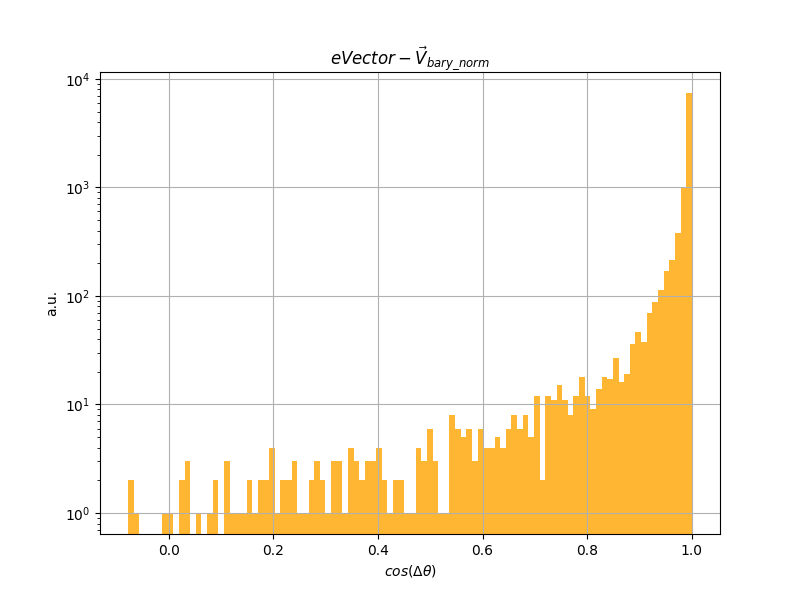

In [266]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(cos_theta, bins=100, color= 'orange', alpha = 0.8)#, range = (-0.2, 0.2) )

# bin_centers = 0.5 * (bins[:-1] + bins[1:])
# plt.errorbar(bin_centers, n, yerr=np.sqrt(n), fmt='o', color='green', alpha=1, ms = 0.9)
# plt.xlim(0.95, 1.01)

plt.xlabel(r'$ cos(\Delta\theta)$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$ eVector - \vec{V}_{{bary\_norm}} $') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

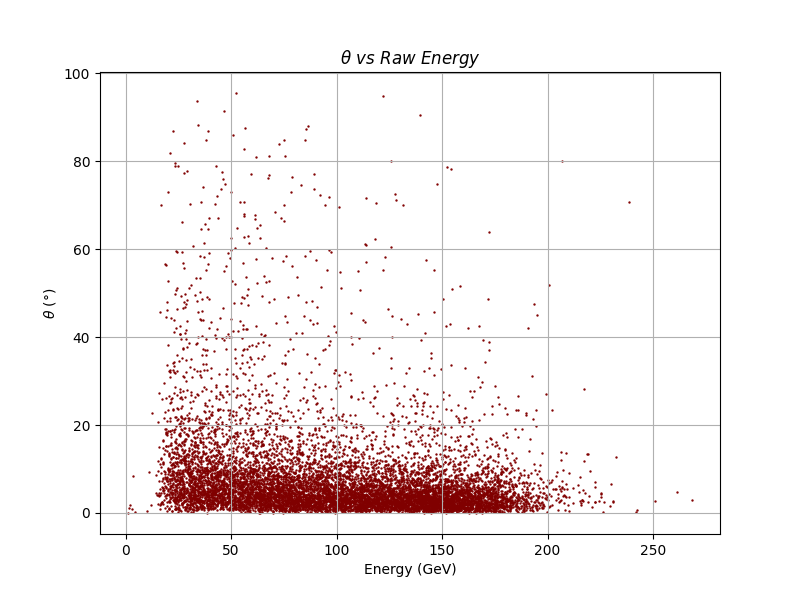

In [423]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_SC_ON, theta , s = 0.5 , color = 'maroon')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Raw\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

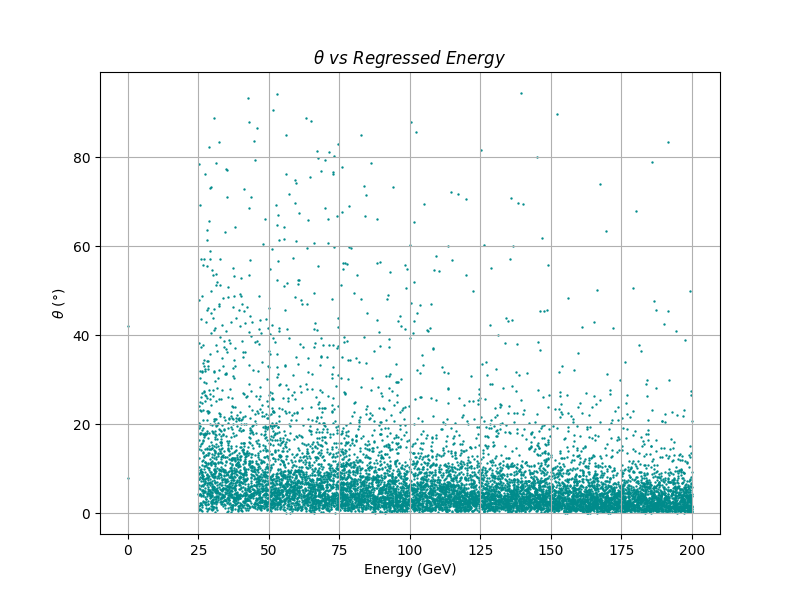

In [326]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_reg_SC_ON, theta , s = 0.5 , color = 'darkcyan')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Regressed\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

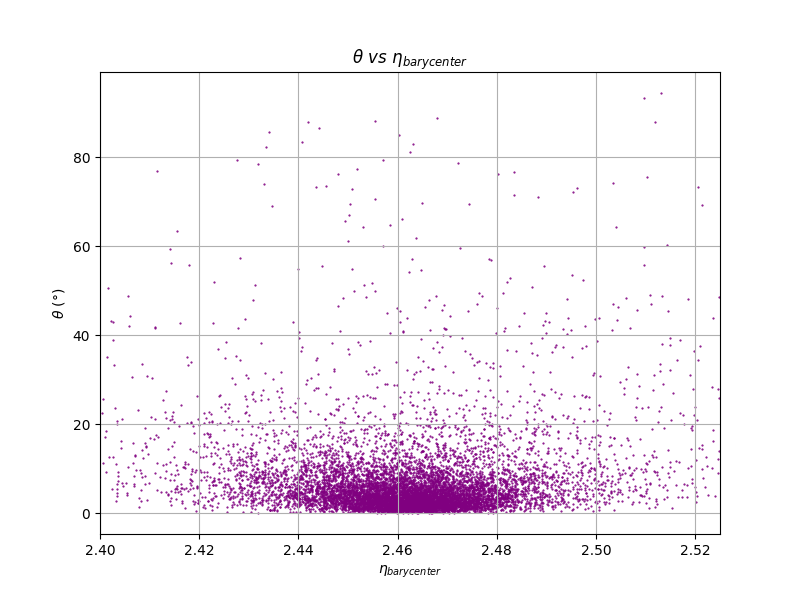

In [340]:
plt.figure(figsize=(8, 6))

plt.scatter(barycenters_eta_sim_ON, theta , s = 0.3 , color = 'purple')

plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [442]:
plt.close() 
# 

### Angle Bound-Bary and P Boundary

In [23]:
cos_theta = np.sum(((v-boundary)/np.linalg.norm(v-boundary))*w_norm, axis = 1)
theta = np.arccos(cos_theta)*180/np.pi

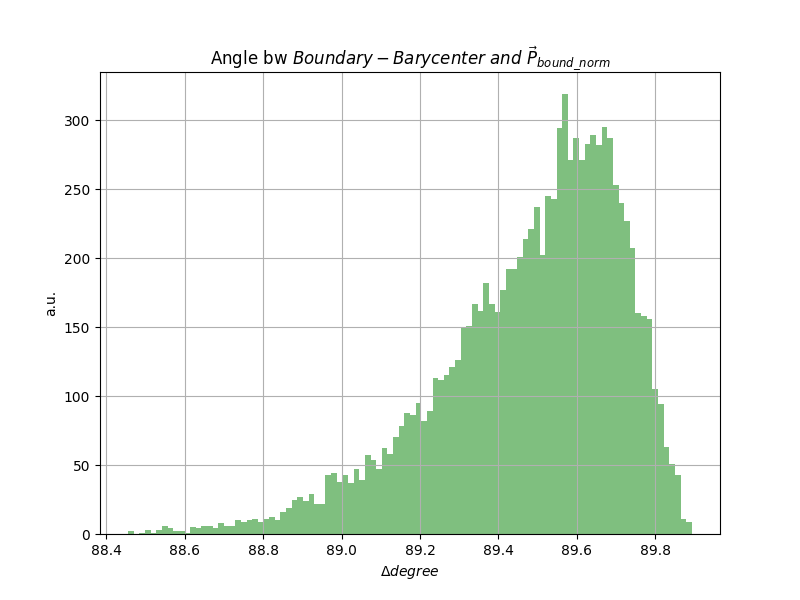

In [24]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(theta[~np.isnan(theta)], bins=100, color= 'green', alpha = 0.5)#, range = (-0.2, 0.2) )

plt.xlabel(r'$\Delta degree$') 
plt.ylabel('a.u.')
# plt.yscale('log')
plt.title(r'Angle bw $ Boundary-Barycenter \ and\ \vec{P}_{{bound\_norm}} $') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

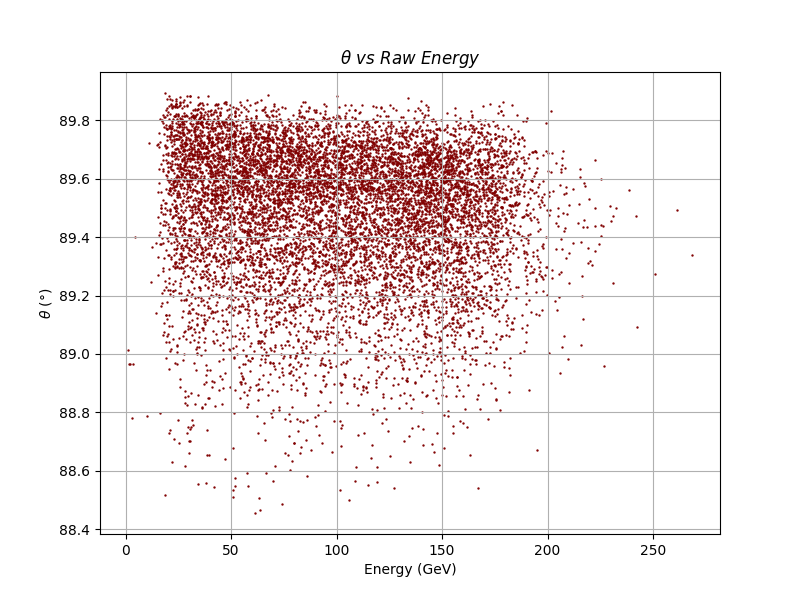

In [456]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_SC_ON, theta , s = 0.5 , color = 'maroon')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Raw\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

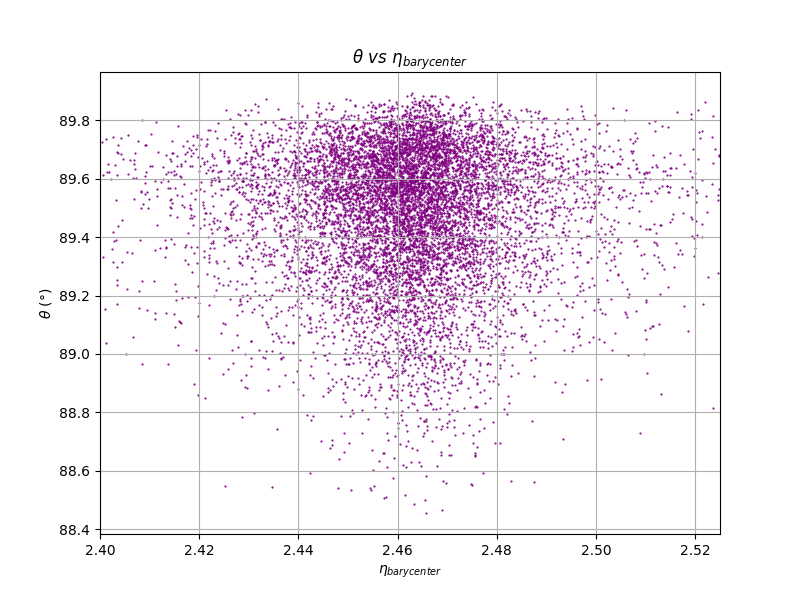

In [457]:
plt.figure(figsize=(8, 6))

plt.scatter(barycenters_eta_sim_ON, theta , s = 0.3 , color = 'purple')

plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

### Angle Bound-Bary and eVector

In [458]:
cos_theta = np.sum(((v-boundary)/np.linalg.norm(v-boundary))*u, axis = 1)
theta = np.arccos(cos_theta)*180/np.pi

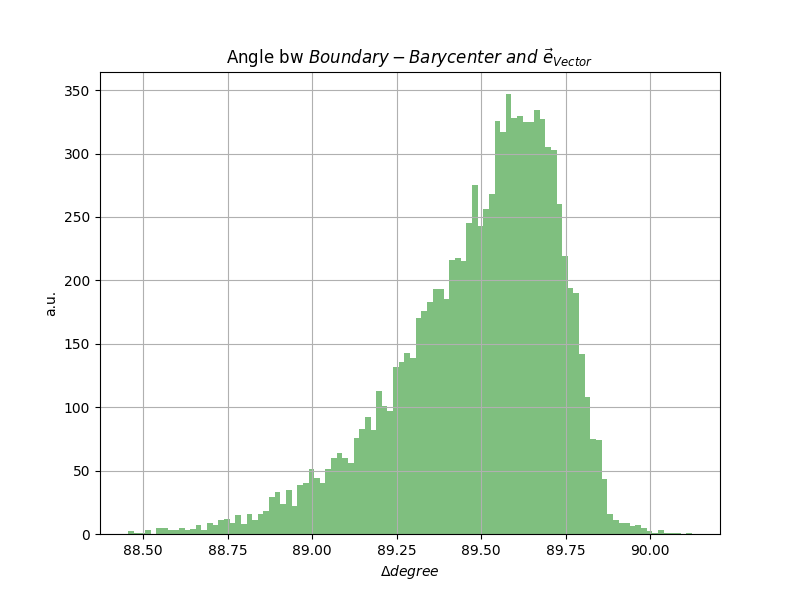

In [463]:
plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(theta[~np.isnan(theta)], bins=100, color= 'green', alpha = 0.5)#, range = (-0.2, 0.2) )

plt.xlabel(r'$\Delta degree$') 
plt.ylabel('a.u.')
# plt.yscale('log')
plt.title(r'Angle bw $ Boundary-Barycenter \ and\ \vec{e}_{{Vector}} $') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

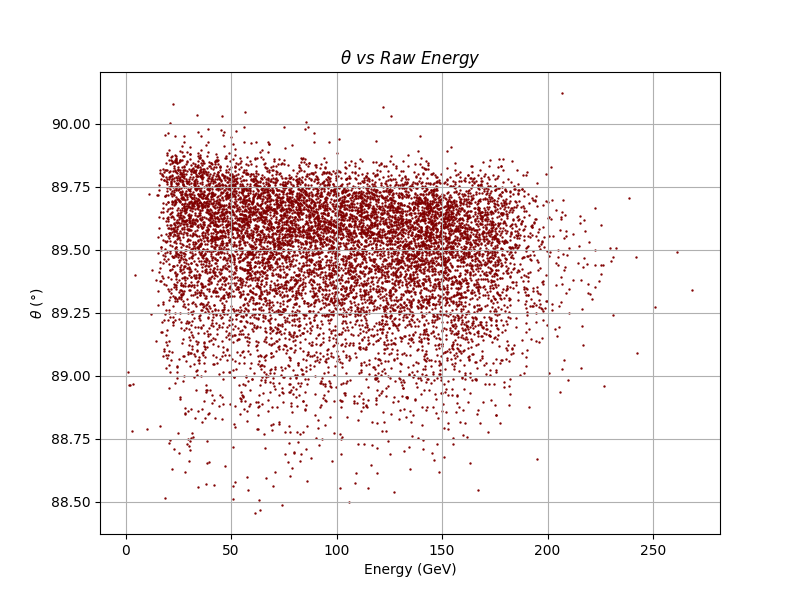

In [460]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_SC_ON, theta , s = 0.5 , color = 'maroon')

plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ Raw\ Energy$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

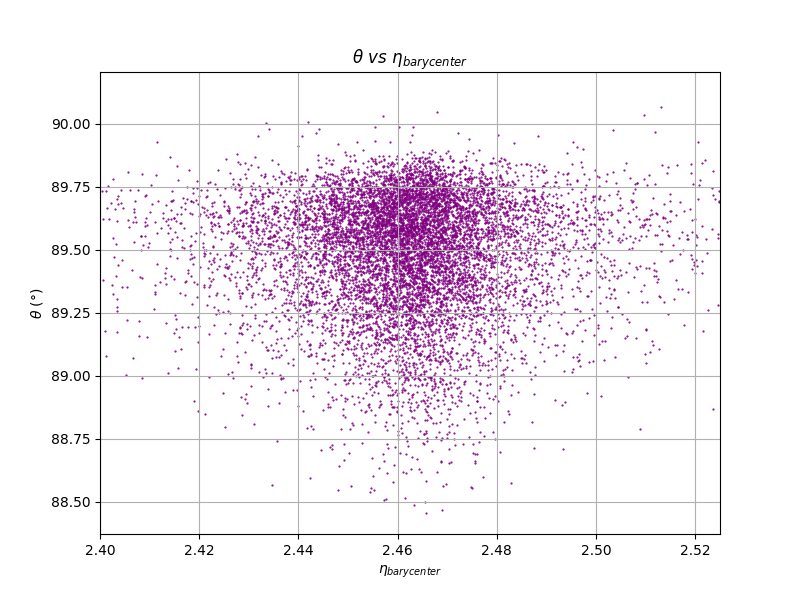

In [461]:
plt.figure(figsize=(8, 6))

plt.scatter(barycenters_eta_sim_ON, theta , s = 0.3 , color = 'purple')

plt.xlim(2.4, 2.525)
plt.xlabel(r'$\eta_{barycenter}$')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta\ vs\ \eta_{barycenter}$') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

### k

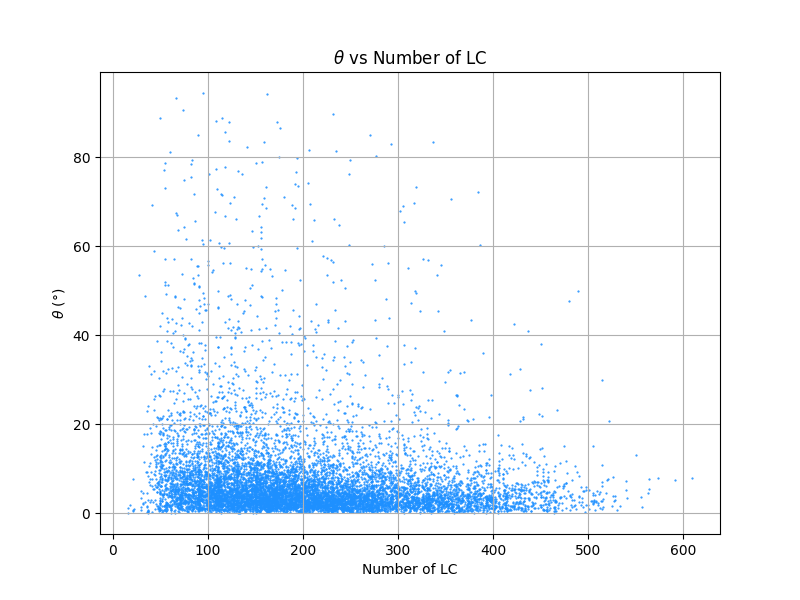

In [346]:
plt.figure(figsize=(8, 6))

plt.scatter(NClusters_sim_ON, theta , s = 0.3 , color = 'dodgerblue')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'Number of LC')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta$ vs Number of LC') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))

plt.scatter(NClusters_sim_ON, x_simSC_ON , s = 0.3 , color = 'dodgerblue')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'Number of LC')
plt.ylabel(r'$\theta\ (\degree)$')
# plt.yscale('log')
plt.title(r'$ \theta$ vs Number of LC') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

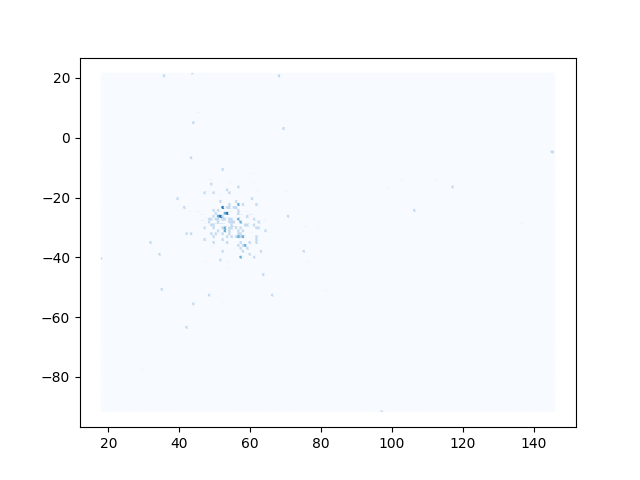

In [45]:
plt.close()
plt.hexbin(x_simSC_ON[1],y_simSC_ON[1] , cmap = 'Blues', gridsize=200)
plt.show()

In [19]:
baryenergy_raw_SC_ON[:]

<Array [[53.2], [166], ..., [89.6], [79.9]] type='10000 * var * float32'>

In [5]:
NClusters_sim_ON

<Array [135, 278, 46, 243, 372, ..., 213, 278, 282, 84] type='10000 * uint32'>

In [12]:
z_simSC_ON[0][0]

<Array [456, 447, 439, 439, 431, ..., 358, 348, 360, 323] type='135 * float32'>

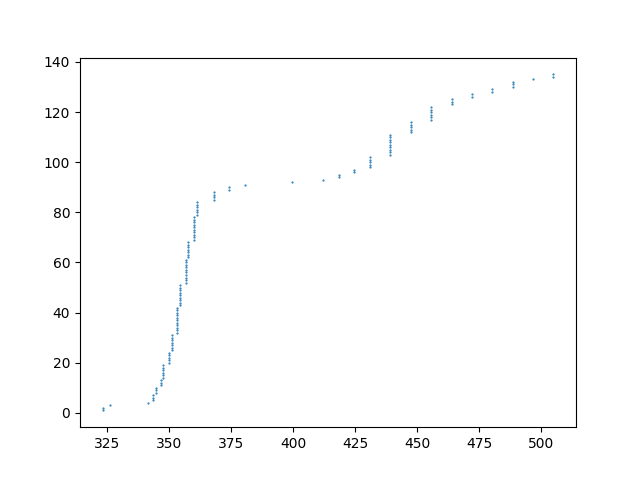

In [29]:
plt.scatter(np.sort(z_simSC_ON[0][0]), np.arange(1, 136), s = 0.3 )
plt.show()

In [28]:
plt.close()

In [12]:
len(x_simSC_ON[0][0])

135

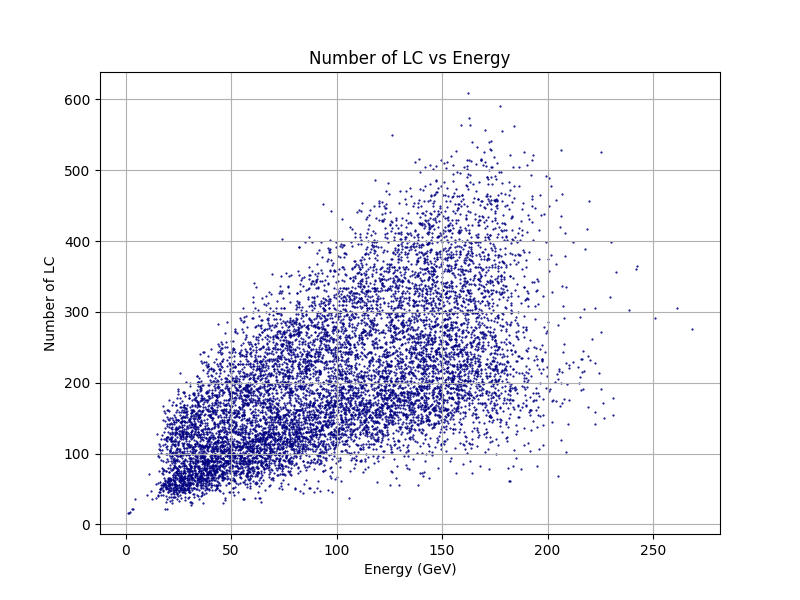

In [349]:
plt.figure(figsize=(8, 6))

plt.scatter(baryenergy_raw_SC_ON, NClusters_sim_ON , s = 0.3 , color = 'navy')

# plt.xlim(2.4, 2.525)
plt.xlabel(r'Energy (GeV)')
plt.ylabel(r'Number of LC')
# plt.yscale('log')
plt.title(r'Number of LC vs Energy') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

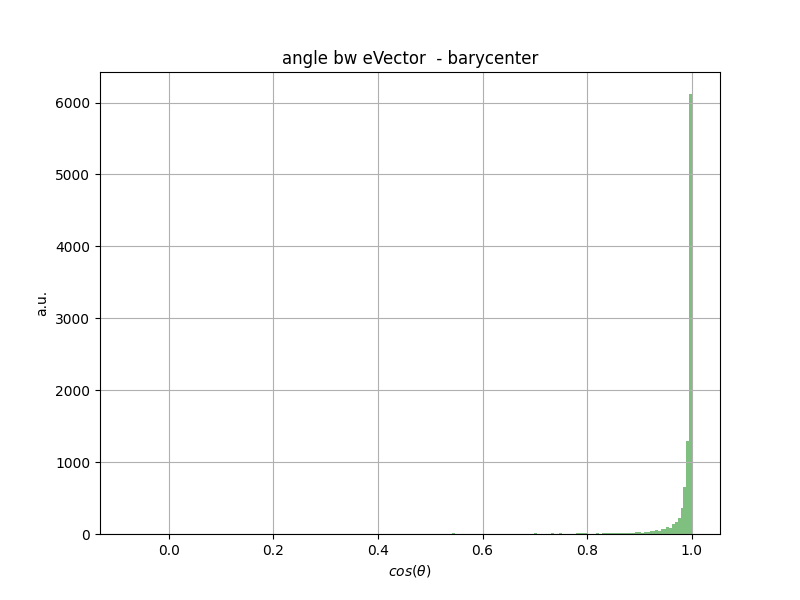

In [143]:
cos_theta = np.sum(v*u, axis = 1)

plt.figure(figsize=(8, 6))

n, bins, _ = plt.hist(cos_theta, bins=200, color= 'green', alpha = 0.5)#, range = (0.9, 1) )

# bin_centers = 0.5 * (bins[:-1] + bins[1:])
# plt.errorbar(bin_centers, n, yerr=np.sqrt(n), fmt='o', color='green', alpha=1, ms = 0.9)

# plt.xlim(0.95, 1.01)

plt.xlabel(r'$cos(\theta)$')
plt.ylabel('a.u.')
plt.title(r'angle bw eVector  - barycenter') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [135]:
# cos = np.dot(u, , axis = 1)


In [118]:
cos_theta

array([0.99989015, 0.98834443, 0.9738629 , ..., 0.99997115, 0.99792963,
       0.996062  ], dtype=float32)

C:\Users\chand\AppData\Local\Temp\ipykernel_24636\2720442087.py:4: RuntimeWarning: invalid value encountered in log
  plt.hist(np.log(cos_theta), bins=200, color= 'green', alpha = 0.5)#, range = (0.9, 1) )


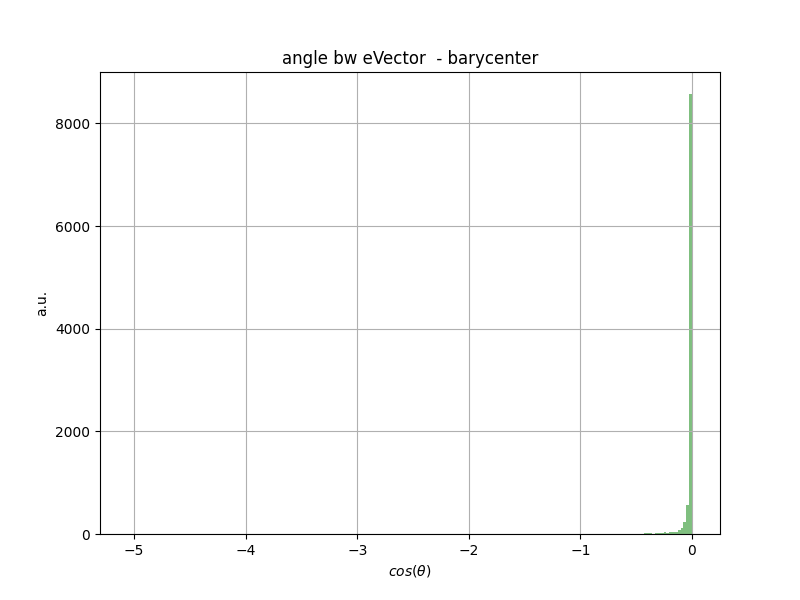

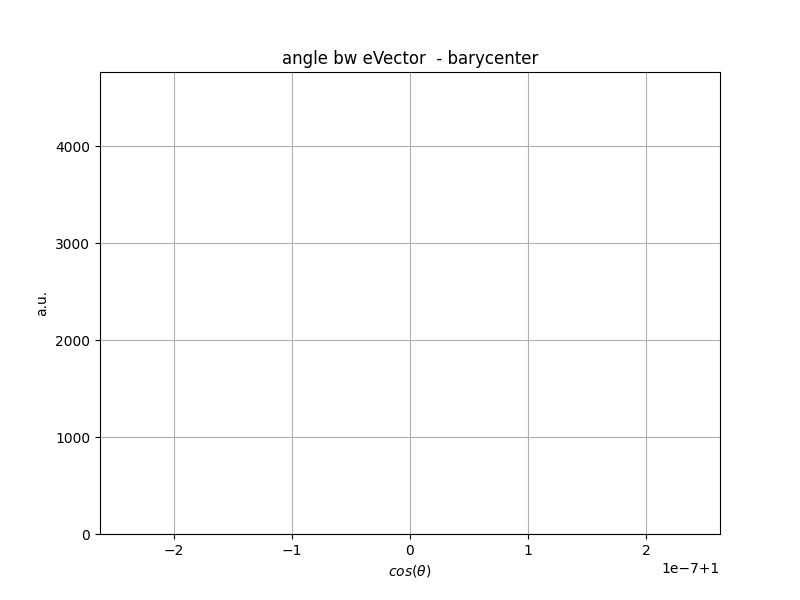

In [133]:
plt.figure(figsize=(8, 6))

# n, bins, _ = 
plt.hist(cos_theta, bins=200, color= 'green', alpha = 0.5 )

# plt.xlim(0.95, 1.01)

plt.xlabel(r'$cos(\theta)$')
plt.ylabel('a.u.')
plt.title(r'angle bw eVector  - barycenter') #, x = 0.3, y = 0.92
# # plt.legend()
plt.grid()
plt.show()

In [296]:

plt.close()

In [60]:
v

array([[-58.920578 ,  37.23836  , 411.0208   ],
       [ 53.984486 , -26.699514 , 364.3097   ],
       [-66.40109  ,  31.21552  , 435.24252  ],
       ...,
       [-26.356821 ,  61.285873 , 387.01553  ],
       [  8.8196745, -61.45332  , 360.43826  ],
       [-38.28191  ,  56.683502 , 396.37073  ]], dtype=float32)

In [58]:
np.linalg.norm(v/np.linalg.norm(v, axis = 1, keepdims=True), axis = 1)

10000

In [53]:
np.linalg.norm(v, axis = 1, keepdims=False)

array([416.889  , 369.2543 , 441.3837 , ..., 392.7234 , 365.74588,
       402.22913], dtype=float32)

In [29]:
np.shape(u)

(3, 10000, 1)

In [31]:
u

array([[-0.14082009,  0.25729764, -0.13522092, ..., -0.0734795 ,
         0.06336003, -0.08649017],
       [ 0.07456396,  0.03034608, -0.15727203, ...,  0.16005574,
        -0.21769471,  0.22785991],
       [ 0.98722345,  0.96585566,  0.97825396, ...,  0.98436934,
         0.97395813,  0.9698451 ]], dtype=float32)

In [33]:
u

array([[-0.14082009,  0.07456396,  0.98722345],
       [ 0.25729764,  0.03034608,  0.96585566],
       [-0.13522092, -0.15727203,  0.97825396],
       ...,
       [-0.0734795 ,  0.16005574,  0.98436934],
       [ 0.06336003, -0.21769471,  0.97395813],
       [-0.08649017,  0.22785991,  0.9698451 ]], dtype=float32)

In [32]:
# u= np.reshape(u, (3, 10000))
# u = np.transpose(u)

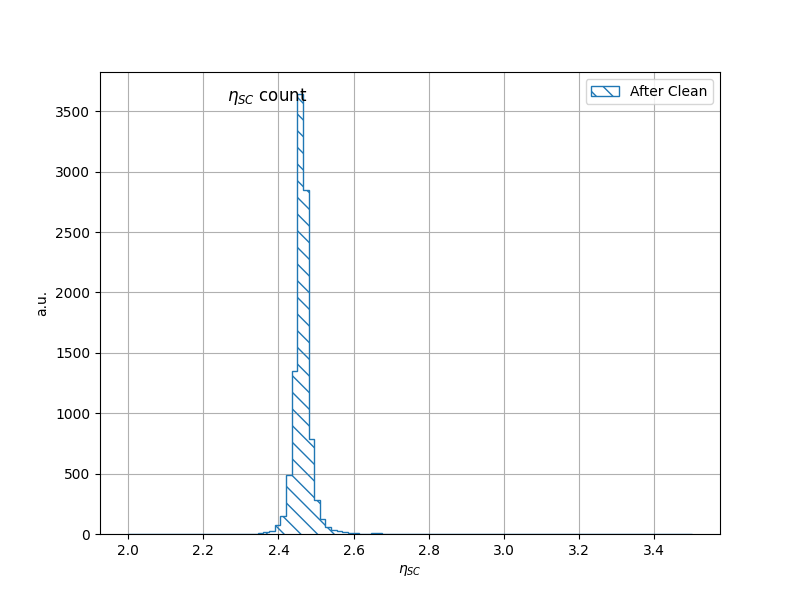

In [25]:
plt.figure(figsize=(8, 6))
# n_after, bins_after, _ = plt.hist(eta_tc - eta_SC, bins=100, range=(-0.2,0.2), label = "After Clean", color= 'lawngreen', alpha = 0.5 )
# plt.hist(eta_tc_OFF - eta_SC_OFF, bins=100, range=(-0.2,0.2), label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

plt.hist(eta_SC_ON, bins=100, range=(2,3.5), label = "After Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

# bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
# plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)

plt.xlabel(r'$\eta_{SC}$')
plt.ylabel('a.u.')
plt.title(r'$\eta_{SC}$ count', x = 0.27, y = 0.92)
plt.legend()
plt.grid()
plt.show()

# Clue3DHigh vs SimtracksterSC

## Initalise

In [4]:
# Clue3DHigh

coord_arr_c3Dh = file["ticlDumper/trackstersCLUE3DHigh"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_c3Dh = file["ticlDumper/trackstersCLUE3DHigh"].arrays(["vertices_energy" ], library= "ak")
barycenters_c3Dh = file["ticlDumper/trackstersCLUE3DHigh"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")

# Hits
x_c3Dh = coord_arr_c3Dh["vertices_x"][:] #ak.flatten(coord_arr_c3Dh["vertices_x"][:100], axis= 0)
y_c3Dh = coord_arr_c3Dh["vertices_y"][:] #ak.flatten(coord_arr_c3Dh["vertices_y"][:100], axis= 0)
z_c3Dh = coord_arr_c3Dh["vertices_z"][:] #ak.flatten(coord_arr_c3Dh["vertices_z"][:100], axis= 0)

# Energy
energy_c3Dh = energy_arr_c3Dh["vertices_energy"][:] #ak.flatten(energy_arr_c3Dh["vertices_energy"][:100], axis= 0)
baryenergy_c3Dh = file["ticlDumper/trackstersCLUE3DHigh/regressed_energy"].arrays(library = "ak")["regressed_energy"]

# Barycenter
bary_z_c3Dh = barycenters_c3Dh["barycenter_z"] #np.array(ak.flatten(barycenters["barycenter_z"][:10], axis= None))
bary_x_c3Dh = barycenters_c3Dh["barycenter_x"] #np.array(ak.flatten(barycenters["barycenter_x"][:10], axis= None))
bary_y_c3Dh = barycenters_c3Dh["barycenter_y"] #np.array(ak.flatten(barycenters["barycenter_y"][:10], axis= None))

In [5]:
#SimTracksterSC

coord_arr_simSC = file["ticlDumper/simtrackstersSC"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_simSC = file["ticlDumper/simtrackstersSC"].arrays(["vertices_energy" ], library= "ak")
barycenters_simSC = file["ticlDumper/simtrackstersSC"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")


# Hits
x_simSC = coord_arr_simSC["vertices_x"][:] #ak.flatten(coord_arr_simSC["vertices_x"][:], axis= 0)
y_simSC = coord_arr_simSC["vertices_y"][:] #ak.flatten(coord_arr_simSC["vertices_y"][:], axis= 0)
z_simSC = coord_arr_simSC["vertices_z"][:] #ak.flatten(coord_arr_simSC["vertices_z"][:], axis= 0)

# Energy
energy_simSC = energy_arr_simSC["vertices_energy"][:] #ak.flatten(energy_arr_simSC["vertices_energy"][:], axis= 0)
baryenergy_simSC = file["ticlDumper/simtrackstersSC/regressed_energy"].arrays(library = "ak")["regressed_energy"]

# Barycenter
bary_z_simSC = barycenters_simSC["barycenter_z"] # np.array(ak.flatten(barycenters_simSC["barycenter_z"][:], axis= None)) #
bary_x_simSC = barycenters_simSC["barycenter_x"] # np.array(ak.flatten(barycenters_simSC["barycenter_x"][:], axis= None)) # 
bary_y_simSC = barycenters_simSC["barycenter_y"] # np.array(ak.flatten(barycenters_simSC["barycenter_y"][:], axis= None)) # 

In [6]:
# Scaling (if Required)
energy_c3Dh = energy_c3Dh
baryenergy_c3Dh = baryenergy_c3Dh

energy_simSC = energy_simSC
baryenergy_simSC = baryenergy_simSC

## Eta & Phi

In [ ]:
# x_c3Dh[0]
# baryenergy_c3Dh[:10]
# bary_x_c3Dh[0]
# baryenergy_simSC
# np.array(bary_x_simSC[:10])

In [6]:
N= 10001 #(<100)
eta_SC = []          ;    phi_SC = []
eta_c3Dh = []        ;    phi_c3Dh = []

eta_SC = eta(bary_x_simSC[:N], bary_y_simSC[:N], bary_z_simSC[:N])
phi_SC= phi(bary_x_simSC[:N], bary_y_simSC[:N])


# ## Found that for some events, no Clue3DHigh was created
# len(eta_c3Dh) # 9994   if N = 10000     eg 100th element i = 99

# ## Also Note that had not included = in (>) to get rid of 0 in the non_empty_mask
# 0. in ak.max(baryenergy_c3Dh[:N], axis=1)   #True

non_empty_mask = ak.max(baryenergy_c3Dh[:N], axis=1) > 0
eta_SC = ak.flatten(eta_SC[non_empty_mask])
phi_SC = ak.flatten(phi_SC[non_empty_mask])

In [8]:
# # Weighted tracksters:
# for evnt, non_empty in enumerate(non_empty_mask):
#     if non_empty:
#         eta_c3Dh += [np.average(eta(bary_x_c3Dh[evnt], bary_y_c3Dh[evnt], bary_z_c3Dh[evnt]), weights = baryenergy_c3Dh[evnt])]
#         phi_c3Dh += [np.average(phi(bary_x_c3Dh[evnt], bary_y_c3Dh[evnt]), weights = baryenergy_c3Dh[evnt])]

In [7]:
## Highest energy tracksters:

mask = (baryenergy_c3Dh[:N] == ak.max(baryenergy_c3Dh[:N], axis=1)) & (ak.max(baryenergy_c3Dh[:N], axis=1) != 0)
eta_c3Dh = eta(ak.flatten(bary_x_c3Dh[:N][mask]), ak.flatten(bary_y_c3Dh[:N][mask]), ak.flatten(bary_z_c3Dh[:N][mask]))
phi_c3Dh = phi(ak.flatten(bary_x_c3Dh[:N][mask]), ak.flatten(bary_y_c3Dh[:N][mask]))

# ak.max(baryenergy_c3Dh[:N], axis=1)[95:105]
# baryenergy_c3Dh[95:105]
# len(eta_SC)

In [13]:
# test = non_empty_mask == (np.sum(mask, axis = 1)==1)
# print(test[95:105])

In [159]:
# data_eta = {'Clue3DHigh Eta': e_c3Dh, 'SimtracksterSC Eta': e, 'Rel Difference': (e_c3Dh-e)/e}
# data_phi = {'Clue3DHigh Phi': p_c3Dh, 'SimtracksterSC Phi': p, 'Rel Difference': (p_c3Dh-p)/p}
# df = pd.DataFrame(data_eta)
# print(df[['Clue3DHigh Eta', 'SimtracksterSC Eta']])

In [246]:
np.abs(eta_c3Dh - eta_SC)[95:101]

<Array [0.00465, 0.0129, 0.0128, ..., 0.0172, 0.0112] type='6 * float32'>

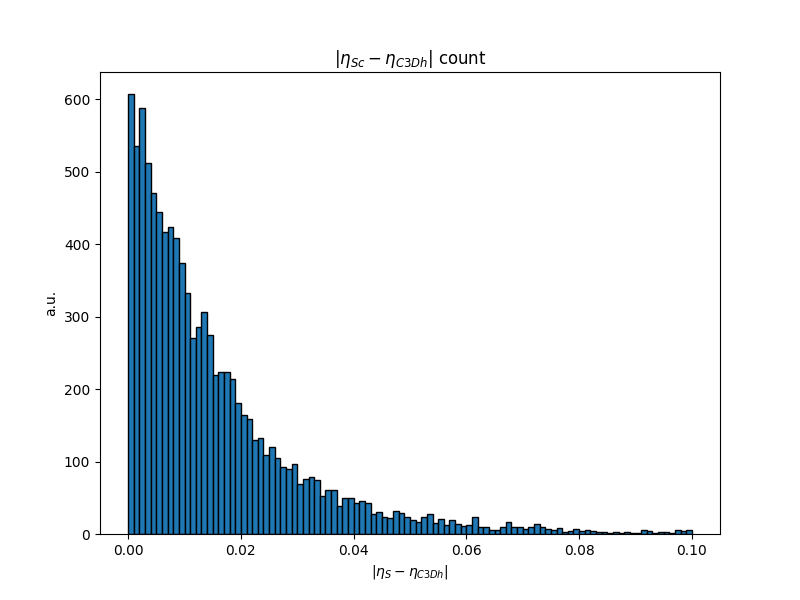

In [8]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(eta_c3Dh - eta_SC), bins=100, edgecolor='black', range=(0,0.1))
plt.xlabel(r'|$\eta_{S}-\eta_{C3Dh}$|')
plt.ylabel('a.u.')
plt.title(r'|$\eta_{Sc}-\eta_{C3Dh}$| count')
plt.show()

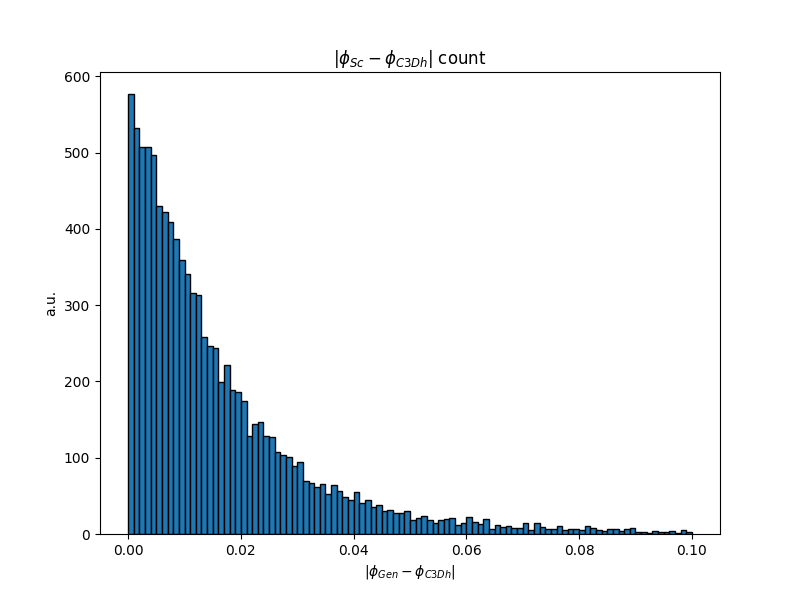

In [11]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(phi_c3Dh - phi_SC), bins=100, edgecolor='black', range=(0,0.1))  # TRY without range too!!
plt.xlabel(r'|$\phi_{Gen}-\phi_{C3Dh}$|')
plt.ylabel('a.u.')
plt.title(r'|$\phi_{Sc}-\phi_{C3Dh}$| count')
plt.show()

## Energy

In [30]:
N= 10001 #(<100)
non_empty_mask = ak.max(baryenergy_c3Dh[:N], axis=1) > 0
Energy_SC = ak.drop_none(baryenergy_simSC[non_empty_mask])
Energy_c3Dh = []

# # Weighted tracksters:
# for evnt, non_empty in enumerate(non_empty_mask):
#     if non_empty:
#         Energy_c3Dh += [np.average(baryenergy_c3Dh[evnt], weights = baryenergy_c3Dh[evnt])]

# Highest energy tracksters:
mask = (baryenergy_c3Dh[:N] == ak.max(baryenergy_c3Dh[:N], axis=1)) & (ak.max(baryenergy_c3Dh[:N], axis=1) != 0)
Energy_c3Dh = ak.drop_none(ak.max(baryenergy_c3Dh[:N], axis=1)[non_empty_mask])

Energy_c3Dh = np.roll(Energy_c3Dh, 5)

mask = (baryenergy_c3Dh[:N] == ak.max(baryenergy_c3Dh[:N], axis=1)) & (ak.max(baryenergy_c3Dh[:N], axis=1) != 0)
Energy_c3Dh = ak.flatten(baryenergy_c3Dh[mask])

In [8]:
# 0 in ak.max(baryenergy_c3Dh[:N], axis=1)
test = ak.max(baryenergy_c3Dh[:N], axis=1)

In [9]:
testnp= ak.to_numpy(test)

In [10]:
testnp[0]

60.69777

In [11]:
np.where( testnp== [0])

(array([9561], dtype=int64),)

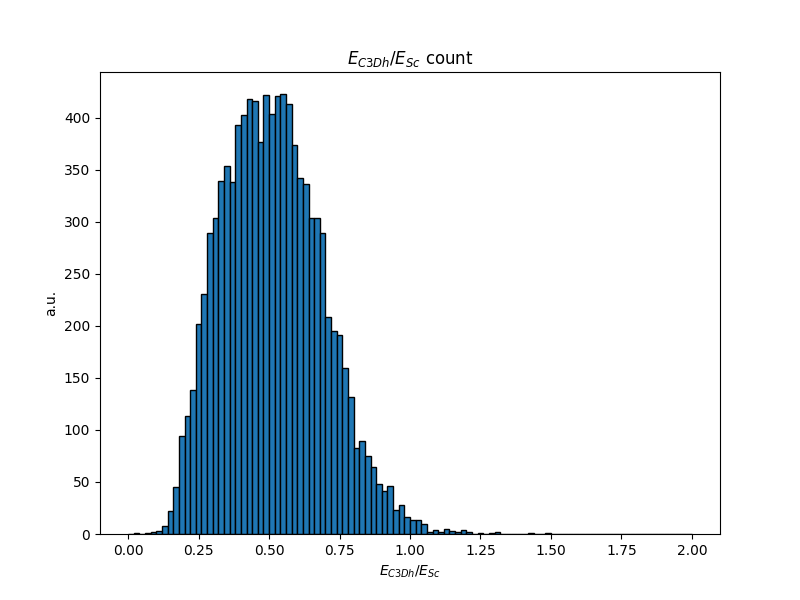

In [12]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(Energy_c3Dh/Energy_SC), bins=100, edgecolor='black', range=(0,2))
plt.xlabel(r'$E_{C3Dh}/E_{Sc}$')
plt.ylabel('a.u.')
plt.title(r'$E_{C3Dh}/E_{Sc}$ count')
plt.show()

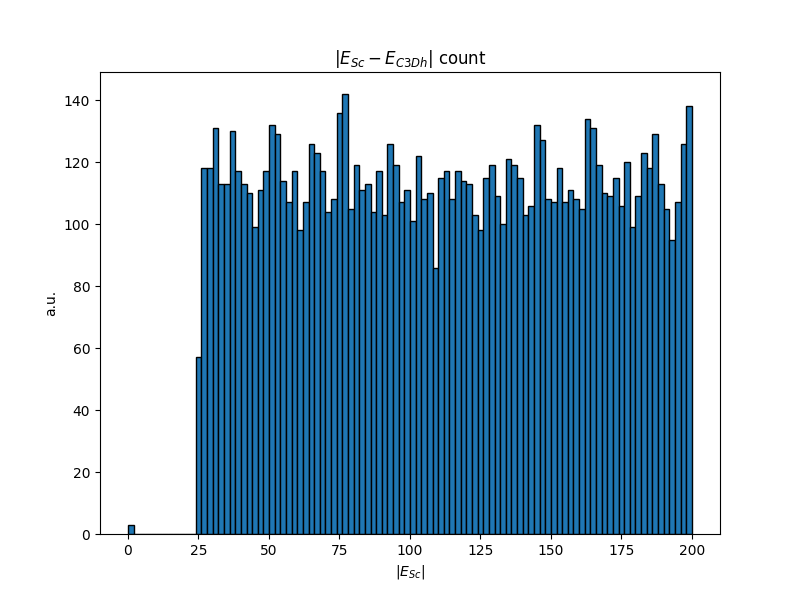

In [13]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(Energy_SC), bins=100, edgecolor='black')
plt.xlabel(r'|$E_{Sc}$|')
plt.ylabel('a.u.')
plt.title(r'|$E_{Sc}-E_{C3Dh}$| count')
plt.show()

## Weird energy

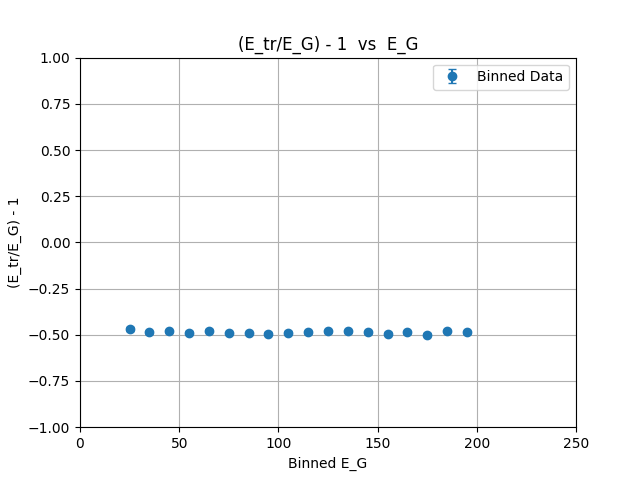

In [31]:
y = (Energy_c3Dh/Energy_SC)-1

bin_width = 10
# bins = np.arange(min(Energy_SC)[0], max(Energy_SC)[0] + bin_width, bin_width)  
bins = np.arange(20, 200 + bin_width, bin_width)  

bin_centers = (bins[:-1] + bins[1:]) / 2 
digitized = np.digitize(Energy_SC, bins)

binned_y = [] 
y_uncertainties = [] 

for i in range(1, len(bins)):
    bin_indices = np.where(digitized == i)  
    y_in_bin = y[bin_indices]
    if len(y_in_bin) > 0:
        binned_y.append(np.mean(y_in_bin))  
        y_uncertainties.append(np.std(y_in_bin) / np.sqrt(len(y_in_bin))) 
    else:
        binned_y.append(np.nan) 
        y_uncertainties.append(np.nan)

binned_y = np.array(binned_y)
y_uncertainties = np.array(y_uncertainties)
valid = ~np.isnan(binned_y)
bin_centers = bin_centers[valid]
binned_y = binned_y[valid]
y_uncertainties = y_uncertainties[valid]


plt.figure()
plt.errorbar(bin_centers, binned_y, yerr=y_uncertainties, fmt='o', label='Binned Data', capsize=3)
plt.xlabel('Binned E_G')
plt.ylabel('(E_tr/E_G) - 1')
plt.xlim(0, 250)
plt.ylim(-1, 1)
plt.title('(E_tr/E_G) - 1  vs  E_G')
plt.legend()
plt.grid()
plt.show()




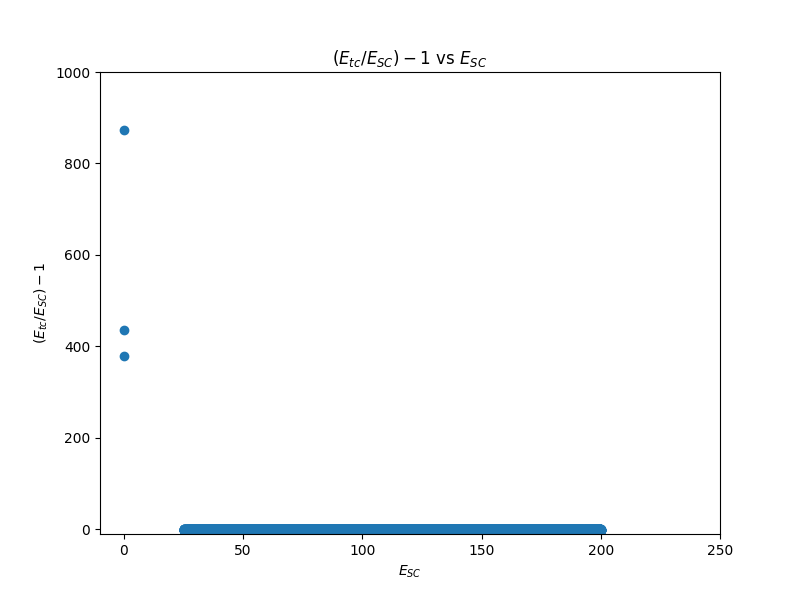

In [9]:
plt.figure(figsize=(8, 6))
plt.scatter( Energy_SC, (Energy_tc/Energy_SC)-1)

plt.xlim(-10, 250) #0, 250  
plt.ylim(-10, 1000)

plt.xlabel(r'$E_{SC}$')
plt.ylabel(r'$(E_{tc}/E_{SC})-1$')
plt.title(r'$(E_{tc}/E_{SC})-1$ vs $E_{SC}$')
plt.show()

In [10]:
y = (Energy_tc/Energy_SC)-1

bin_width = 10
# bins = np.arange(min(Energy_SC)[0], max(Energy_SC)[0] + bin_width, bin_width)  
bins = np.arange(20, 200 + bin_width, bin_width)  

In [11]:
bin_centers = (bins[:-1] + bins[1:]) / 2 
digitized = np.digitize(Energy_SC, bins)

In [12]:
binned_y = [] 
y_uncertainties = [] 

for i in range(1, len(bins)):
    bin_indices = np.where(digitized == i)  
    y_in_bin = y[bin_indices]
    if len(y_in_bin) > 0:
        binned_y.append(np.mean(y_in_bin))  
        y_uncertainties.append(np.std(y_in_bin) / np.sqrt(len(y_in_bin))) 
    else:
        binned_y.append(np.nan) 
        y_uncertainties.append(np.nan)

In [20]:
# binned_y

In [15]:
binned_y = np.array(binned_y)
y_uncertainties = np.array(y_uncertainties)
valid = ~np.isnan(binned_y)
bin_centers = bin_centers[valid]
binned_y = binned_y[valid]
y_uncertainties = y_uncertainties[valid]

In [21]:
# bin_centers

In [22]:
# binned_y

In [23]:
# y_uncertainties

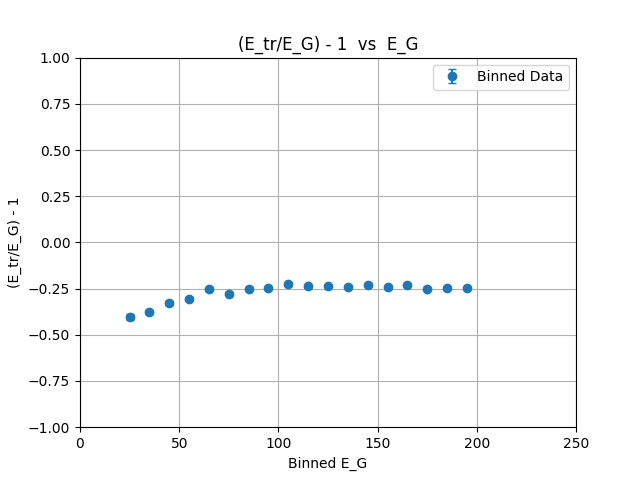

In [19]:
plt.figure()
plt.errorbar(bin_centers, binned_y, yerr=y_uncertainties, fmt='o', label='Binned Data', capsize=3)
plt.xlabel('Binned E_G')
plt.ylabel('(E_tr/E_G) - 1')
plt.xlim(0, 250)
plt.ylim(-1, 1)
plt.title('(E_tr/E_G) - 1  vs  E_G')
plt.legend()
plt.grid()
plt.show()


In [24]:
plt.close()

## Plots

In [38]:
i =  1#9561 #99

In [43]:
Energy_c3Dh[i]

31.303307

In [14]:
baryenergy_c3Dh[i]

<Array [0] type='1 * float32'>

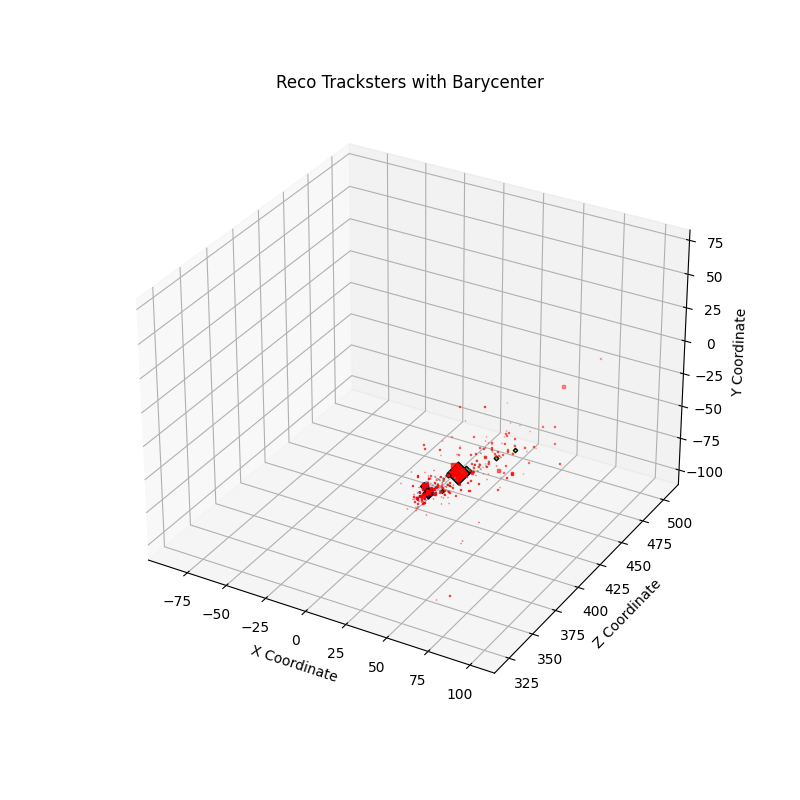

In [40]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')


color = 'red'
#Plotting SimTracksterSC
ax.scatter3D(x_simSC[i, 0], z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color, marker = 's')
ax.scatter3D(bary_x_simSC[i], bary_z_simSC[i], bary_y_simSC[i], color=color, edgecolor='black', s=baryenergy_simSC[i], marker='D', linewidths=1)

#Plotting Clue3DHigh
for trackster_ in range(len(energy_c3Dh[i])):#
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax.scatter3D(x_c3Dh[i, trackster_], z_c3Dh[i, trackster_], y_c3Dh[i, trackster_], s= energy_c3Dh[i, trackster_], color=color)
    ax.scatter3D(bary_x_c3Dh[i][trackster_], bary_z_c3Dh[i][trackster_], bary_y_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)


ax.set_title('Reco Tracksters with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')

# ax.legend()
plt.show()

Text(0.5, 0.98, 'Rec hits with Barycenter')

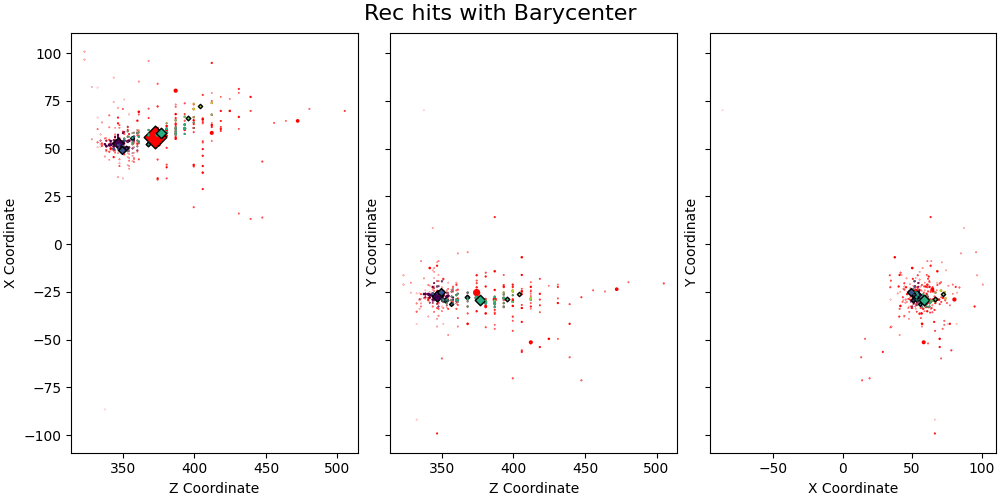

In [41]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, layout='constrained', sharey=True, figsize = (10,5))

color = 'red'
ax1.scatter(z_simSC[i, 0], x_simSC[i, 0], s=energy_simSC[i, 0], color=color)
ax1.scatter(bary_z_simSC[i][0], bary_x_simSC[i][0], color=color, edgecolor='black', s=baryenergy_simSC[i, 0], marker='D', linewidths=1)

for trackster_ in range(len(energy_c3Dh[i])): #
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax1.scatter(z_c3Dh[i, trackster_], x_c3Dh[i, trackster_], s=energy_c3Dh[i, trackster_], color=color)
    ax1.scatter(bary_z_c3Dh[i][trackster_], bary_x_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)

ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

color = 'red'
ax2.scatter(z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color)

for trackster_ in range(len(energy_c3Dh[i])): #
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax2.scatter(z_c3Dh[i, trackster_], y_c3Dh[i, trackster_], s=energy_c3Dh[i, trackster_], color=color)
    ax2.scatter(bary_z_c3Dh[i][trackster_], bary_y_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)

ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')


color = 'red'
ax3.scatter(x_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color)

for trackster_ in range(len(energy_c3Dh[i])): #
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax3.scatter(x_c3Dh[i, trackster_], y_c3Dh[i, trackster_], s=energy_c3Dh[i, trackster_], color=color)
    ax3.scatter(bary_x_c3Dh[i][trackster_], bary_y_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)

    
ax3.set_xlabel('X Coordinate')
ax3.set_ylabel('Y Coordinate')


fig.suptitle('Rec hits with Barycenter', fontsize=16)

In [408]:
plt.close()

# TiclCandidate vs SimtracksterSC

## Intialize

In [4]:
# TiclCandidate

coord_arr_tc = file["ticlDumper/trackstersTiclCandidate"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_tc = file["ticlDumper/trackstersTiclCandidate"].arrays(["vertices_energy" ], library= "ak")
barycenters_tc = file["ticlDumper/trackstersTiclCandidate"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")

# Hits
x_tc = coord_arr_tc["vertices_x"][:] #ak.flatten(coord_arr_tc["vertices_x"][:100], axis= 0)
y_tc = coord_arr_tc["vertices_y"][:] #ak.flatten(coord_arr_tc["vertices_y"][:100], axis= 0)
z_tc = coord_arr_tc["vertices_z"][:] #ak.flatten(coord_arr_tc["vertices_z"][:100], axis= 0)

# Energy
energy_tc = energy_arr_tc["vertices_energy"][:] #ak.flatten(energy_arr_tc["vertices_energy"][:100], axis= 0)
baryenergy_tc = file["ticlDumper/trackstersTiclCandidate/raw_energy"].arrays(library = "ak")["raw_energy"]

# Barycenter
bary_z_tc = barycenters_tc["barycenter_z"] #np.array(ak.flatten(barycenters["barycenter_z"][:10], axis= None))
bary_x_tc = barycenters_tc["barycenter_x"] #np.array(ak.flatten(barycenters["barycenter_x"][:10], axis= None))
bary_y_tc = barycenters_tc["barycenter_y"] #np.array(ak.flatten(barycenters["barycenter_y"][:10], axis= None))

In [5]:
#SimTracksterSC

coord_arr_simSC = file["ticlDumper/simtrackstersSC"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_simSC = file["ticlDumper/simtrackstersSC"].arrays(["vertices_energy" ], library= "ak")
barycenters_simSC = file["ticlDumper/simtrackstersSC"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")
boundary_simSC = file["ticlDumper/simtrackstersSC"].arrays(["boundaryX", "boundaryY" , "boundaryZ", "boundaryEta", "boundaryPhi"], library= "ak")


# Hits
x_simSC = coord_arr_simSC["vertices_x"][:]
y_simSC = coord_arr_simSC["vertices_y"][:]
z_simSC = coord_arr_simSC["vertices_z"][:]

# Energy
energy_simSC = energy_arr_simSC["vertices_energy"][:] 
baryenergy_simSC = file["ticlDumper/simtrackstersSC/raw_energy"].arrays(library = "ak")["raw_energy"]

# Barycenter
bary_z_simSC = barycenters_simSC["barycenter_z"] 
bary_x_simSC = barycenters_simSC["barycenter_x"] 
bary_y_simSC = barycenters_simSC["barycenter_y"] 

# First Hit
boundaryX_simSC = boundary_simSC["boundaryX"]
boundaryY_simSC = boundary_simSC["boundaryY"]
boundaryZ_simSC = boundary_simSC["boundaryZ"]
boundaryEta_simSC = boundary_simSC["boundaryEta"]
boundaryPhi_simSC = boundary_simSC["boundaryPhi"]

In [6]:
# Scaling  and Masking(if Required)
energy_tc = energy_tc
baryenergy_tc = baryenergy_tc

energy_simSC = energy_simSC
baryenergy_simSC = baryenergy_simSC

N = 10001
non_empty_mask = ak.max(baryenergy_tc[:N], axis=1) > 0
mask = (baryenergy_tc[:N] == ak.max(baryenergy_tc[:N], axis=1)) & (ak.max(baryenergy_tc[:N], axis=1) != 0)

bary_x_tc = ak.flatten(bary_x_tc[mask])
bary_y_tc = ak.flatten(bary_y_tc[mask])
bary_z_tc = ak.flatten(bary_z_tc[mask])
baryenergy_tc = ak.flatten(baryenergy_tc[mask])

bary_x_simSC = ak.flatten(bary_x_simSC[non_empty_mask])
bary_y_simSC = ak.flatten(bary_y_simSC[non_empty_mask])
bary_z_simSC = ak.flatten(bary_z_simSC[non_empty_mask])
baryenergy_simSC = ak.flatten(baryenergy_simSC[non_empty_mask])

boundaryX_simSC = ak.flatten(boundaryX_simSC[non_empty_mask])
boundaryY_simSC = ak.flatten(boundaryY_simSC[non_empty_mask])
boundaryZ_simSC = ak.flatten(boundaryZ_simSC[non_empty_mask])
boundaryEta_simSC = ak.flatten(boundaryEta_simSC[non_empty_mask])
boundaryPhi_simSC = ak.flatten(boundaryPhi_simSC[non_empty_mask])

In [7]:
# len(baryenergy_tc_OFF)

## xyz Resolution plots

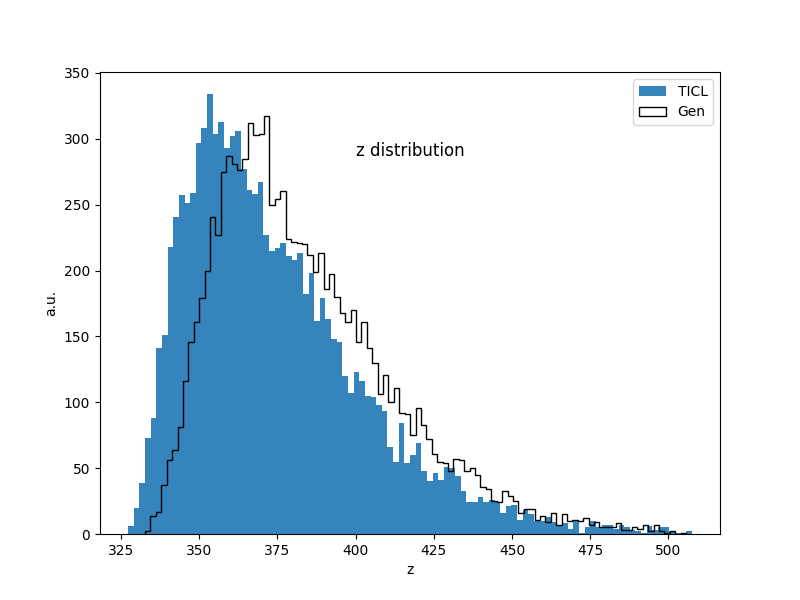

In [8]:
plt.figure(figsize=(8, 6))
plt.hist(bary_z_tc, bins=100,  alpha = 0.9, label= 'TICL')#, color = 'orange') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
plt.hist(bary_z_simSC, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"
plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.title('z distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()

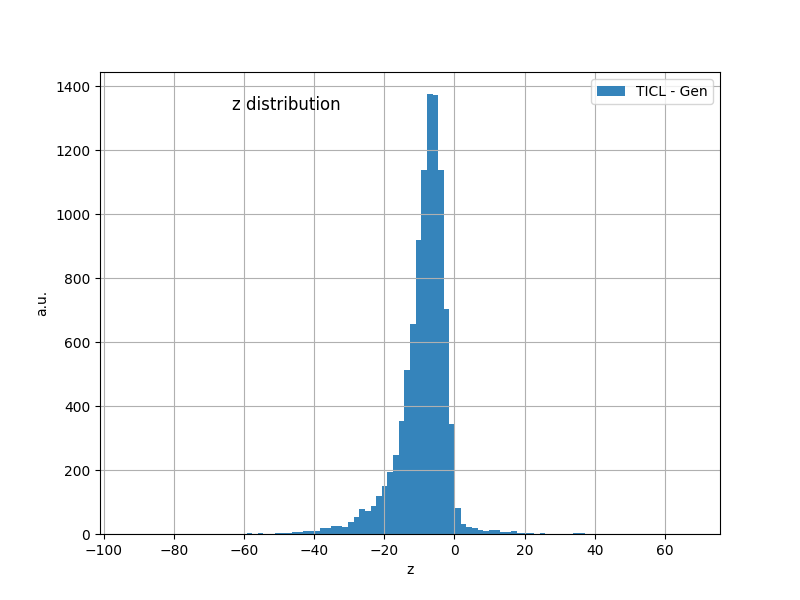

In [16]:
plt.figure(figsize=(8, 6))
plt.hist(bary_z_tc-bary_z_simSC, bins=100,  alpha = 0.9, label= 'TICL - Gen')#, color = 'green') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
# plt.hist(bary_z_simSC, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"
plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.title('z distribution', x = 0.3, y = 0.9)
plt.legend()
plt.grid()
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(bary_x_tc-bary_x_simSC, bins=100,  alpha = 0.5, label= 'TICL - Gen', color = 'green') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
# plt.hist(bary_z_simSC, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"
plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.title('z distribution', x = 0.3, y = 0.9)
plt.legend()
plt.grid()
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(bary_y_tc-bary_y_simSC, bins=100,  alpha = 0.9, label= 'TICL - Gen', color = 'orange') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
# plt.hist(bary_z_simSC, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"
plt.xlabel(r'y')
plt.ylabel('a.u.')
plt.title('y distribution', x = 0.3, y = 0.9)
plt.legend()
plt.grid()
plt.show()

In [24]:
plt.close()

## Eta & Phi

In [8]:
N= 10001 #(<100)
eta_SC = []          ;    phi_SC = []
eta_tc = []        ;    phi_tc = []

eta_SC = eta(bary_x_simSC[:N], bary_y_simSC[:N], bary_z_simSC[:N])
phi_SC= phi(bary_x_simSC[:N], bary_y_simSC[:N])


# ## Found that for some events, no Clue3DHigh was created
# len(eta_tc) # 9994   if N = 10000     eg 100th element i = 99

# ## Also Note that had not included = in (>) to get rid of 0 in the non_empty_mask
# 0. in ak.max(baryenergy_tc[:N], axis=1)   #True

# non_empty_mask = ak.max(baryenergy_tc[:N], axis=1) > 0
# eta_SC = ak.flatten(eta_SC[non_empty_mask])
# phi_SC = ak.flatten(phi_SC[non_empty_mask])

In [9]:
## Highest energy tracksters:

# mask = (baryenergy_tc[:N] == ak.max(baryenergy_tc[:N], axis=1)) & (ak.max(baryenergy_tc[:N], axis=1) != 0)
eta_tc = eta(bary_x_tc[:N], bary_y_tc[:N], bary_z_tc[:N])
phi_tc = phi(bary_x_tc[:N], bary_y_tc[:N])

# ak.max(baryenergy_tc[:N], axis=1)[95:105]
# baryenergy_tc[95:105]
# len(eta_SC)

In [10]:
len(eta_tc)

9968

In [11]:
len(eta_SC)

9968

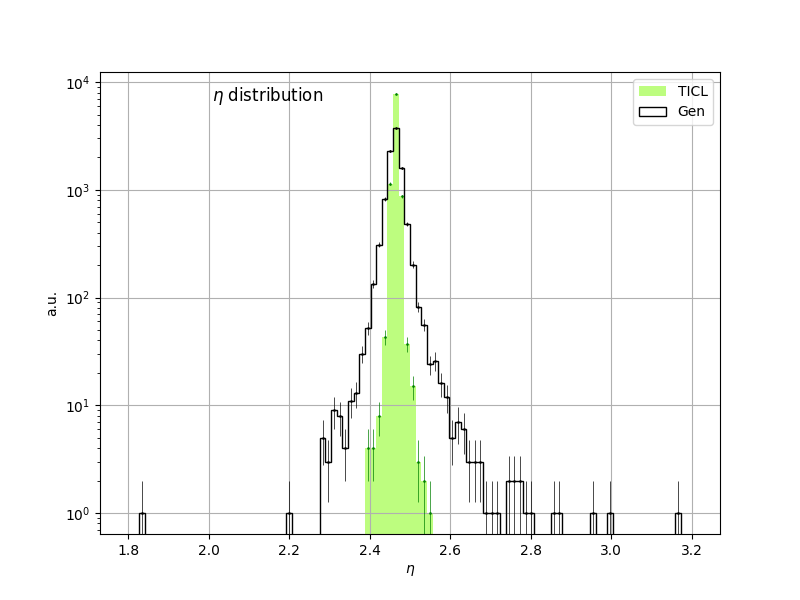

In [17]:
plt.figure(figsize=(8, 6))
n_tc, bins_tc, _ = plt.hist(eta_tc, bins=100,  alpha = 0.5, label= 'TICL', color = 'lawngreen', range = (1.8, 3.2))
n_SC, bins_SC, _ =plt.hist(eta_SC, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1, range = (1.8, 3.2)) 

bin_centers_tc = 0.5 * (bins_tc[:-1] + bins_tc[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_tc, n_tc, yerr=np.sqrt(n_tc), fmt='o', color='green', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

plt.xlabel(r'$\eta$')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$\eta$ distribution',  x = 0.27, y = 0.92)
plt.legend()
plt.grid()
plt.show()

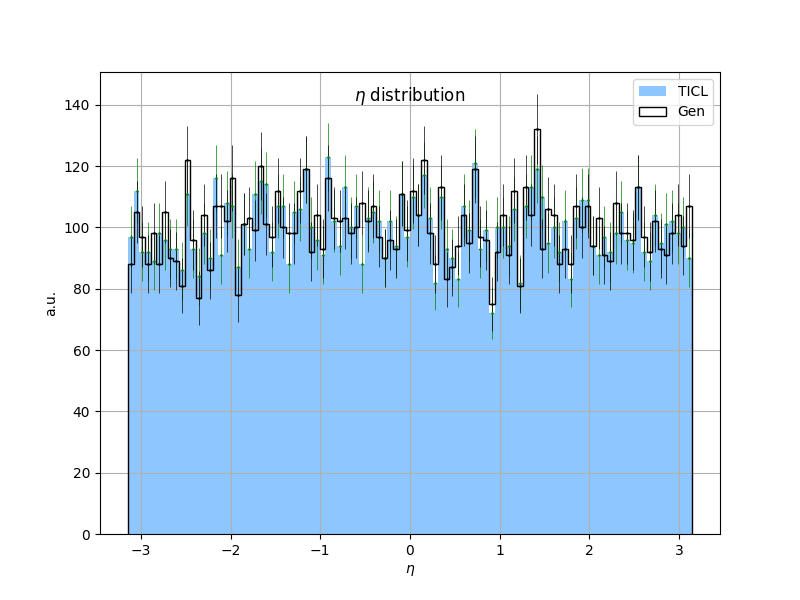

In [16]:
plt.figure(figsize=(8, 6))
n_tc, bins_tc, _ = plt.hist(phi_tc, bins=100,  alpha = 0.5, label= 'TICL', color = 'dodgerblue')
n_SC, bins_SC, _ =plt.hist(phi_SC, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"

bin_centers_tc = 0.5 * (bins_tc[:-1] + bins_tc[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_tc, n_tc, yerr=np.sqrt(n_tc), fmt='o', color='green', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

# n_after, bins_after, _ = plt.hist( - , bins=100, range=(-0.2,0.2), label = "After Clean", color= '' )
# plt.hist(eta_tc_OFF - eta_SC_OFF, bins=100, range=(-0.2,0.2), label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

plt.xlabel(r'$\eta$')
plt.ylabel('a.u.')
plt.title(r'$\eta$ distribution', x = 0.5, y = 0.92)
# plt.title(r'$\eta_{TC}-\eta_{SC}$ count', x = 0.27, y = 0.92)
plt.legend()
plt.grid()
plt.show()

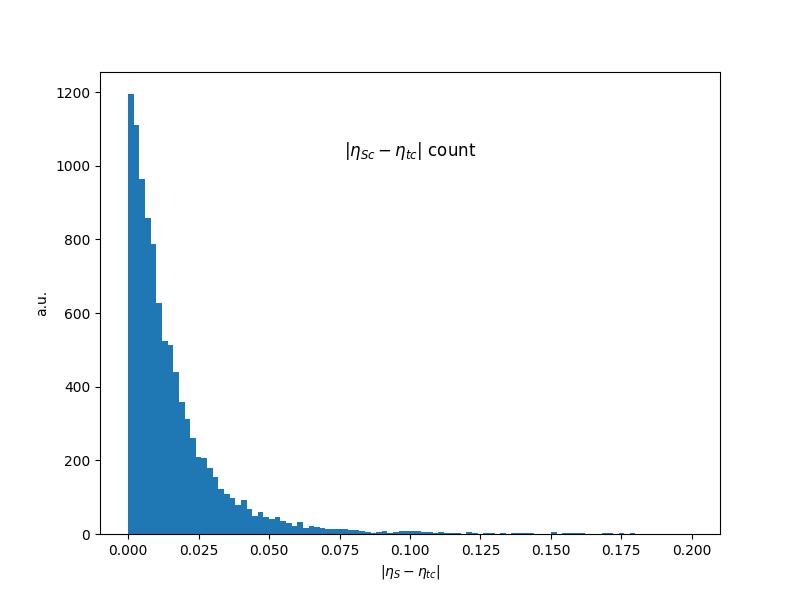

In [28]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(eta_tc - eta_SC), bins=100, range=(0,0.2))#, edgecolor='black')
plt.xlabel(r'|$\eta_{S}-\eta_{tc}$|')
plt.ylabel('a.u.')
plt.title(r'|$\eta_{Sc}-\eta_{tc}$| count', x = 0.5, y = 0.8)
plt.show()

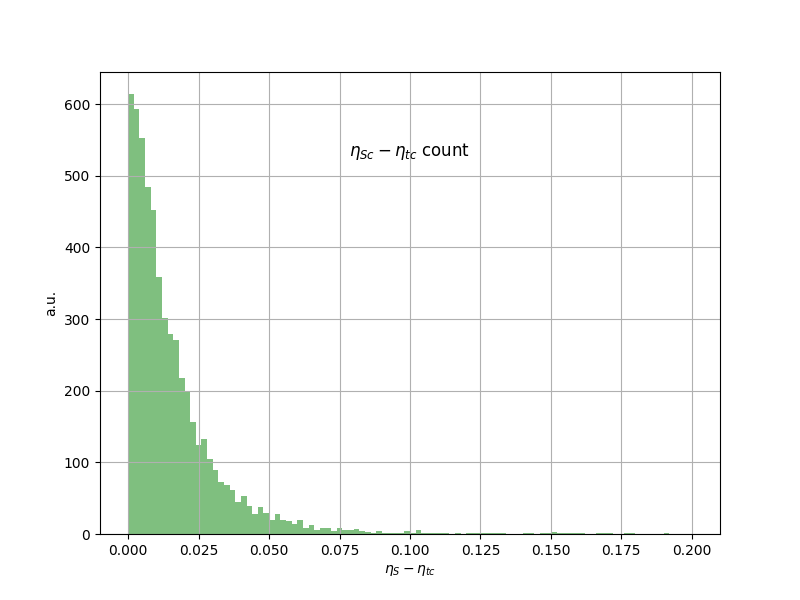

In [23]:
plt.figure(figsize=(8, 6))
plt.hist(eta_tc - eta_SC, bins=100, range=(0,0.2), color = 'green', alpha = 0.5)#, edgecolor='black')
plt.xlabel(r'$\eta_{S}-\eta_{tc}$')
plt.ylabel('a.u.')
plt.title(r'$\eta_{Sc}-\eta_{tc}$ count', x = 0.5, y = 0.8)
plt.grid()
plt.show()

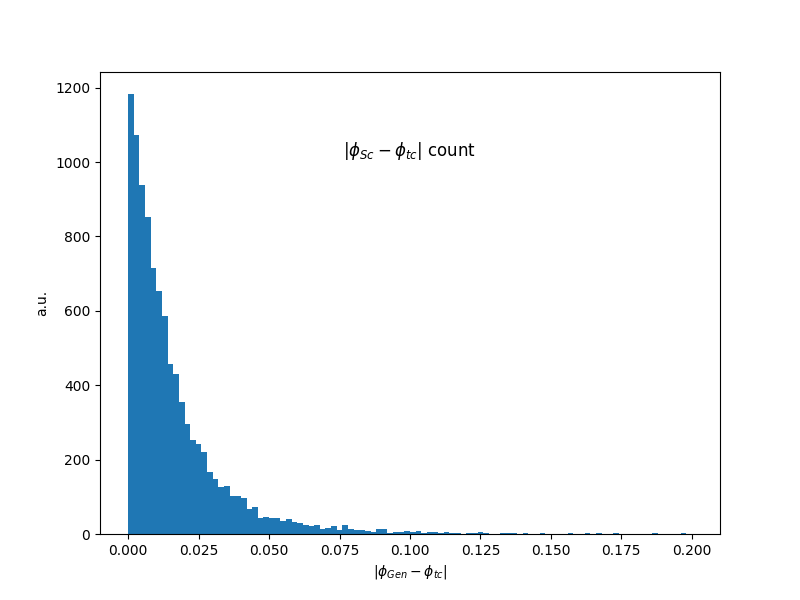

In [29]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(phi_tc - phi_SC), bins=100, range=(0,0.2))# , edgecolor='black') 
plt.xlabel(r'|$\phi_{Gen}-\phi_{tc}$|')
plt.ylabel('a.u.')
plt.title(r'|$\phi_{Sc}-\phi_{tc}$| count', x = 0.5, y = 0.8)
plt.show()

## Energy

In [6]:
N= 10001 #(<100)
non_empty_mask = ak.max(baryenergy_tc[:N], axis=1) > 0
Energy_SC = ak.drop_none(baryenergy_simSC[non_empty_mask])
Energy_tc = []

# # Weighted tracksters:
# for event, non_empty in enumerate(non_empty_mask):
#     if non_empty:
#         Energy_tc += [np.average(baryenergy_tc[evnt], weights = baryenergy_tc[evnt])]

# Highest energy tracksters:
mask = (baryenergy_tc[:N] == ak.max(baryenergy_tc[:N], axis=1)) & (ak.max(baryenergy_tc[:N], axis=1) != 0)
Energy_tc = ak.drop_none(ak.max(baryenergy_tc[:N], axis=1)[non_empty_mask])

Energy_tc = np.roll(Energy_tc, 1)

mask = (baryenergy_tc[:N] == ak.max(baryenergy_tc[:N], axis=1)) & (ak.max(baryenergy_tc[:N], axis=1) != 0)
Energy_tc = ak.flatten(baryenergy_tc[mask])

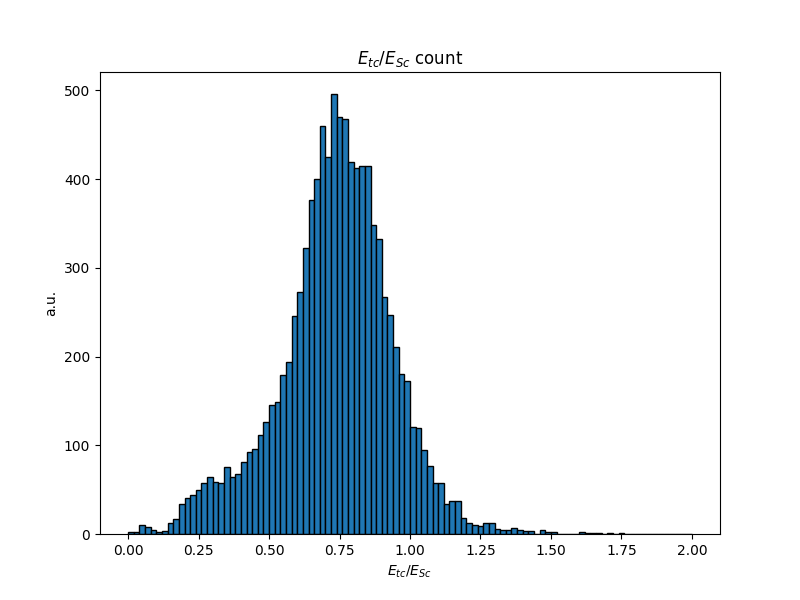

In [7]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(Energy_tc/Energy_SC), bins=100, edgecolor='black', range=(0,2))
plt.xlabel(r'$E_{tc}/E_{Sc}$')
plt.ylabel('a.u.')
plt.title(r'$E_{tc}/E_{Sc}$ count')
plt.show()

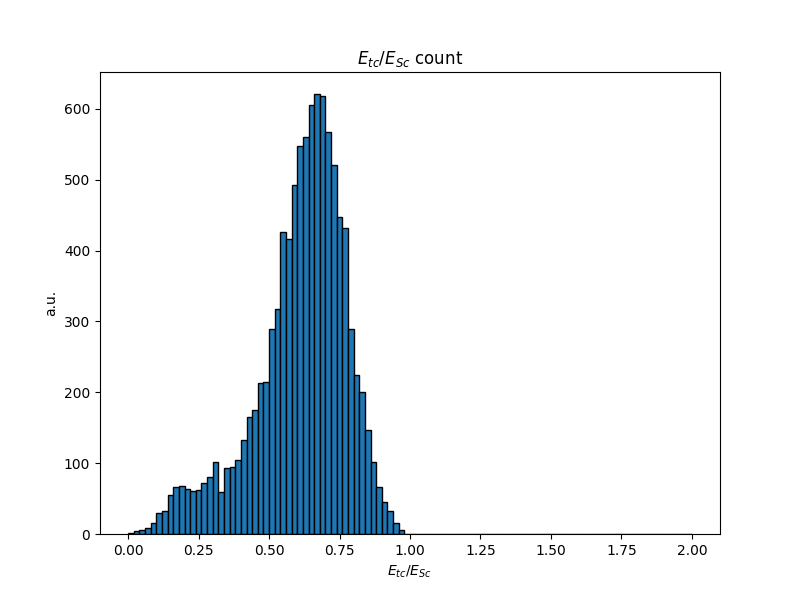

In [31]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(baryenergy_tc/baryenergy_simSC), bins=100, edgecolor='black', range=(0,2))
plt.xlabel(r'$E_{tc}/E_{Sc}$')
plt.ylabel('a.u.')
plt.title(r'$E_{tc}/E_{Sc}$ count')
plt.show()

## Plots

In [7]:
i = 4

IndexError: invalid index to scalar variable.

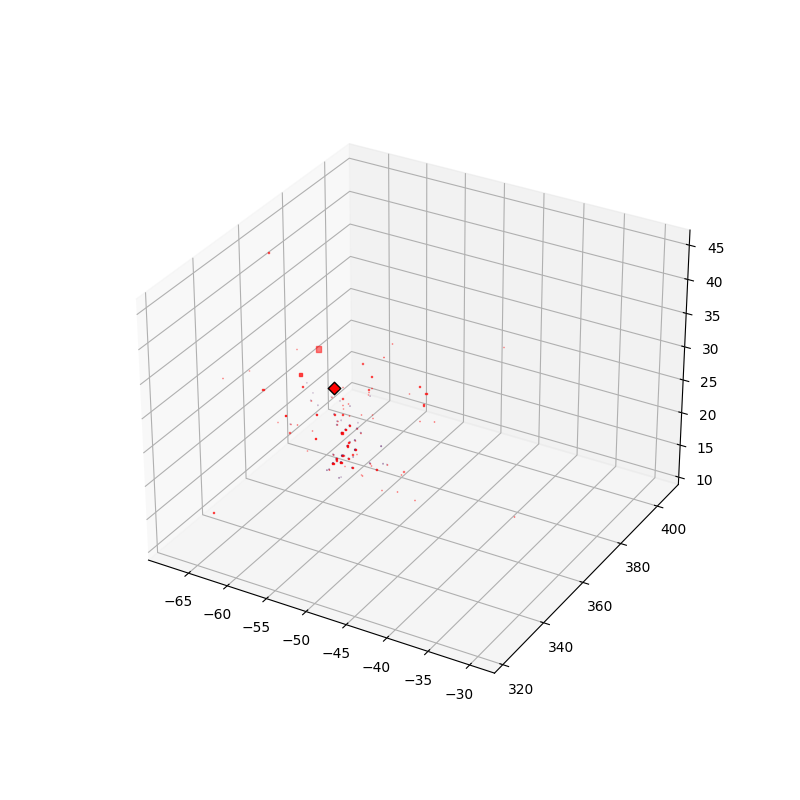

In [14]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')


color = 'red'
#Plotting SimTracksterSC
ax.scatter3D(x_simSC[i, 0], z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color, marker = 's')
ax.scatter3D(bary_x_simSC[i], bary_z_simSC[i], bary_y_simSC[i], color=color, edgecolor='black', s=baryenergy_simSC[i], marker='D', linewidths=1)

#Plotting Clue3DHigh
for trackster_ in range(len(energy_tc[i])):#
    color = cmap(trackster_ / len(energy_tc[i]))
    ax.scatter3D(x_tc[i, trackster_], z_tc[i, trackster_], y_tc[i, trackster_], s= energy_tc[i, trackster_], color=color)
    ax.scatter3D(bary_x_tc[i][trackster_], bary_z_tc[i][trackster_], bary_y_tc[i][trackster_], color=color, edgecolor='black', s=baryenergy_tc[i, trackster_], marker='D', linewidths=1)


ax.set_title('Reco Tracksters with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')

# ax.legend()
plt.show()

IndexError: invalid index to scalar variable.

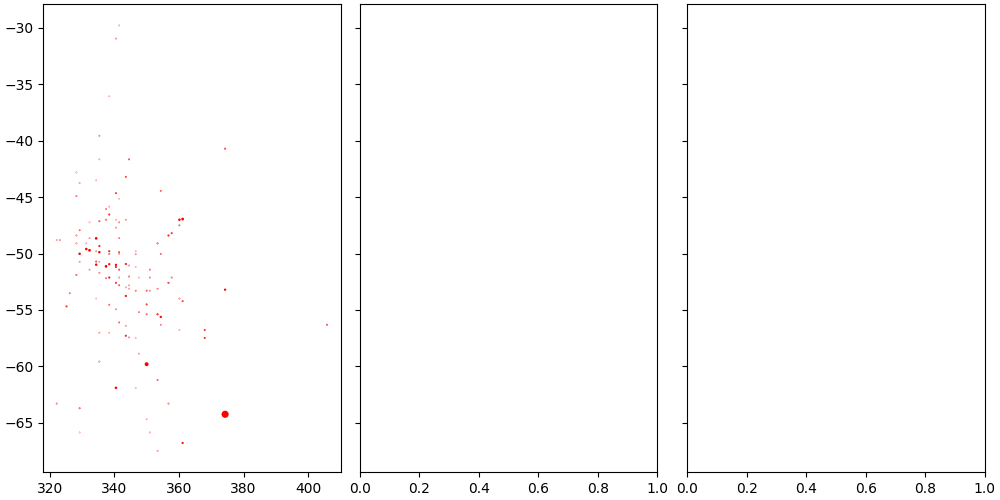

In [13]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, layout='constrained', sharey=True, figsize = (10,5))

color = 'red'
ax1.scatter(z_simSC[i, 0], x_simSC[i, 0], s=energy_simSC[i, 0], color=color)
ax1.scatter(bary_z_simSC[i][0], bary_x_simSC[i][0], color=color, edgecolor='black', s=baryenergy_simSC[i, 0], marker='D', linewidths=1)

for trackster_ in range(len(energy_c3Dh[i])): #
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax1.scatter(z_c3Dh[i, trackster_], x_c3Dh[i, trackster_], s=energy_c3Dh[i, trackster_], color=color)
    ax1.scatter(bary_z_c3Dh[i][trackster_], bary_x_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)

ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

color = 'red'
ax2.scatter(z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color)

for trackster_ in range(len(energy_c3Dh[i])): #
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax2.scatter(z_c3Dh[i, trackster_], y_c3Dh[i, trackster_], s=energy_c3Dh[i, trackster_], color=color)
    ax2.scatter(bary_z_c3Dh[i][trackster_], bary_y_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)

ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')


color = 'red'
ax3.scatter(x_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color)

for trackster_ in range(len(energy_c3Dh[i])): #
    color = cmap(trackster_ / len(energy_c3Dh[i]))
    ax3.scatter(x_c3Dh[i, trackster_], y_c3Dh[i, trackster_], s=energy_c3Dh[i, trackster_], color=color)
    ax3.scatter(bary_x_c3Dh[i][trackster_], bary_y_c3Dh[i][trackster_], color=color, edgecolor='black', s=baryenergy_c3Dh[i, trackster_], marker='D', linewidths=1)

    
ax3.set_xlabel('X Coordinate')
ax3.set_ylabel('Y Coordinate')


fig.suptitle('Rec hits with Barycenter', fontsize=16)

# Clean ON vs OFF

## Clean OFF Initialise

In [6]:
# TiclCandidate

coord_arr_tc_OFF = file_OFF["ticlDumper/trackstersTiclCandidate"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_tc_OFF = file_OFF["ticlDumper/trackstersTiclCandidate"].arrays(["vertices_energy" ], library= "ak")
barycenters_tc_OFF = file_OFF["ticlDumper/trackstersTiclCandidate"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")

# Hits
x_tc_OFF = coord_arr_tc_OFF["vertices_x"][:]
y_tc_OFF = coord_arr_tc_OFF["vertices_y"][:]
z_tc_OFF = coord_arr_tc_OFF["vertices_z"][:]

# Energy
energy_tc_OFF = energy_arr_tc_OFF["vertices_energy"][:] 
baryenergy_tc_OFF = file_OFF["ticlDumper/trackstersTiclCandidate/raw_energy"].arrays(library = "ak")["raw_energy"]

# Barycenter
bary_z_tc_OFF = barycenters_tc_OFF["barycenter_z"]
bary_x_tc_OFF = barycenters_tc_OFF["barycenter_x"]
bary_y_tc_OFF = barycenters_tc_OFF["barycenter_y"]

KeyInFileError: not found: 'trackstersTiclCandidate' (with any cycle number)

    Available keys: 'ticlCandidate;1', 'simTICLCandidate;1', 'candidates;1', 'simtrackstersSC;1', 'simtrackstersCP;1', 'tracks;1', 'clusters;2', 'clusters;1', 'ticlTracksterLinks;1', 'ticlTrackstersCLUE3DHigh;1', 'associations;1'...

in file histo_OFF.root

In [11]:
len(baryenergy_tc_OFF)

10000

In [12]:
#SimTracksterSC

coord_arr_simSC_OFF = file_OFF["ticlDumper/simtrackstersSC"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "ak")
energy_arr_simSC_OFF = file_OFF["ticlDumper/simtrackstersSC"].arrays(["vertices_energy" ], library= "ak")
barycenters_simSC_OFF = file_OFF["ticlDumper/simtrackstersSC"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "ak")
boundary_simSC_OFF = file_OFF["ticlDumper/simtrackstersSC"].arrays(["boundaryX", "boundaryY" , "boundaryZ", "boundaryEta", "boundaryPhi"], library= "ak")


# Hits
x_simSC_OFF = coord_arr_simSC_OFF["vertices_x"][:] 
y_simSC_OFF = coord_arr_simSC_OFF["vertices_y"][:] 
z_simSC_OFF = coord_arr_simSC_OFF["vertices_z"][:] 

# Energy
energy_simSC_OFF = energy_arr_simSC_OFF["vertices_energy"][:]
baryenergy_simSC_OFF = file_OFF["ticlDumper/simtrackstersSC/raw_energy"].arrays(library = "ak")["raw_energy"]

# Barycenter
bary_z_simSC_OFF = barycenters_simSC_OFF["barycenter_z"]
bary_x_simSC_OFF = barycenters_simSC_OFF["barycenter_x"]
bary_y_simSC_OFF = barycenters_simSC_OFF["barycenter_y"]

# First Hit
boundaryX_simSC_OFF = boundary_simSC_OFF["boundaryX"]
boundaryY_simSC_OFF = boundary_simSC_OFF["boundaryY"]
boundaryZ_simSC_OFF = boundary_simSC_OFF["boundaryZ"]
boundaryEta_simSC_OFF = boundary_simSC_OFF["boundaryEta"]
boundaryPhi_simSC_OFF = boundary_simSC_OFF["boundaryPhi"]

In [13]:
# Scaling  and Masking(if Required)
N = 10001
non_empty_mask_OFF = ak.max(baryenergy_tc_OFF[:N], axis=1) > 0
mask_OFF = (baryenergy_tc_OFF[:N] == ak.max(baryenergy_tc_OFF[:N], axis=1)) & (ak.max(baryenergy_tc_OFF[:N], axis=1) != 0)

bary_x_tc_OFF = ak.flatten(bary_x_tc_OFF[mask_OFF])
bary_y_tc_OFF = ak.flatten(bary_y_tc_OFF[mask_OFF])
bary_z_tc_OFF = ak.flatten(bary_z_tc_OFF[mask_OFF])
baryenergy_tc_OFF = ak.flatten(baryenergy_tc_OFF[mask_OFF])

bary_x_simSC_OFF = ak.flatten(bary_x_simSC_OFF[non_empty_mask_OFF])
bary_y_simSC_OFF = ak.flatten(bary_y_simSC_OFF[non_empty_mask_OFF])
bary_z_simSC_OFF = ak.flatten(bary_z_simSC_OFF[non_empty_mask_OFF])
baryenergy_simSC_OFF = ak.flatten(baryenergy_simSC_OFF[non_empty_mask_OFF])

boundaryX_simSC_OFF = ak.flatten(boundaryX_simSC_OFF[non_empty_mask_OFF])
boundaryY_simSC_OFF = ak.flatten(boundaryY_simSC_OFF[non_empty_mask_OFF])
boundaryZ_simSC_OFF = ak.flatten(boundaryZ_simSC_OFF[non_empty_mask_OFF])
boundaryEta_simSC_OFF = ak.flatten(boundaryEta_simSC_OFF[non_empty_mask_OFF])
boundaryPhi_simSC_OFF = ak.flatten(boundaryPhi_simSC_OFF[non_empty_mask_OFF])

## Sc_OFF vs Sc

### Plots

In [136]:
# Scaling (if Required)
k = 1/10
energy_simSC_OFF = energy_simSC_OFF*k
baryenergy_simSC_OFF = baryenergy_simSC_OFF*k

energy_simSC = energy_simSC*k
baryenergy_simSC = baryenergy_simSC*k

In [10]:
sum(baryenergy_simSC_OFF)- sum(baryenergy_simSC)

<Array [0] type='1 * float32'>

In [11]:
i =7556 #19 

In [134]:
plt.close()

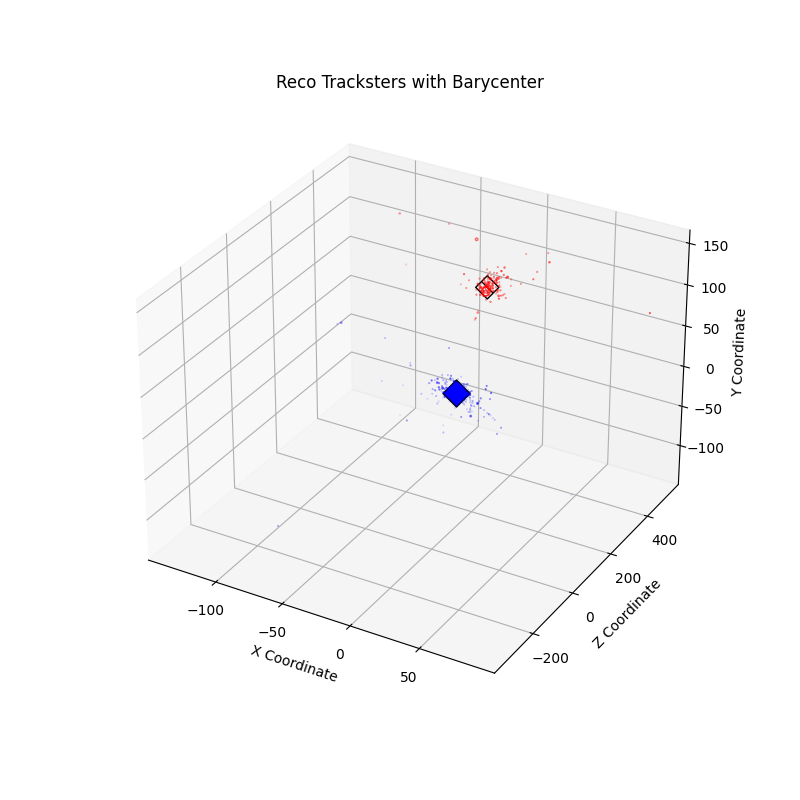

In [14]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')

#Plotting SimTracksterSC
color = 'blue'
ax.scatter3D(x_simSC[i, 0], z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color, marker = 'o')
ax.scatter3D(bary_x_simSC[i], bary_z_simSC[i], bary_y_simSC[i], color=color, edgecolor='black', s=baryenergy_simSC[i], marker='D', linewidths=1)

#Plotting SimTracksterSC_OFF
color = 'red'
ax.scatter3D(x_simSC_OFF[i, 0], z_simSC_OFF[i, 0], y_simSC_OFF[i, 0], s= energy_simSC_OFF[i, 0], color=color, marker = 'o',  facecolor = 'none', hatch= '\\\\')
ax.scatter3D(bary_x_simSC_OFF[i], bary_z_simSC_OFF[i], bary_y_simSC_OFF[i], color=color, edgecolor='black', s=baryenergy_simSC_OFF[i], marker='D', linewidths=1,  facecolor = 'none', hatch= '\\\\')

# #Plotting Clue3DHigh
# for trackster_ in range(len(energy_tc[i])):#
#     color = cmap(trackster_ / len(energy_tc[i]))
#     ax.scatter3D(x_tc[i, trackster_], z_tc[i, trackster_], y_tc[i, trackster_], s= energy_tc[i, trackster_], color=color)
#     ax.scatter3D(bary_x_tc[i][trackster_], bary_z_tc[i][trackster_], bary_y_tc[i][trackster_], color=color, edgecolor='black', s=baryenergy_tc[i, trackster_], marker='D', linewidths=1)


ax.set_title('Reco Tracksters with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')

# ax.legend()
plt.show()

In [43]:
energy_simSC_OFF[5:10]

<Array [[[426, 278, ..., 0.48, 0.253]], ...] type='5 * var * var * float32'>

In [44]:
energy_simSC[5:10]

<Array [[[426, 278, ..., 0.48, 0.253]], ...] type='5 * var * var * float32'>

Text(0.5, 0.98, 'Rec hits with Barycenter')

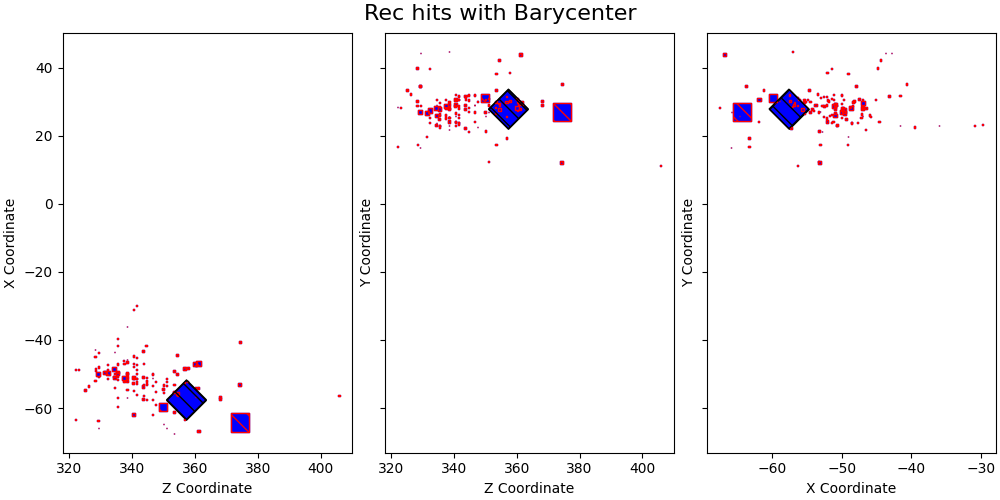

In [41]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, layout='constrained', sharey=True, figsize = (10,5))

#Plotting SimTracksterSC
color = 'blue'
ax1.scatter(z_simSC[i, 0], x_simSC[i, 0], s=energy_simSC[i, 0], color=color, marker = 's')
ax1.scatter(bary_z_simSC[i], bary_x_simSC[i], color=color, edgecolor='black', s=baryenergy_simSC[i], marker='D', linewidths=1)

#Plotting SimTracksterSC_OFF
color = 'red'
ax1.scatter(z_simSC_OFF[i, 0], x_simSC_OFF[i, 0], s=energy_simSC_OFF[i, 0], color=color, marker = 's', facecolor = 'none', hatch= '\\\\')
ax1.scatter(bary_z_simSC_OFF[i], bary_x_simSC_OFF[i], color=color, edgecolor='black', s=baryenergy_simSC_OFF[i], marker='D', linewidths=1,facecolor = 'none', hatch= '\\\\')

ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

#Plotting SimTracksterSC
color = 'blue'
ax2.scatter(z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color, marker = 's')
ax2.scatter(bary_z_simSC[i], bary_y_simSC[i], color=color, edgecolor='black', s=baryenergy_simSC[i], marker='D', linewidths=1)

#Plotting SimTracksterSC_OFF
color = 'red'
ax2.scatter(z_simSC_OFF[i, 0], y_simSC_OFF[i, 0], s=energy_simSC_OFF[i, 0], color=color, marker = 's',facecolor = 'none', hatch= '\\\\')
ax2.scatter(bary_z_simSC_OFF[i], bary_y_simSC_OFF[i], color=color, edgecolor='black', s=baryenergy_simSC_OFF[i], marker='D', linewidths=1, facecolor = 'none', hatch= '\\\\')

ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')


#Plotting SimTracksterSC
color = 'blue'
ax3.scatter(x_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color, marker = 's')
ax3.scatter(bary_x_simSC[i], bary_y_simSC[i], color=color, edgecolor='black', s=baryenergy_simSC[i], marker='D', linewidths=1)

#Plotting SimTracksterSC_OFF
color = 'red'
ax3.scatter(x_simSC_OFF[i, 0], y_simSC_OFF[i, 0], s=energy_simSC_OFF[i, 0], color=color, marker = 's',facecolor = 'none', hatch= '\\\\')
ax3.scatter(bary_x_simSC_OFF[i], bary_y_simSC_OFF[i], color=color, edgecolor='black', s=baryenergy_simSC_OFF[i], marker='D', linewidths=1,facecolor = 'none', hatch= '\\\\')

    
ax3.set_xlabel('X Coordinate')
ax3.set_ylabel('Y Coordinate')


fig.suptitle('Rec hits with Barycenter', fontsize=16)

### xyz

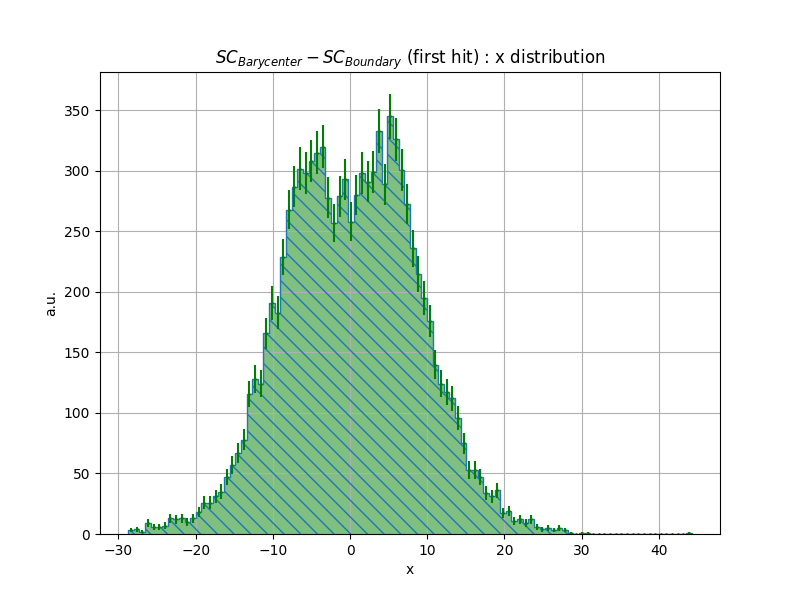

In [14]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_x_simSC-boundaryX_simSC, bins=100, color= 'green', alpha = 0.5 )
n_before, bins_before, _ = plt.hist(bary_x_simSC_OFF-boundaryX_simSC_OFF, bins=100,  facecolor = 'none', hatch= '\\\\' ,histtype='step' )


bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
# bin_centers_before = 0.5 * (bins_before[:-1] + bins_before[1:])

plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)
# plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)


plt.xlabel(r'x')
plt.ylabel('a.u.')
plt.title(r'$SC_{Barycenter} - SC_{Boundary}$ (first hit) : x distribution') #, x = 0.3, y = 0.92
# plt.legend()
plt.grid()
plt.show()

In [57]:
sum(abs(bary_x_simSC_OFF-boundaryX_simSC_OFF))-sum(abs(bary_x_simSC-boundaryX_simSC))

2.115438461303711

In [ ]:
69453.62269667163

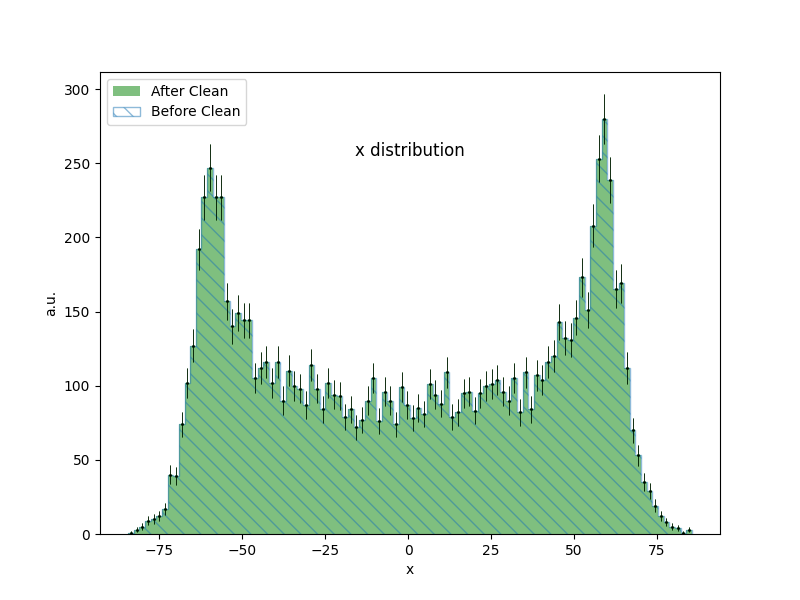

In [15]:
plt.figure(figsize=(8, 6))
n_SC, bins_SC, _ = plt.hist(bary_x_tc, bins=100,  alpha = 0.5, label= 'After Clean', color = 'green')
n_SC_OFF, bins_SC_OFF, _ = plt.hist(bary_x_tc_OFF, bins=100,  alpha = 0.5, label= 'Before Clean',  facecolor = 'none', hatch= '\\\\' ,histtype='step')

bin_centers_SC_OFF = 0.5 * (bins_SC_OFF[:-1] + bins_SC_OFF[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_SC_OFF, n_SC_OFF, yerr=np.sqrt(n_SC_OFF), fmt='o', color='green', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

plt.xlabel(r'x')
plt.ylabel('a.u.')
plt.title('x distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()

In [62]:
plt.close() x_simSC_OFF

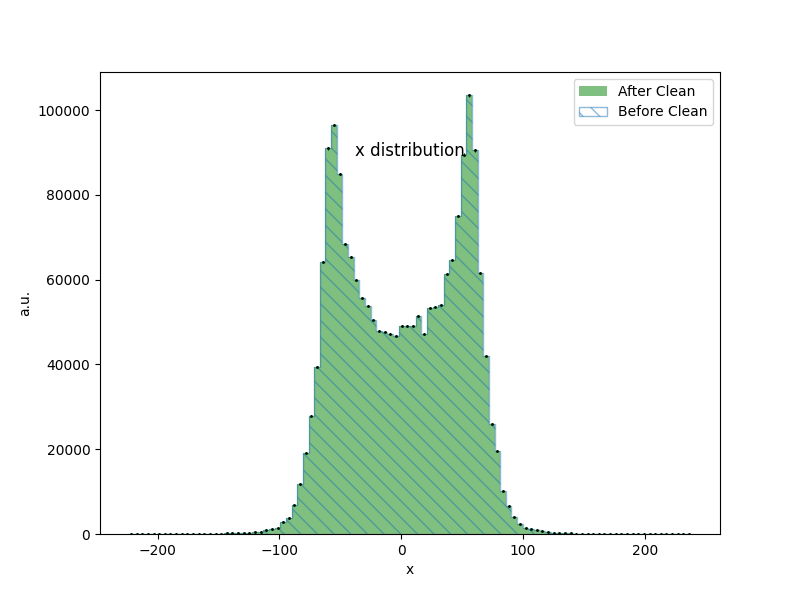

In [78]:
plt.figure(figsize=(8, 6))
n_SC, bins_SC, _ = plt.hist(ak.flatten(ak.flatten(x_simSC)), bins=100,  alpha = 0.5, label= 'After Clean', color = 'green')
n_SC_OFF, bins_SC_OFF, _ = plt.hist(ak.flatten(ak.flatten(x_simSC_OFF)), bins=100,  alpha = 0.5, label= 'Before Clean',  facecolor = 'none', hatch= '\\\\' ,histtype='step')

bin_centers_SC_OFF = 0.5 * (bins_SC_OFF[:-1] + bins_SC_OFF[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_SC_OFF, n_SC_OFF, yerr=np.sqrt(n_SC_OFF), fmt='o', color='green', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

plt.xlabel(r'x')
plt.ylabel('a.u.')
plt.title('x distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()

In [80]:
baryenergy_simSC_OFF ; baryenergy_simSC

<Array [529, 1.32e+03, 1.29e+03, ..., 915, 1.64e+03, 509] type='9967 * float32'>

In [83]:
mask = ~ak.any(baryenergy_simSC_OFF[:, None] == baryenergy_simSC, axis=1)
result = baryenergy_simSC_OFF[mask]

print("Elements in A but not in B:", result)

Elements in A but not in B: [1.45e+03]


In [95]:
index = ak.where(baryenergy_simSC_OFF == [1450])

In [99]:
len(baryenergy_simSC_OFF)

9968

In [16]:
# index = ak.where(ak.to_numpy(np.isclose(baryenergy_simSC_OFF, 1450)))[0]
# tolerance = 1e-3  # Adjust the tolerance as needed
# index = ak.where(ak.any(abs(baryenergy_simSC_OFF - 1450) < tolerance, axis=0))[0]

In [106]:
baryenergy_simSC_OFF

<Array [1.29e+03, 529, 1.36e+03, ..., 915, 1.64e+03, 509] type='9968 * float32'>

In [124]:
baryenergy_simSC_OFF[7556]
# np.where(mask==True)  (<Array [7556] type='1 * int64'>,)

1448.6187

In [123]:
sum(baryenergy_simSC_OFF) - sum(baryenergy_simSC)

1448.61865234375

In [104]:
index

<Array [] type='0 * int64'>

## TC_OFF vs TC

### xyz

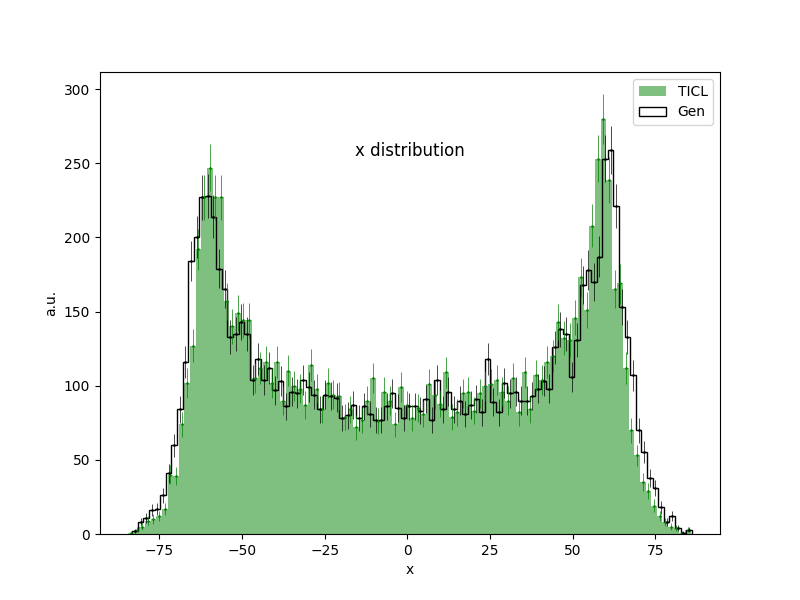

In [78]:
plt.figure(figsize=(8, 6))
n_tc, bins_tc, _ = plt.hist(bary_x_tc_OFF, bins=100,  alpha = 0.5, label= 'TICL', color = 'green') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
n_SC, bins_SC, _ =plt.hist(bary_x_simSC_OFF, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"

bin_centers_tc = 0.5 * (bins_tc[:-1] + bins_tc[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_tc, n_tc, yerr=np.sqrt(n_tc), fmt='o', color='green', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

plt.xlabel(r'x')
plt.ylabel('a.u.')
plt.title('x distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()

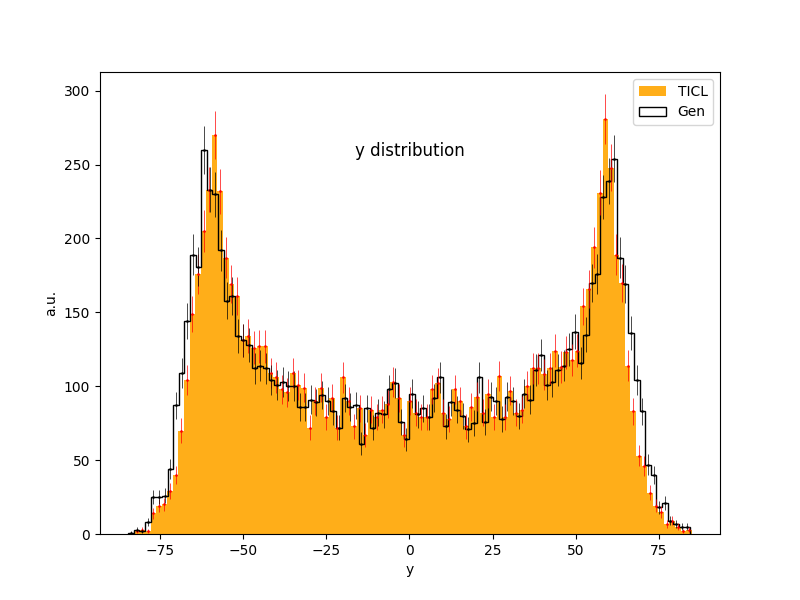

In [50]:
plt.figure(figsize=(8, 6))
n_tc, bins_tc, _ = plt.hist(bary_y_tc_OFF, bins=100,  alpha = 0.9, label= 'TICL', color = 'orange') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
n_SC, bins_SC, _ =plt.hist(bary_y_simSC_OFF, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"

bin_centers_tc = 0.5 * (bins_tc[:-1] + bins_tc[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_tc, n_tc, yerr=np.sqrt(n_tc), fmt='o', color='red', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

plt.xlabel(r'y')
plt.ylabel('a.u.')
plt.title('y distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()

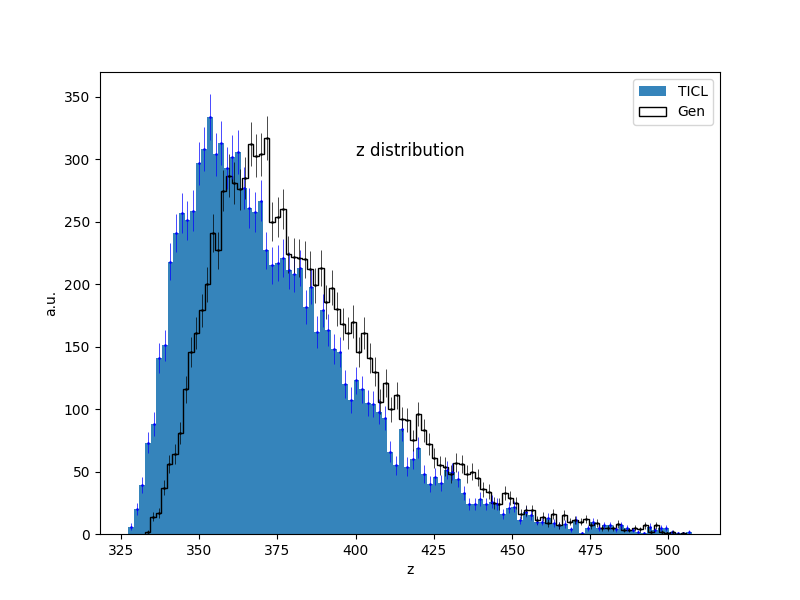

In [51]:
plt.figure(figsize=(8, 6))
n_tc, bins_tc, _ = plt.hist(bary_z_tc_OFF, bins=100,  alpha = 0.9, label= 'TICL') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
n_SC, bins_SC, _ =plt.hist(bary_z_simSC_OFF, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"

bin_centers_tc = 0.5 * (bins_tc[:-1] + bins_tc[1:])
bin_centers_SC = 0.5 * (bins_SC[:-1] + bins_SC[1:])

plt.errorbar(bin_centers_tc, n_tc, yerr=np.sqrt(n_tc), fmt='o', color='blue', alpha=1, ms = 0.9, linewidth= 0.5)
plt.errorbar(bin_centers_SC, n_SC, yerr=np.sqrt(n_SC), fmt='o', color='black', alpha=1, ms = 0.9, linewidth= 0.5)

plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.title('z distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()

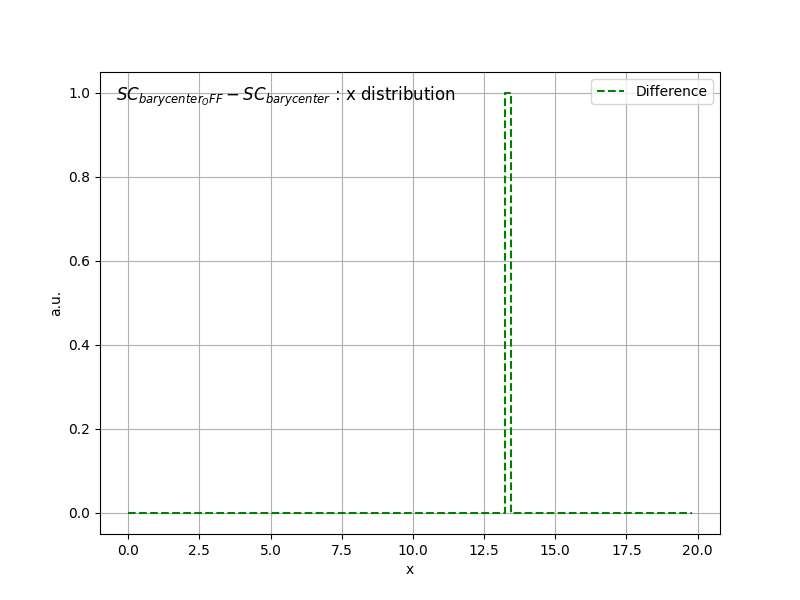

In [132]:
# plt.figure(figsize=(8, 6))
# n_after, bins_after, _ = plt.hist(bary_x_tc-bary_x_simSC, bins=100, label = "After Clean", color= 'green', alpha = 0.5 )
# plt.hist(bary_x_tc_OFF-bary_x_simSC_OFF, bins=100, label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

# bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
# plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)

bins = np.linspace(0, 20, 100) 
hist, edges = np.histogram(bary_x_simSC, bins=bins)
hist_OFF, edges_OFF = np.histogram(bary_x_simSC_OFF, bins=bins)

# Compute the difference
hist_diff = hist_OFF - hist

# Plot the histograms
plt.figure(figsize=(8, 6))
plt.step(bins[:-1], hist_diff, where="mid", label="Difference", linestyle='--', color='green')




plt.xlabel(r'x')
plt.ylabel('a.u.')
plt.title(r'$SC_{barycenter_{OFF}} - SC_{barycenter}$ : x distribution', x = 0.3, y = 0.92)
plt.legend()
plt.grid()
plt.show()

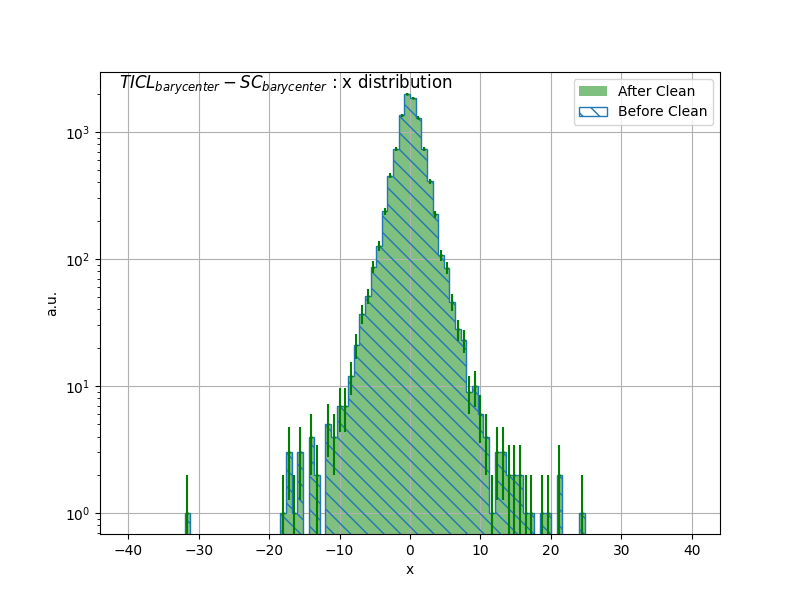

In [15]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_x_tc-bary_x_simSC, bins=100, label = "After Clean", color= 'green', alpha = 0.5 , range = (-40,40))
plt.hist(bary_x_tc_OFF-bary_x_simSC_OFF, bins=100, label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step', range = (-40,40))

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)

plt.xlabel(r'x')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$TICL_{barycenter} - SC_{barycenter}$ : x distribution', x = 0.3, y = 0.945)
plt.legend()
plt.grid()
plt.show()

In [21]:
plt.close()

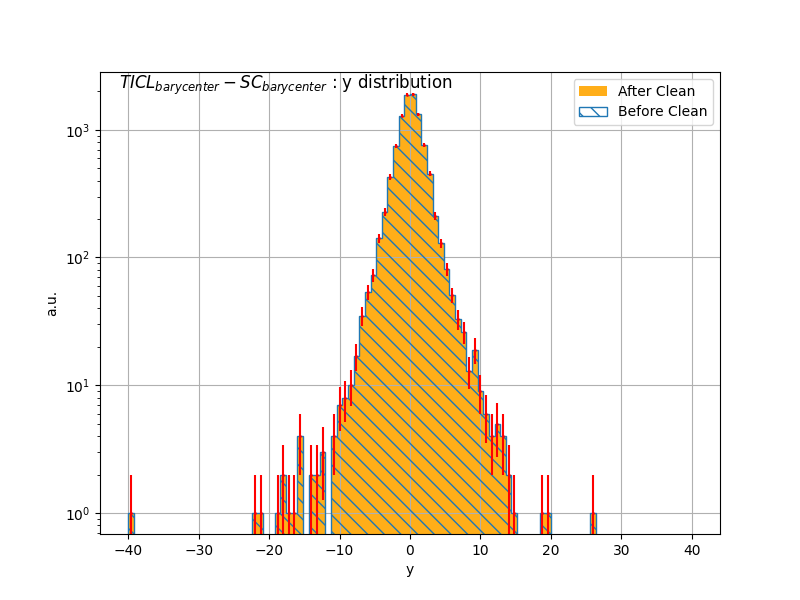

In [13]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_y_tc-bary_y_simSC, bins=100, label = "After Clean", color= 'orange', alpha = 0.9, range = (-40,40) )
plt.hist(bary_y_tc_OFF-bary_y_simSC_OFF, bins=100, label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step', range = (-40,40))

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='red', alpha=1, ms = 0.9)

plt.xlabel(r'y')
plt.ylabel('a.u.')
plt.title(r'$TICL_{barycenter} - SC_{barycenter}$ : y distribution', x = 0.3, y = 0.945)
plt.legend()
plt.grid()
plt.yscale('log')
plt.show()

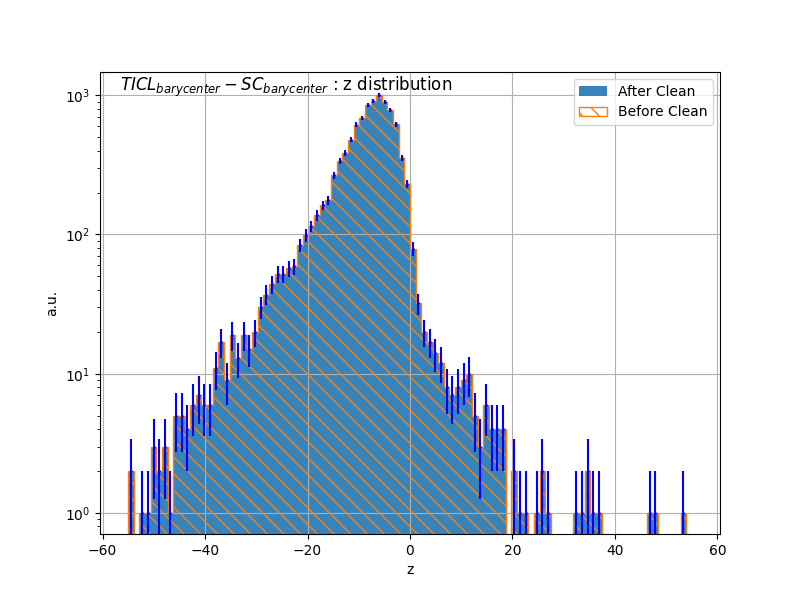

In [20]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_z_tc-bary_z_simSC, bins=100, label = "After Clean", alpha = 0.9 , range = (-55,55))#, color= 'green'
plt.hist(bary_z_tc_OFF-bary_z_simSC_OFF, bins=100, label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step', range = (-55,55))

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='blue', alpha=1, ms = 0.9)

plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.yscale('log')
plt.title(r'$TICL_{barycenter} - SC_{barycenter}$ : z distribution', x = 0.3, y = 0.94)
plt.legend()
plt.grid()
plt.show()

In [90]:
plt.close()

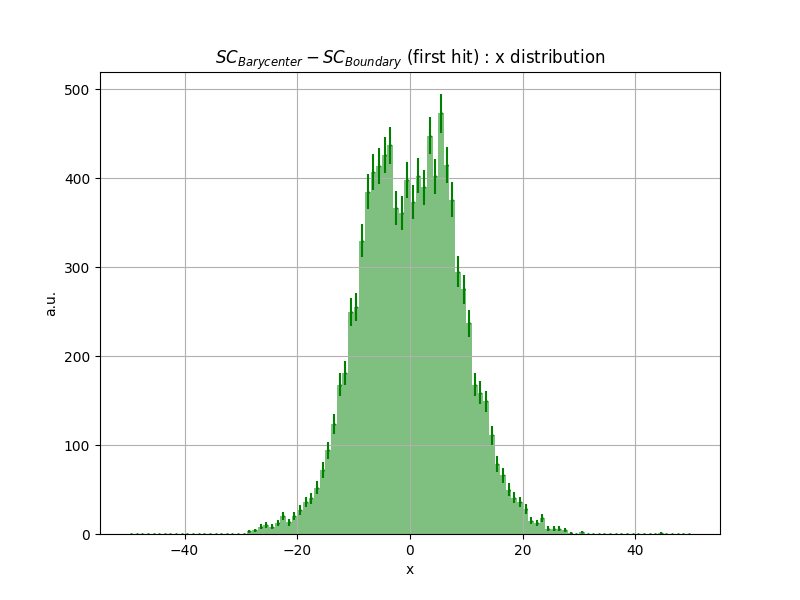

In [24]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_x_simSC-boundaryX_simSC, bins=100, color= 'green', alpha = 0.5 , range= (-50, 50))

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)

plt.xlabel(r'x')
plt.ylabel('a.u.')
# plt.yscale('log')
plt.title(r'$SC_{Barycenter} - SC_{Boundary}$ (first hit) : x distribution') #, x = 0.3, y = 0.92
# plt.legend()
plt.grid()
plt.show()

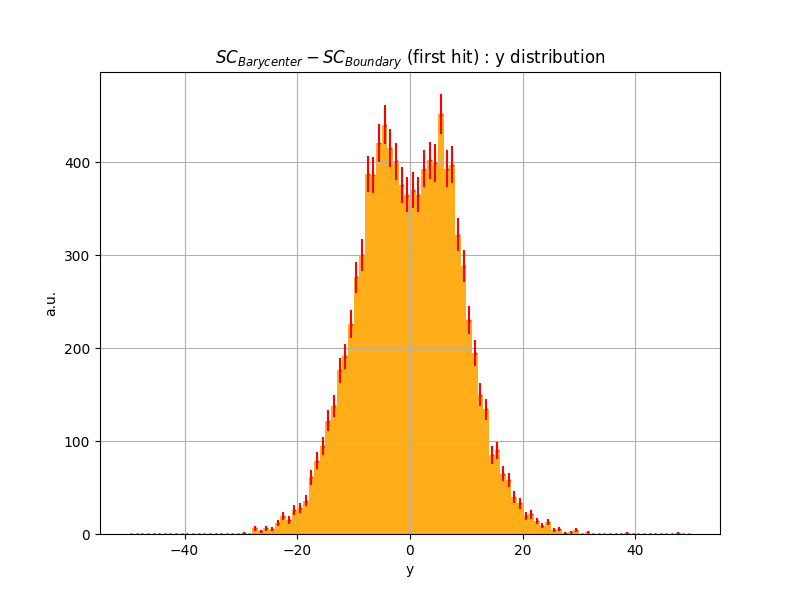

In [38]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_y_simSC-boundaryY_simSC, bins=100,  color= 'orange', alpha = 0.9 , range= (-50, 50))

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='red', alpha=1, ms = 0.9)

plt.xlabel(r'y')
plt.ylabel('a.u.')
plt.title(r'$SC_{Barycenter} - SC_{Boundary}$ (first hit) : y distribution') #, x = 0.3, y = 0.92
plt.grid()
plt.show()

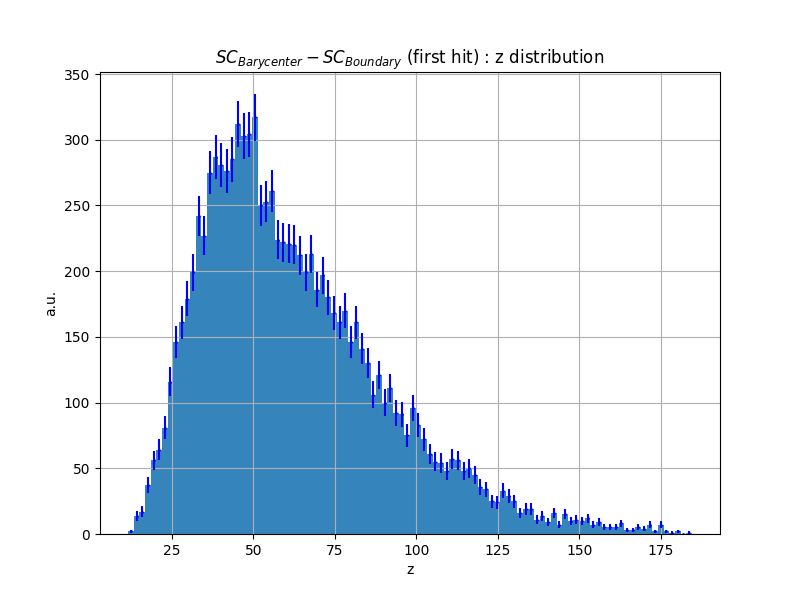

In [125]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(bary_z_simSC-boundaryZ_simSC, bins=100,  alpha = 0.9 )

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='blue', alpha=1, ms = 0.9)

plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.title(r'$SC_{Barycenter} - SC_{Boundary}$ (first hit) : z distribution') #, x = 0.3, y = 0.92
plt.grid()
plt.show()

In [33]:
plt.close()

### angles

In [63]:
N= 10001 #(<100)
eta_SC_OFF = []          ;    phi_SC_OFF = []
eta_tc_OFF = []        ;    phi_tc_OFF = []

eta_SC_OFF = eta(bary_x_simSC_OFF[:N], bary_y_simSC_OFF[:N], bary_z_simSC_OFF[:N])
phi_SC_OFF = phi(bary_x_simSC_OFF[:N], bary_y_simSC_OFF[:N])

eta_tc_OFF = eta(bary_x_tc_OFF[:N], bary_y_tc_OFF[:N], bary_z_tc_OFF[:N])
phi_tc_OFF = phi(bary_x_tc_OFF[:N], bary_y_tc_OFF[:N])


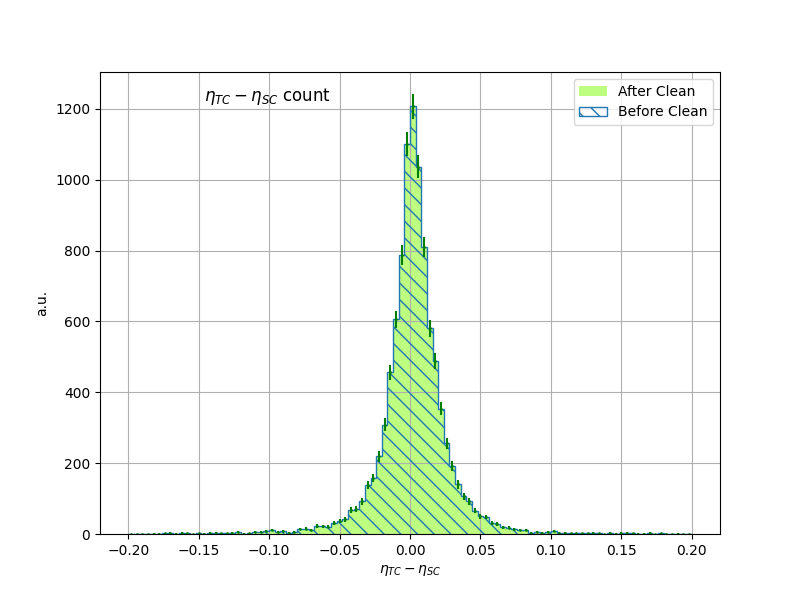

In [119]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(eta_tc - eta_SC, bins=100, range=(-0.2,0.2), label = "After Clean", color= 'lawngreen', alpha = 0.5 )
plt.hist(eta_tc_OFF - eta_SC_OFF, bins=100, range=(-0.2,0.2), label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)

plt.xlabel(r'$\eta_{TC}-\eta_{SC}$')
plt.ylabel('a.u.')
plt.title(r'$\eta_{TC}-\eta_{SC}$ count', x = 0.27, y = 0.92)
plt.legend()
plt.grid()
plt.show()

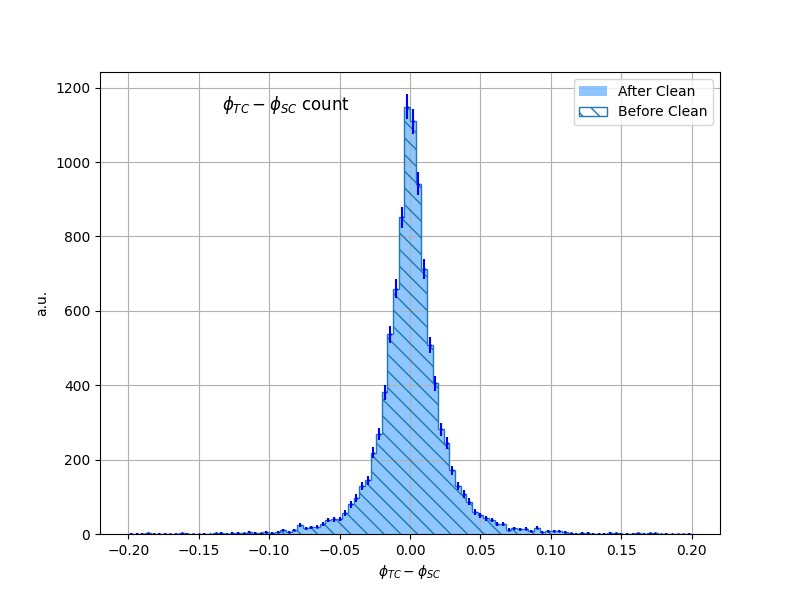

In [115]:
plt.figure(figsize=(8, 6)) #
n_after, bins_after, _ = plt.hist(phi_diff(phi_tc, phi_SC, 0), bins=100, range=(-0.2,0.2) ,  label = "After Clean", color= 'dodgerblue', alpha = 0.5 ) 
plt.hist(phi_diff(phi_tc_OFF, phi_SC_OFF, 0), bins=100, range=(-0.2,0.2), label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='blue', alpha=1, ms = 0.9)

plt.xlabel(r'$\phi_{TC}-\phi_{SC}$')
plt.ylabel('a.u.')
plt.title(r'$\phi_{TC}-\phi_{SC}$ count', x = 0.3, y = 0.9)
plt.legend()
plt.grid()
plt.show()

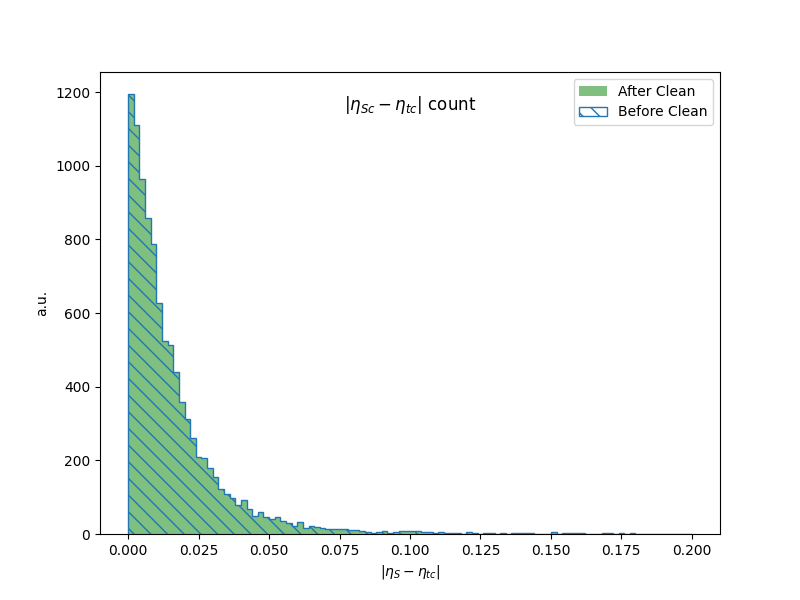

In [75]:
plt.figure(figsize=(8, 6))
plt.hist(np.abs(eta_tc - eta_SC), bins=100, range=(0,0.2), label = "After Clean", color= 'green', alpha = 0.5 )
plt.hist(np.abs(eta_tc_OFF - eta_SC_OFF), bins=100, range=(0,0.2), label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')
plt.xlabel(r'|$\eta_{S}-\eta_{tc}$|')
plt.ylabel('a.u.')
plt.title(r'|$\eta_{Sc}-\eta_{tc}$| count', x = 0.5, y = 0.9)
plt.legend()
plt.show()

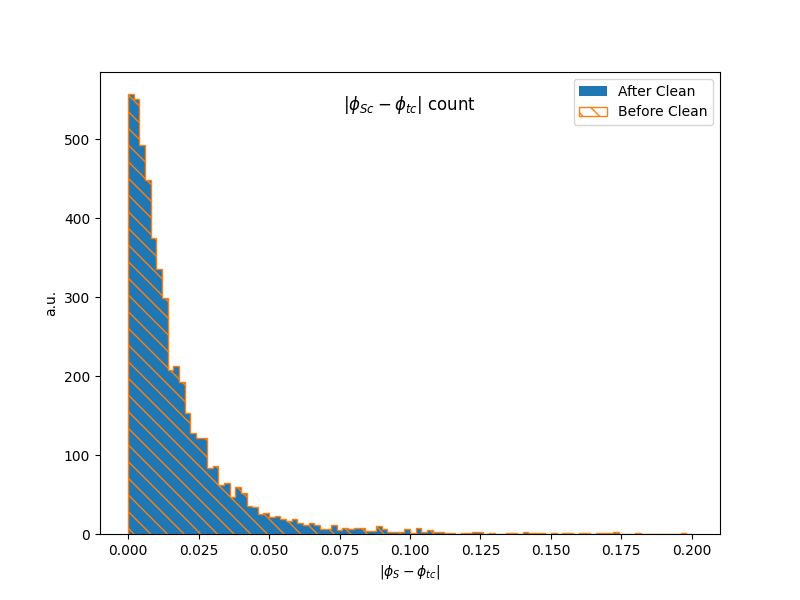

In [100]:
plt.figure(figsize=(8, 6))
plt.hist(phi_diff(phi_tc, phi_SC), bins=100, range=(0,0.2), label = "After Clean")#, color= 'blue', alpha = 0.9 ) 
plt.hist(phi_diff(phi_tc_OFF, phi_SC_OFF), bins=100, range=(0,0.2), label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')
plt.xlabel(r'|$\phi_{tc}-\phi_{SC}$|')
plt.ylabel('a.u.')
plt.title(r'|$\phi_{tc}-\phi_{SC}$| count', x = 0.5, y = 0.9)
plt.legend()
plt.show()

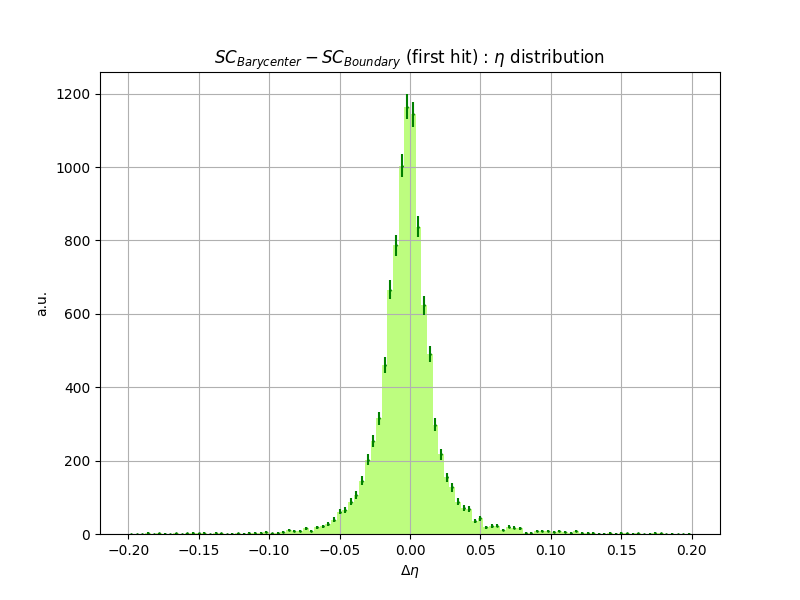

In [128]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(eta_SC-boundaryEta_simSC, bins=100,  color= 'lawngreen', alpha = 0.5, range = (-0.2, 0.2) )

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='green', alpha=1, ms = 0.9)
# plt.yscale('log')

plt.xlabel(r'$\Delta \eta$')
plt.ylabel('a.u.')
plt.title(r'$SC_{Barycenter} - SC_{Boundary}$ (first hit) : $\eta$ distribution') #, x = 0.3, y = 0.92
plt.grid()
plt.show()

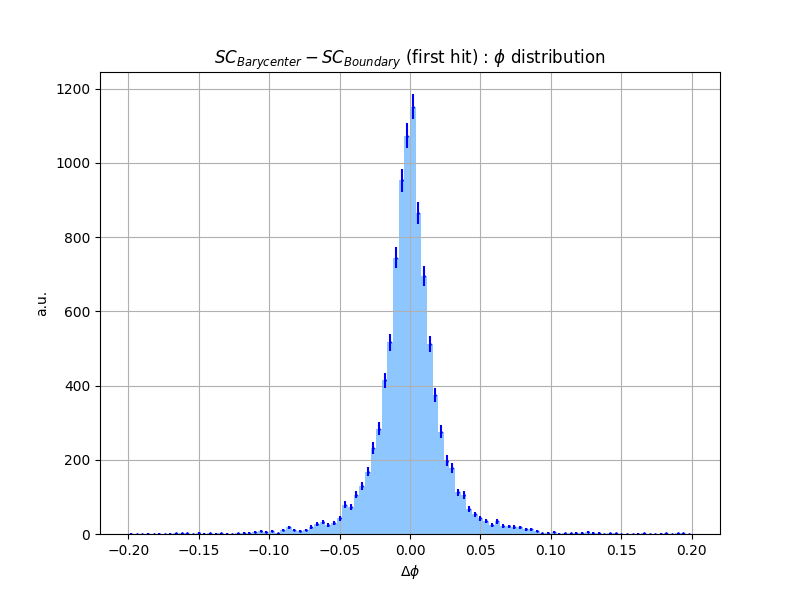

In [131]:
plt.figure(figsize=(8, 6)) #phi_diff(phi_SC, boundaryEta_simSC, 0)
n_after, bins_after, _ = plt.hist(phi_diff(phi_SC , boundaryPhi_simSC,0), bins=100,  color= 'dodgerblue', alpha = 0.5, range = (-0.2, 0.2)  )

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='blue', alpha=1, ms = 0.9)

plt.xlabel(r'$\Delta \phi$')
plt.ylabel('a.u.')
plt.title(r'$SC_{Barycenter} - SC_{Boundary}$ (first hit) : $\phi$ distribution') #, x = 0.3, y = 0.92
plt.grid()
plt.show()

In [132]:
plt.close()

### Energy

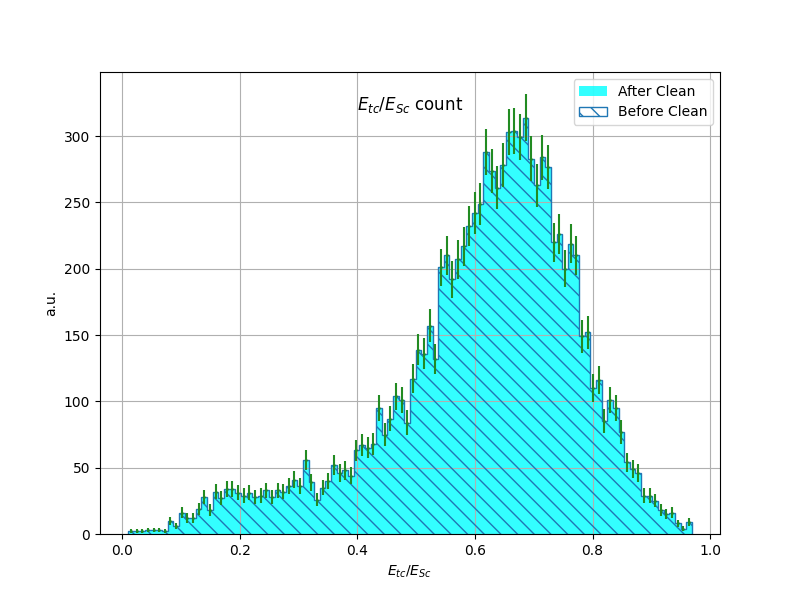

In [140]:
plt.figure(figsize=(8, 6))
n_after, bins_after, _ = plt.hist(baryenergy_tc/baryenergy_simSC, bins=100, label = "After Clean", color= 'cyan', alpha = 0.8 )
plt.hist(baryenergy_tc_OFF/baryenergy_simSC_OFF, bins=100, label = "Before Clean", facecolor = 'none', hatch= '\\\\' ,histtype='step')

bin_centers_after = 0.5 * (bins_after[:-1] + bins_after[1:])
plt.errorbar(bin_centers_after, n_after, yerr=np.sqrt(n_after), fmt='o', color='forestgreen', alpha=1, ms = 0.9)

plt.xlabel(r'$E_{tc}/E_{Sc}$')
plt.ylabel('a.u.')
plt.title(r'$E_{tc}/E_{Sc}$ count', x = 0.5, y = 0.9)
plt.legend()
plt.grid()
plt.show()


### s

In [7]:
ak.sum(energy_simSC_OFF, axis = 0) == ak.sum(energy_simSC, axis = 0)

<Array [[False, True, True, True, ..., True, True, True]] type='1 * var * bool'>

In [25]:
# ak.sum(energy_simSC_OFF, axis = 0)
ak.sum(energy_simSC_OFF)

1007794.3129337505

In [26]:
ak.sum(energy_simSC)

1007794.3129337505

In [ ]:
N= 10001 #(<100)
non_empty_mask = ak.max(baryenergy_tc[:N], axis=1) > 0
Energy_SC = ak.drop_none(baryenergy_simSC[non_empty_mask])
Energy_tc = []

# # Weighted tracksters:
# for event, non_empty in enumerate(non_empty_mask):
#     if non_empty:
#         Energy_tc += [np.average(baryenergy_tc[evnt], weights = baryenergy_tc[evnt])]

# Highest energy tracksters:
mask = (baryenergy_tc[:N] == ak.max(baryenergy_tc[:N], axis=1)) & (ak.max(baryenergy_tc[:N], axis=1) != 0)
Energy_tc = ak.drop_none(ak.max(baryenergy_tc[:N], axis=1)[non_empty_mask])

Energy_tc = np.roll(Energy_tc, 1)

mask = (baryenergy_tc[:N] == ak.max(baryenergy_tc[:N], axis=1)) & (ak.max(baryenergy_tc[:N], axis=1) != 0)
Energy_tc = ak.flatten(baryenergy_tc[mask])

In [51]:
# ak.to_numpy()
# len()
# ak.sum(, axis = 1)  ak.sum(, axis = 1)

# diff_indices = ak.where( != )

array1_flat = ak.flatten(energy_c3Dh)
array2_flat = ak.flatten(energy_c3Dh_OFF)

# Check if they have the same length after flattening
# if len(array1_flat) != len(array2_flat):
#     raise ValueError("Arrays have different lengths after flattening and cannot be compared element-wise.")

# Convert to numpy and find indices where elements differ

# Retrieve differing elements
# diff_elements_array1 = array1_flat[diff_indices]
# diff_elements_array2 = array2_flat[diff_indices]


In [57]:
ak.sum(energy_c3Dh[0])

69.31534

In [63]:
j

3521

In [62]:
j = 0;
for i in range(10000):
    if ak.sum(energy_c3Dh[i]) != ak.sum(energy_c3Dh_OFF[i]):
        print(i, "th trackster different")
        j = j+1
    else:
        continue

1 th trackster different
3 th trackster different
22 th trackster different
23 th trackster different
24 th trackster different
53 th trackster different
54 th trackster different
57 th trackster different
58 th trackster different
59 th trackster different
60 th trackster different
61 th trackster different
62 th trackster different
73 th trackster different
74 th trackster different
76 th trackster different
78 th trackster different
79 th trackster different
83 th trackster different
84 th trackster different
85 th trackster different
86 th trackster different
89 th trackster different
90 th trackster different
93 th trackster different
94 th trackster different
95 th trackster different
96 th trackster different
97 th trackster different
98 th trackster different
101 th trackster different
102 th trackster different
103 th trackster different
104 th trackster different
105 th trackster different
108 th trackster different
109 th trackster different
113 th trackster different
114 th

In [50]:
len(array2_flat)

61723

In [34]:
ak.sum(ak.first([[], [energy_c3Dh]]))

AttributeError: module 'awkward' has no attribute 'first'

In [33]:
ak.sum(energy_c3Dh[:])-ak.sum(energy_c3Dh_OFF[:])

-0.375

<Array [[1.86, 0.436], ..., [1.84, 3.57, 0.438]] type='7 * var * float32'>

In [11]:
i = 0

IndexError: invalid index to scalar variable.

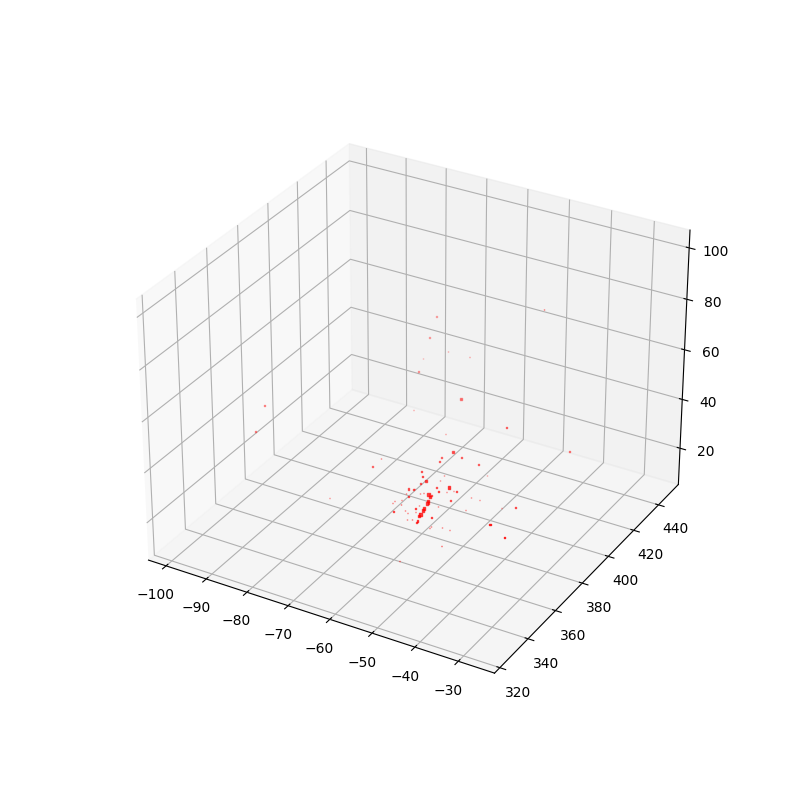

In [12]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')


color = 'red'
#Plotting SimTracksterSC
ax.scatter3D(x_simSC[i, 0], z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color, marker = 's')
ax.scatter3D(bary_x_simSC[i][0], bary_z_simSC[i][0], bary_y_simSC[i][0], color=color, edgecolor='black', s=baryenergy_simSC[i, 0], marker='D', linewidths=1)

#Plotting Clue3DHigh
for trackster_ in range(len(energy_tc[i])):#
    color = cmap(trackster_ / len(energy_tc[i]))
    ax.scatter3D(x_tc[i, trackster_], z_tc[i, trackster_], y_tc[i, trackster_], s= energy_tc[i, trackster_], color=color)
    ax.scatter3D(bary_x_tc[i][trackster_], bary_z_tc[i][trackster_], bary_y_tc[i][trackster_], color=color, edgecolor='black', s=baryenergy_tc[i, trackster_], marker='D', linewidths=1)


ax.set_title('Reco Tracksters with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')

# ax.legend()
plt.show()

Text(0.5, 0.98, 'Rec hits with Barycenter')

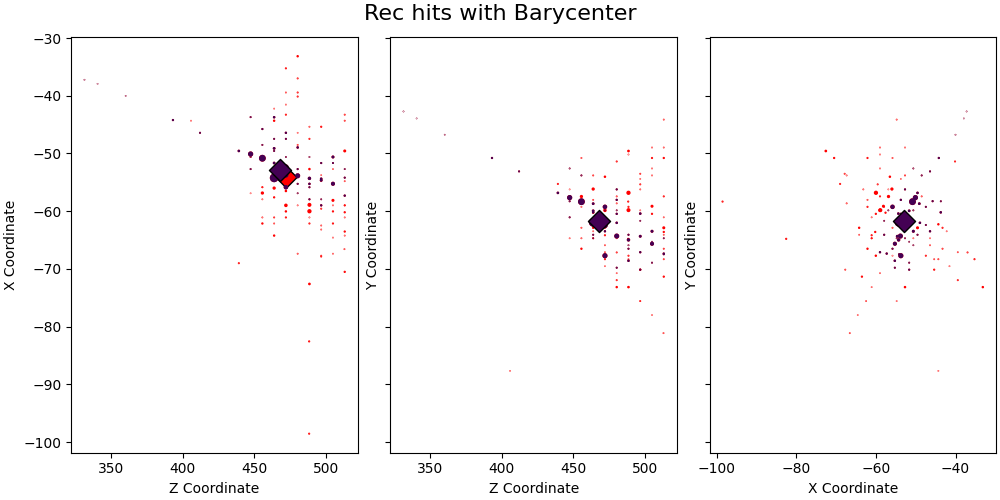

In [9]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, layout='constrained', sharey=True, figsize = (10,5))

color = 'red'
ax1.scatter(z_simSC[i, 0], x_simSC[i, 0], s=energy_simSC[i, 0], color=color)
ax1.scatter(bary_z_simSC[i][0], bary_x_simSC[i][0], color=color, edgecolor='black', s=baryenergy_simSC[i, 0], marker='D', linewidths=1)

for trackster_ in range(len(energy_tc[i])): #
    color = cmap(trackster_ / len(energy_tc[i]))
    ax1.scatter(z_tc[i, trackster_], x_tc[i, trackster_], s=energy_tc[i, trackster_], color=color)
    ax1.scatter(bary_z_tc[i][trackster_], bary_x_tc[i][trackster_], color=color, edgecolor='black', s=baryenergy_tc[i, trackster_], marker='D', linewidths=1)

ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

color = 'red'
ax2.scatter(z_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color)

for trackster_ in range(len(energy_tc[i])): #
    color = cmap(trackster_ / len(energy_tc[i]))
    ax2.scatter(z_tc[i, trackster_], y_tc[i, trackster_], s=energy_tc[i, trackster_], color=color)
    ax2.scatter(bary_z_tc[i][trackster_], bary_y_tc[i][trackster_], color=color, edgecolor='black', s=baryenergy_tc[i, trackster_], marker='D', linewidths=1)

ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')


color = 'red'
ax3.scatter(x_simSC[i, 0], y_simSC[i, 0], s= energy_simSC[i, 0], color=color)

for trackster_ in range(len(energy_tc[i])): #
    color = cmap(trackster_ / len(energy_tc[i]))
    ax3.scatter(x_tc[i, trackster_], y_tc[i, trackster_], s=energy_tc[i, trackster_], color=color)
    ax3.scatter(bary_x_tc[i][trackster_], bary_y_tc[i][trackster_], color=color, edgecolor='black', s=baryenergy_tc[i, trackster_], marker='D', linewidths=1)

    
ax3.set_xlabel('X Coordinate')
ax3.set_ylabel('Y Coordinate')


fig.suptitle('Rec hits with Barycenter', fontsize=16)

# SimtrackstersCP

In [4]:
coord_arr = file["ticlDumper/simtrackstersCP"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "pd")

In [5]:
energy_arr = file["ticlDumper/simtrackstersCP"].arrays(["vertices_energy" ], library= "ak")

In [6]:
energy_arr;
coord_arr;

In [6]:
# Hits

x = ak.flatten(coord_arr["vertices_x"][:], axis= 0)
y = ak.flatten(coord_arr["vertices_y"][:], axis= 0)
z = ak.flatten(coord_arr["vertices_z"][:], axis= 0)

In [7]:
# Barycenter
barycenters = file["ticlDumper/simtrackstersCP"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "pd")

bary_z = np.array(ak.flatten(barycenters["barycenter_z"][:], axis= None))
bary_x = np.array(ak.flatten(barycenters["barycenter_x"][:], axis= None))
bary_y = np.array(ak.flatten(barycenters["barycenter_y"][:], axis= None))

In [8]:
# Energy

energy = ak.flatten(energy_arr["vertices_energy"][:10], axis= 0)

In [14]:
e = eta(bary_x, bary_y, bary_z)
p = phi(bary_x, bary_y)

## Plotting

In [140]:
energy = energy*10

In [10]:
i = 2

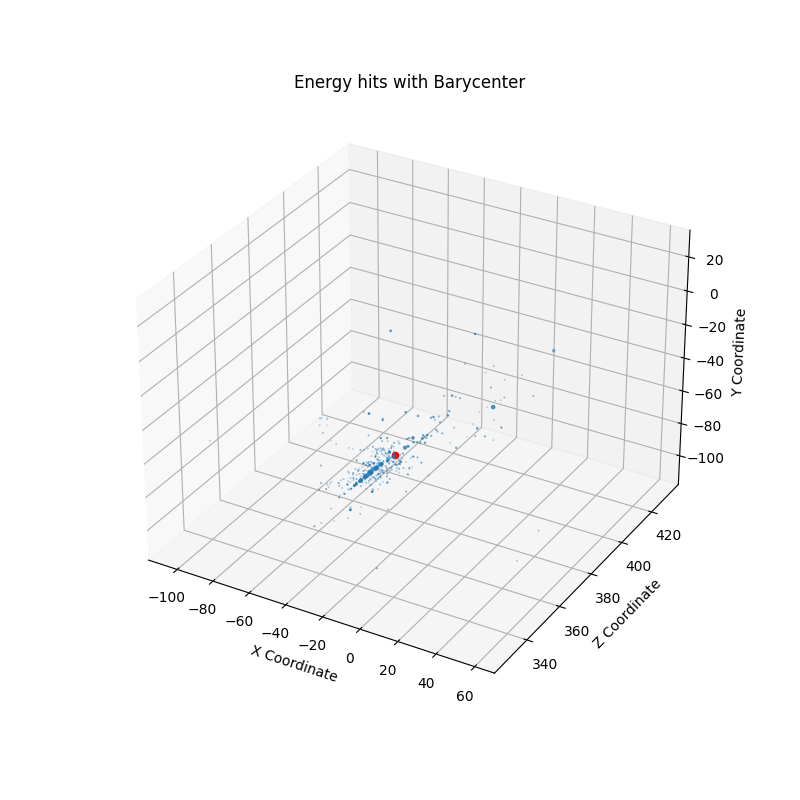

In [15]:
fig = plt.figure(figsize= (8,8))
 
# syntax for 3-D projection
ax = plt.axes(projection ='3d')
# ax = Axes3D(fig)
 
ax.scatter3D(x[i, 0], z[i, 0], y[i, 0], s= energy[i, 0])
ax.scatter3D(bary_x[i], bary_z[i], bary_y[i], color= 'red')

# ax.scatter(x, y, z, 'green')
ax.set_title('Energy hits with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')
plt.show()


Text(0.5, 0.98, 'Sim hits with Barycenter')

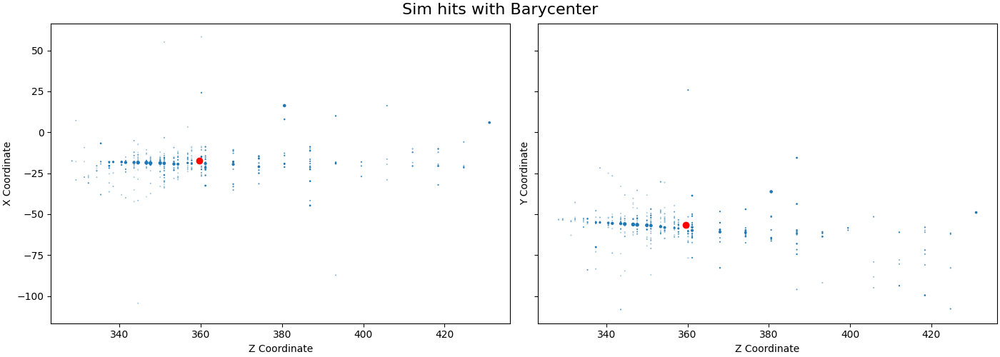

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, layout='constrained', sharey=True, figsize = (14,5))
ax1.scatter(z[i, 0], x[i, 0], s= energy[i, 0])
ax1.scatter(bary_z[i], bary_x[i], color = 'red')
ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

ax2.scatter(z[i, 0], y[i, 0], s= energy[i, 0])
ax2.scatter(bary_z[i], bary_y[i], color = 'red')
ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')
fig.suptitle('Sim hits with Barycenter', fontsize=16)

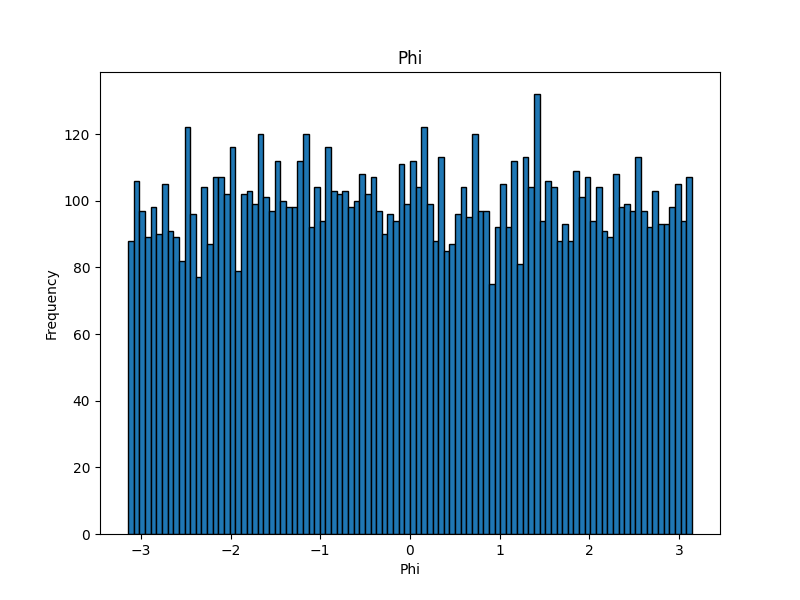

In [13]:
plt.figure(figsize=(8, 6))
plt.hist(p, bins=100, edgecolor='black')
plt.xlabel('Phi')
plt.ylabel('Frequency')
plt.title('Phi')
plt.show()

In [36]:
# fig, (ax1, ax2) = plt.subplots(1, 2, layout='constrained', sharey=True, figsize = (10,5))

# ax1.hist(e, bins=100, edgecolor='black')
# ax1.set_xlabel('Eta')
# ax1.set_ylabel('Count')

# ax2.hist(p, bins=100, edgecolor='black')
# ax2.set_xlabel('Phi')
# ax2.set_ylabel('Count')
# fig.suptitle('Polar angles', fontsize=16)

In [228]:
# fig = plt.figure(figsize= (5,5))
# plt.scatter(y[i, 0], x[i, 0], s= energy[i, 0])
# plt.scatter(bary_y[i], bary_x[i], color = 'red')
# fig.set_xlabel('Z Coordinate')
# ax.set_ylabel('X Coordinate')

# SimtrackstersSC

In [4]:
coord_arr = file["ticlDumper/simtrackstersSC"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "pd")
energy_arr = file["ticlDumper/simtrackstersSC"].arrays(["vertices_energy" ], library= "ak")
barycenters = file["ticlDumper/simtrackstersSC"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "pd")

In [10]:
# Hits
x = ak.flatten(coord_arr["vertices_x"], axis= 0)
y = ak.flatten(coord_arr["vertices_y"], axis= 0)
z = ak.flatten(coord_arr["vertices_z"], axis= 0)

# Barycenter
bary_z = np.array(ak.flatten(barycenters["barycenter_z"][:100], axis= None))
bary_x = np.array(ak.flatten(barycenters["barycenter_x"][:100], axis= None))
bary_y = np.array(ak.flatten(barycenters["barycenter_y"][:100], axis= None))

# Energy
energy = ak.flatten(energy_arr["vertices_energy"][:100], axis= 0)

In [6]:
e = eta(bary_x, bary_y, bary_z)
p = phi(bary_x, bary_y)

## Plotting

In [12]:
energy = energy*10

In [7]:
i = 2

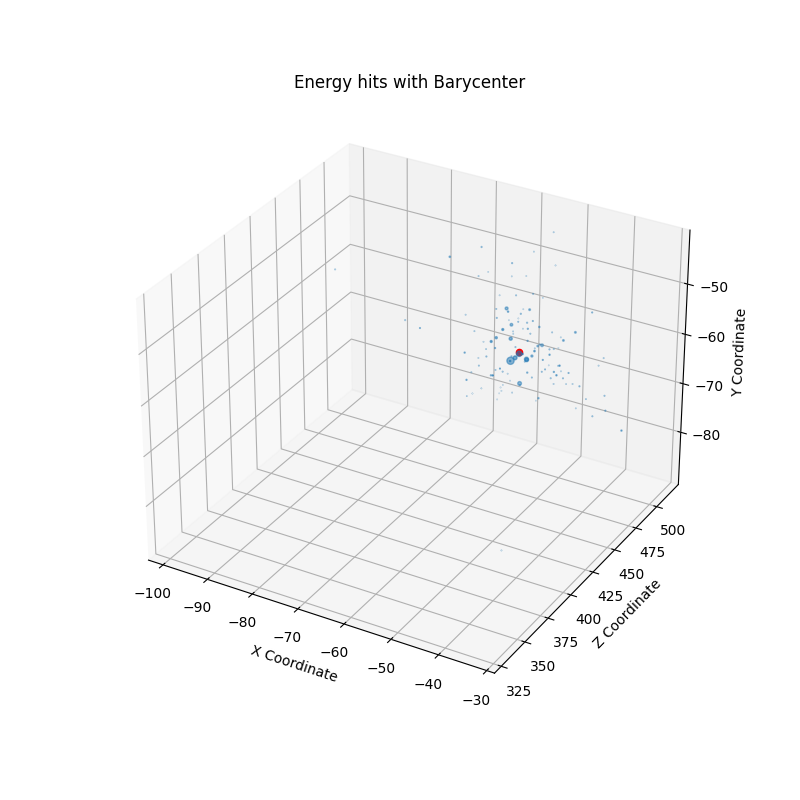

In [11]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')
ax.scatter3D(x[i, 0], z[i, 0], y[i, 0], s= energy[i, 0])
ax.scatter3D(bary_x[i], bary_z[i], bary_y[i], color= 'red')
ax.set_title('Energy hits with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')
plt.show()

Text(0.5, 0.98, 'Sim hits with Barycenter')

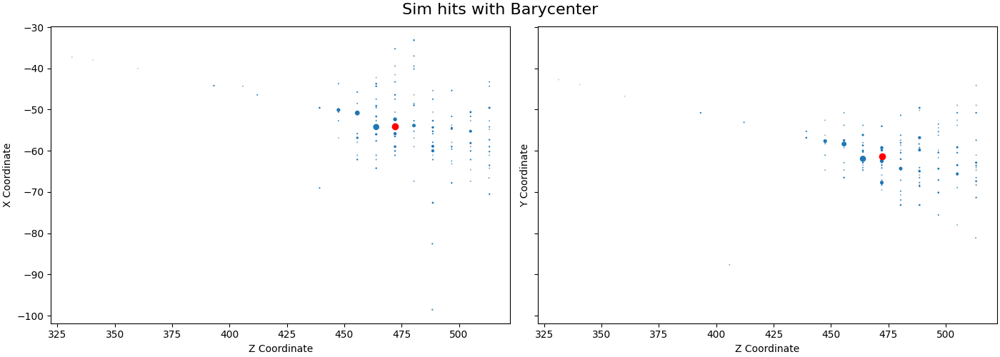

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, layout='constrained', sharey=True, figsize = (14,5))
ax1.scatter(z[i, 0], x[i, 0], s= energy[i, 0])
ax1.scatter(bary_z[i], bary_x[i], color = 'red')
# ax1.set_title('damped')
ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

ax2.scatter(z[i, 0], y[i, 0], s= energy[i, 0])
ax2.scatter(bary_z[i], bary_y[i], color = 'red')
ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')
# ax2.set_title('undamped')

fig.suptitle('Sim hits with Barycenter', fontsize=16)

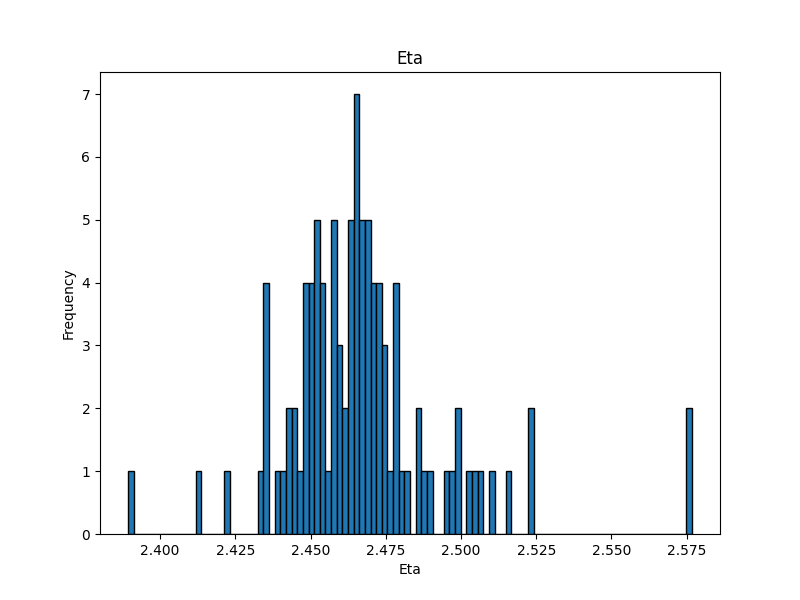

In [37]:
plt.figure(figsize=(8, 6))
plt.hist(e, bins=100, edgecolor='black')
plt.xlabel('Eta')
plt.ylabel('Frequency')
plt.title('Eta')
plt.show()

# trackstersCLUE3DHigh

In [38]:
coord_arr = file["ticlDumper/trackstersCLUE3DHigh"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "pd")
energy_arr = file["ticlDumper/trackstersCLUE3DHigh"].arrays(["vertices_energy" ], library= "ak")
barycenters = file["ticlDumper/trackstersCLUE3DHigh"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "pd")

In [39]:
# Hits
x = ak.flatten(coord_arr["vertices_x"][:100], axis= 0)
y = ak.flatten(coord_arr["vertices_y"][:100], axis= 0)
z = ak.flatten(coord_arr["vertices_z"][:100], axis= 0)

# Energy
energy = ak.flatten(energy_arr["vertices_energy"][:100], axis= 0)
baryenergy = file["ticlDumper/trackstersCLUE3DHigh/regressed_energy"].arrays(library = "ak")

# Barycenter
bary_z = barycenters["barycenter_z"] #np.array(ak.flatten(barycenters["barycenter_z"][:10], axis= None))
bary_x = barycenters["barycenter_x"] #np.array(ak.flatten(barycenters["barycenter_x"][:10], axis= None))
bary_y = barycenters["barycenter_y"] #np.array(ak.flatten(barycenters["barycenter_y"][:10], axis= None))

## Plots

In [40]:
energy = energy
baryenergy = baryenergy["regressed_energy"]

In [41]:
i = 2

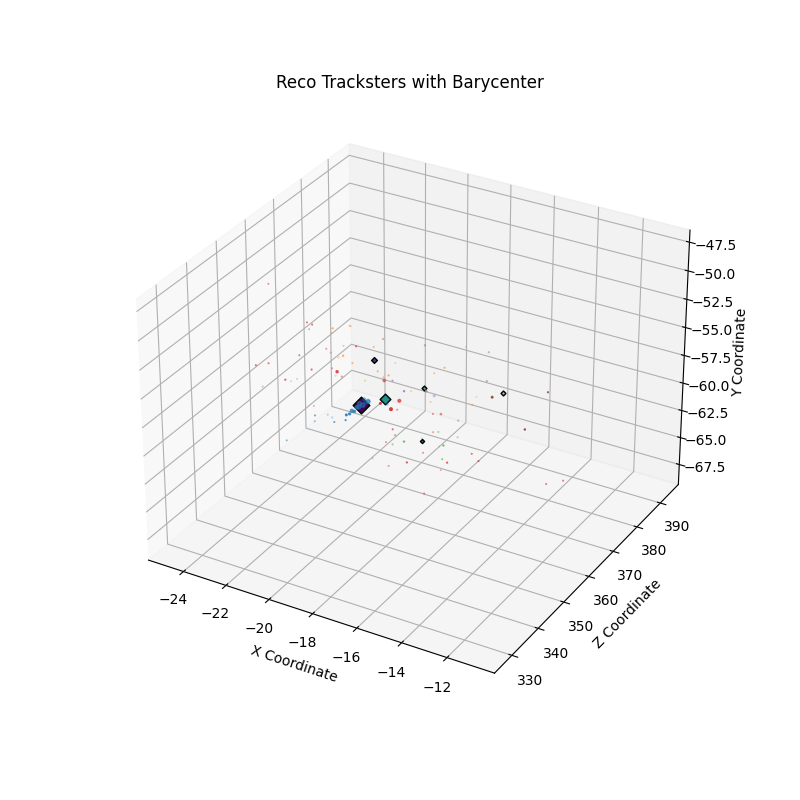

In [42]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')

for trackster_ in range(len(energy[i])):#
    color = cmap(trackster_ / len(energy[i]))
    ax.scatter3D(x[i, trackster_], z[i, trackster_], y[i, trackster_], s= energy[i, trackster_])
    ax.scatter3D(bary_x[i][trackster_], bary_z[i][trackster_], bary_y[i][trackster_], color=color, edgecolor='black', s=baryenergy[i, trackster_], marker='D', linewidths=1)

ax.set_title('Reco Tracksters with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')

# ax.legend()
plt.show()

Text(0.5, 0.98, 'Rec hits with Barycenter')

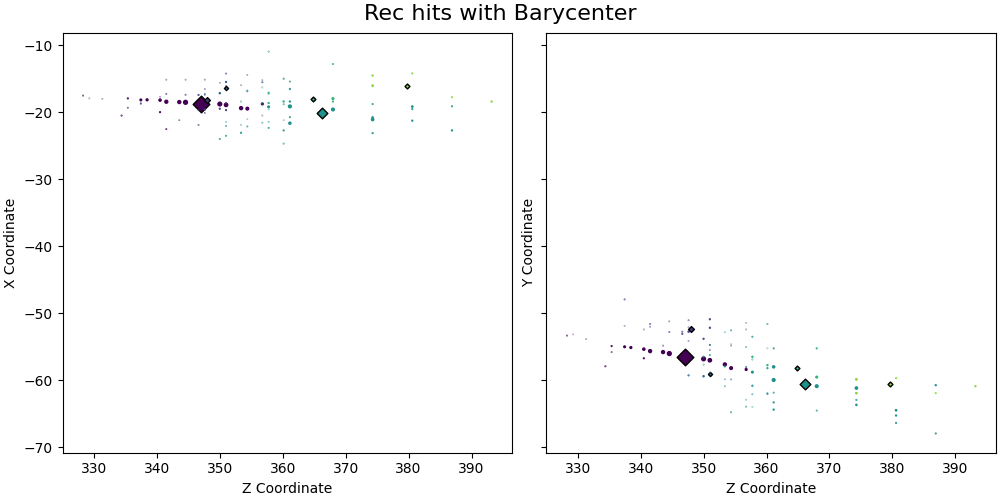

In [43]:
fig, (ax1, ax2) = plt.subplots(1, 2, layout='constrained', sharey=True, figsize = (10,5))

for trackster_ in range(len(energy[i])): #
    color = cmap(trackster_ / len(energy[i]))
    ax1.scatter(z[i, trackster_], x[i, trackster_], s=energy[i, trackster_], color=color)
    ax1.scatter(bary_z[i][trackster_], bary_x[i][trackster_], color=color, edgecolor='black', s=baryenergy[i, trackster_], marker='D', linewidths=1)

ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

for trackster_ in range(len(energy[i])): #len(energy[i])
    color = cmap(trackster_ / len(energy[i]))
    ax2.scatter(z[i, trackster_], y[i, trackster_], s=energy[i, trackster_], color=color)
    ax2.scatter(bary_z[i][trackster_], bary_y[i][trackster_], color=color, edgecolor='black', s=baryenergy[i, trackster_], marker='D', linewidths=1)
    
ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')

fig.suptitle('Rec hits with Barycenter', fontsize=16)

# trackstersTiclCandidate

In [44]:
coord_arr = file["ticlDumper/trackstersTiclCandidate"].arrays(["vertices_x", "vertices_y", "vertices_z" ], library= "pd")
energy_arr = file["ticlDumper/trackstersTiclCandidate"].arrays(["vertices_energy" ], library= "ak")
barycenters = file["ticlDumper/trackstersTiclCandidate"].arrays(["barycenter_x", "barycenter_y" , "barycenter_z"], library= "pd")

In [45]:
# Hits
x = ak.flatten(coord_arr["vertices_x"], axis= 0)
y = ak.flatten(coord_arr["vertices_y"], axis= 0)
z = ak.flatten(coord_arr["vertices_z"], axis= 0)

# Barycenter
bary_z = barycenters["barycenter_z"] #np.array(ak.flatten(barycenters["barycenter_z"][:10], axis= None))
bary_x = barycenters["barycenter_x"] #np.array(ak.flatten(barycenters["barycenter_x"][:10], axis= None))
bary_y = barycenters["barycenter_y"] #np.array(ak.flatten(barycenters["barycenter_y"][:10], axis= None))

# Energy
energy = ak.flatten(energy_arr["vertices_energy"], axis= 0)

## Plots

In [282]:
energy = energy*10

In [46]:
i = 2

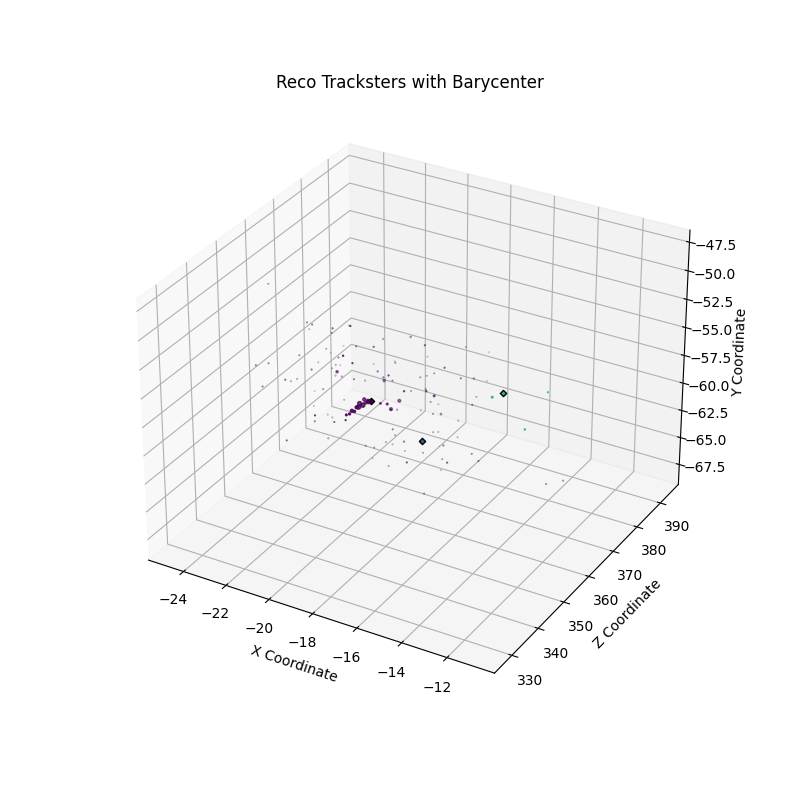

In [49]:
fig = plt.figure(figsize= (8,8))
ax = plt.axes(projection ='3d')

for trackster_ in range(len(energy[i])):
    color = cmap(trackster_ / len(energy[i]))
    ax.scatter3D(x[i, trackster_], z[i, trackster_], y[i, trackster_], s= energy[i, trackster_], color=color)
    ax.scatter3D(bary_x[i][trackster_], bary_z[i][trackster_], bary_y[i][trackster_], color=color, edgecolor='black', s=10, marker='D', linewidths=1)

ax.set_title('Reco Tracksters with Barycenter')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Z Coordinate')
ax.set_zlabel('Y Coordinate')

# ax.legend()
plt.show()

Text(0, 0.5, 'Y Coordinate')

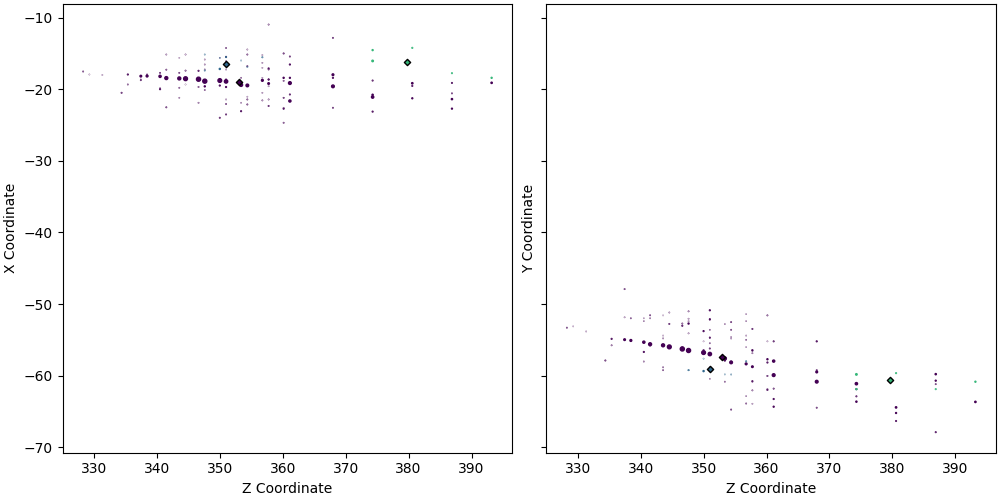

In [48]:
fig, (ax1, ax2) = plt.subplots(1, 2, layout='constrained', sharey=True, figsize = (10,5))

for trackster_ in range(len(energy[i])):
    color = cmap(trackster_ / len(energy[i]))
    ax1.scatter(z[i, trackster_], x[i, trackster_], s=energy[i, trackster_], color=color)
    ax1.scatter(bary_z[i][trackster_], bary_x[i][trackster_], color=color, edgecolor='black', s=10, marker='D', linewidths=1)

ax1.set_xlabel('Z Coordinate')
ax1.set_ylabel('X Coordinate')

for trackster_ in range(len(energy[i])):
    color = cmap(trackster_ / len(energy[i]))
    ax2.scatter(z[i, trackster_], y[i, trackster_], s=energy[i, trackster_], color=color)
    ax2.scatter(bary_z[i][trackster_], bary_y[i][trackster_], color=color, edgecolor='black', s=10, marker='D', linewidths=1)
    
ax2.set_xlabel('Z Coordinate')
ax2.set_ylabel('Y Coordinate')

# Extra

# Rough

In [ ]:
N= 10 #(<100)
e = []          ;    p = []
e_c3Dh = []     ;    p_c3Dh = []
for evnt in range(N):
    e_c3Dh += [np.average(eta(bary_x_c3Dh[evnt], bary_y_c3Dh[evnt], bary_z_c3Dh[evnt]), weights = baryenergy_c3Dh[evnt])]
    p_c3Dh += [np.average(phi(bary_x_c3Dh[evnt], bary_y_c3Dh[evnt]), weights = baryenergy_c3Dh[evnt])]

e = eta(bary_x_simSC[:N], bary_y_simSC[:N], bary_z_simSC[:N])
p = phi(bary_x_simSC[:N], bary_y_simSC[:N])

In [8]:
x = ak.flatten(coord_arr_ON["barycenter_x"], axis= 0)

In [9]:
x

<Array [-54.1, -52.4, 56.3, ... -21, -41.2] type='10000 * float64'>

In [128]:
coord_arr_ON["barycenter_x"]

entry  subentry
0      0          -52.856857
1      0          -52.880833
       1          -51.405590
2      0           55.823467
       1           49.269585
                     ...    
9997   0            7.927220
9998   0          -21.497898
       1          -20.974022
       2          -25.051600
9999   0          -37.771992
Name: barycenter_x, Length: 22496, dtype: float32

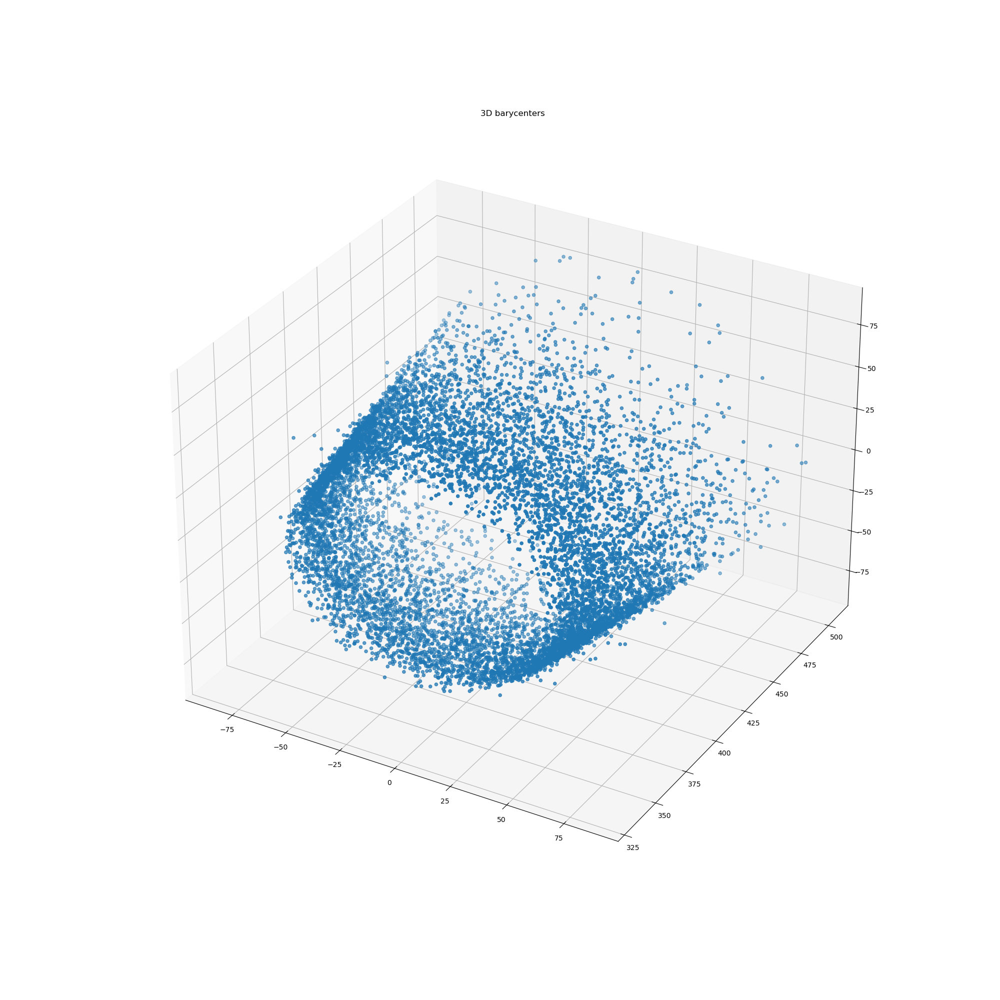

In [10]:
fig = plt.figure(figsize= (20,20))
 
# syntax for 3-D projection
ax = plt.axes(projection ='3d')
# ax = Axes3D(fig)
 
# defining all 3 axis
z = np.array(ak.flatten(coord_arr_ON["barycenter_z"], axis= None))
x = np.array(ak.flatten(coord_arr_ON["barycenter_x"], axis= None))
y = np.array(ak.flatten(coord_arr_ON["barycenter_y"], axis= None))

# x = x[:10]
# y = y[:10]
# z = z[:10]

ax.scatter3D(x, z, y, 'green')
# ax.scatter(x, y, z, 'green')
ax.set_title('3D barycenters')
plt.show()


In [12]:
x

array([-54.06666183, -52.37641907,  56.31629562, ...,   7.89166403,
       -21.01819611, -41.19424057])

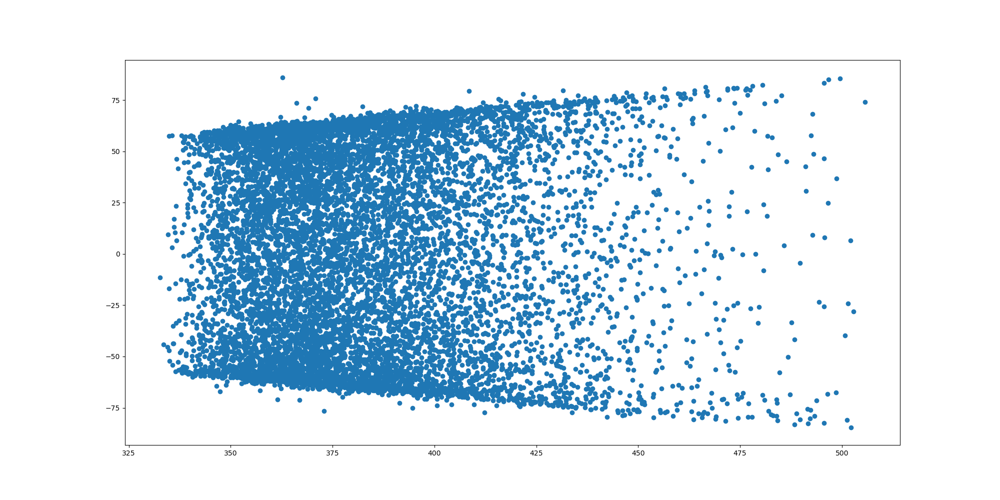

In [18]:
fig = plt.figure(figsize=(20,10))
plt.scatter(z, x)

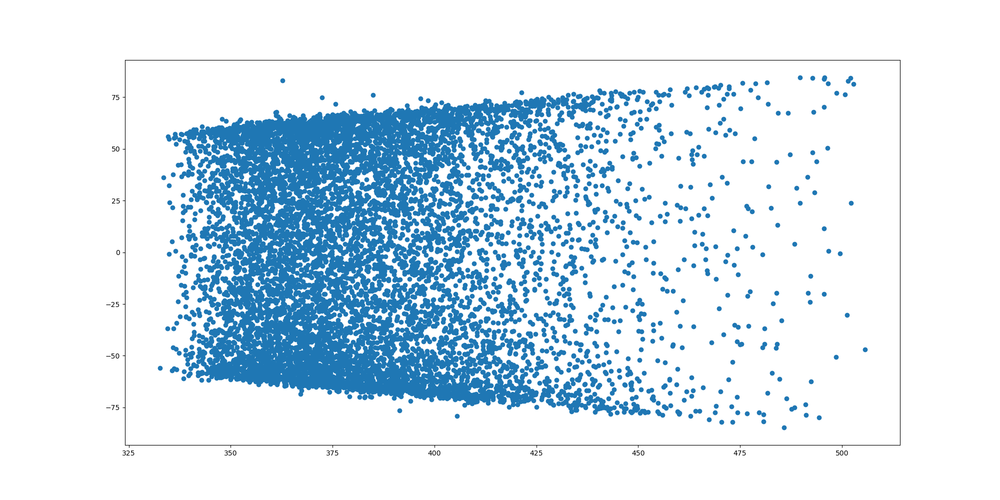

In [19]:
fig = plt.figure(figsize=(20,10))
plt.scatter(z, y)

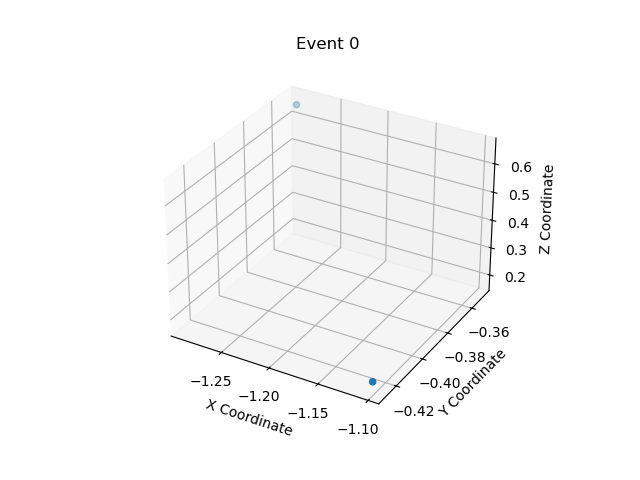

<function __main__.plot_event(event_num)>

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interact, IntSlider

# Sample DataFrame for demonstration
# Replace this with your actual data
# Assume the DataFrame has columns ['x', 'y', 'z', 'event'] where 'event' is the event number

# Simulating some 3D data for 10K events
data = {
    'x': pd.np.random.randn(10000),
    'y': pd.np.random.randn(10000),
    'z': pd.np.random.randn(10000),
    'event': pd.np.random.randint(0, 10000, 10000)
}

df = pd.DataFrame(data)

# Function to plot 3D coordinates for a given event number
def plot_event(event_num):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    # Select data for the chosen event
    event_data = df[df['event'] == event_num]
    
    # Plotting the 3D scatter plot
    ax.scatter(event_data['x'], event_data['y'], event_data['z'])
    
    # Setting labels and title
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    plt.title(f'Event {event_num}')
    
    plt.show()

# Creating an interactive slider to browse through events
slider = IntSlider(min=0, max=9999, step=1, description='Event')

# Interact function to link slider and plotting function
interact(plot_event, event_num=slider)


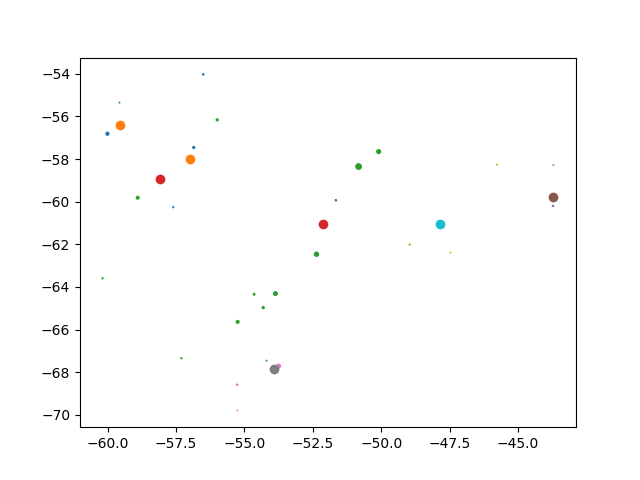

In [265]:
fig = plt.figure()
for trackster_ in range(len(energy[i])):
    plt.scatter(x[i, trackster_], y[i, trackster_], s= energy[i, trackster_])
    plt.scatter(bary_x[i][trackster_], bary_y[i][trackster_])

plt.show()

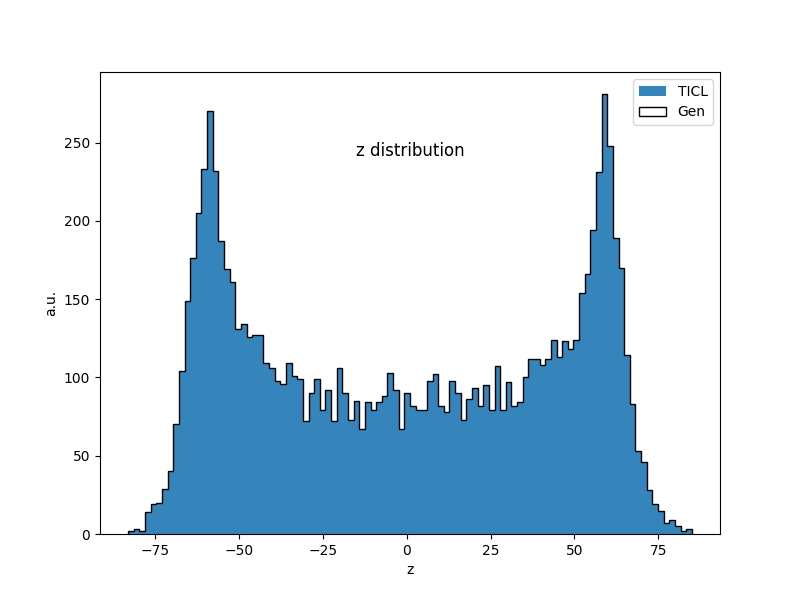

In [99]:
plt.figure(figsize=(8, 6))
plt.hist(bary_y_tc, bins=100,  alpha = 0.9, label= 'TICL')#, color = 'orange') #, color = 'blue' ,  linestyle='-',  edgecolor='black', ,  linewidth=.5
plt.hist(bary_y_tc_OFF, bins=100, facecolor = 'none', histtype='step', alpha = 1, label= 'Gen',   edgecolor='black', linewidth=1) #, color= 'red', , hatch= "//"
plt.xlabel(r'z')
plt.ylabel('a.u.')
plt.title('z distribution', x = 0.5, y = 0.8)
plt.legend()
plt.show()